## Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
! unzip "/content/drive/MyDrive/dataset (1)/mnist.pkl.zip"

Archive:  /content/drive/MyDrive/dataset (1)/mnist.pkl.zip
replace mnist.pkl? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: mnist.pkl               


In [ ]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('/content/drive/MyDrive/dataset (1)/gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset

In [ ]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


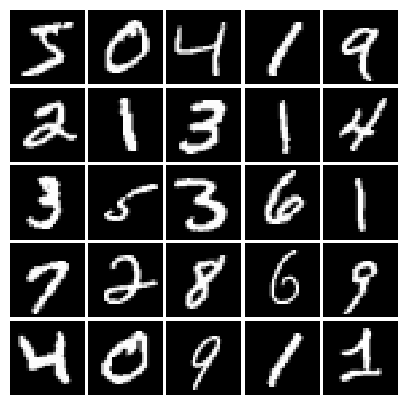

In [ ]:
# show a batch
mnist = MNIST(batch_size=25)
show_images(mnist.X[:25])

## LeakyReLU


In [ ]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


In [ ]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise


In [ ]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


In [ ]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator


In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(input_shape=(784,)),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

In [ ]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


## Generator


In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(input_shape=(noise_dim,)),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

In [ ]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss



In [ ]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

In [ ]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [ ]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 0


# Optimizing our loss


In [ ]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)

    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training GAN!


In [ ]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

Instructions for updating:
Use tf.identity with explicit device placement instead.


Epoch: 0, Iter: 0, D: 1.252, G:0.7252


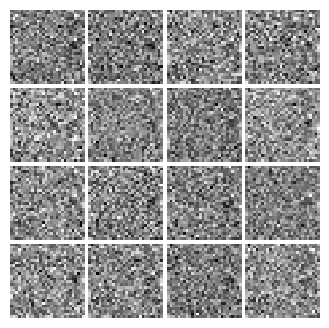

Epoch: 0, Iter: 20, D: 0.573, G:0.9539


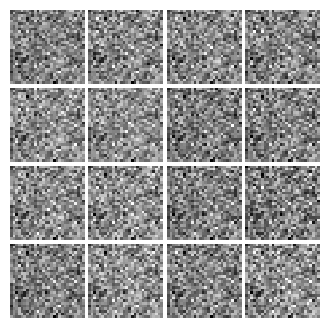

Epoch: 0, Iter: 40, D: 0.5042, G:1.197


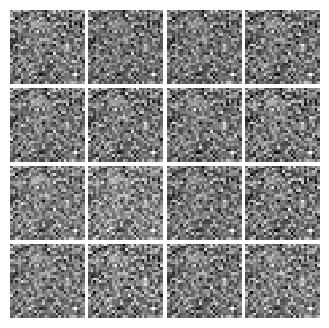

Epoch: 0, Iter: 60, D: 2.348, G:0.4702


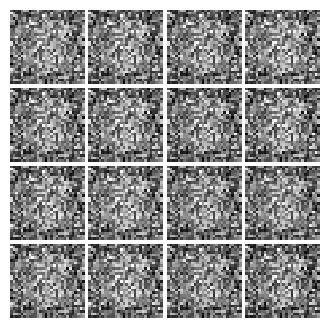

Epoch: 0, Iter: 80, D: 1.191, G:1.965


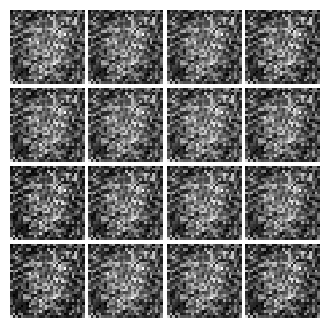

Epoch: 0, Iter: 100, D: 1.312, G:2.204


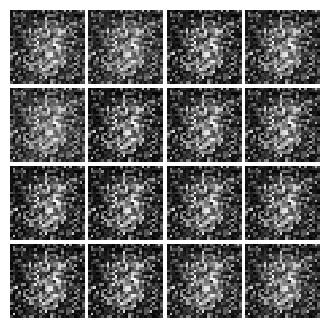

Epoch: 0, Iter: 120, D: 1.36, G:1.661


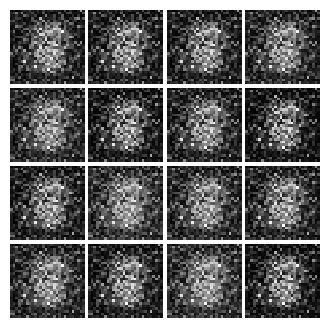

Epoch: 0, Iter: 140, D: 0.9647, G:1.157


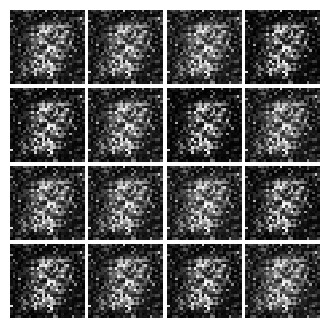

Epoch: 0, Iter: 160, D: 1.246, G:1.199


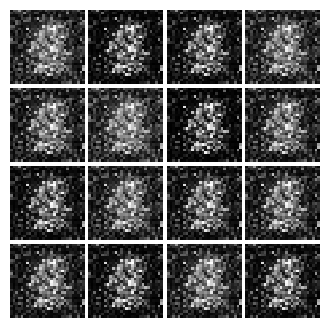

Epoch: 0, Iter: 180, D: 0.9563, G:1.16


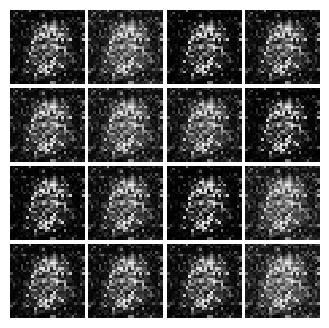

Epoch: 0, Iter: 200, D: 1.384, G:1.355


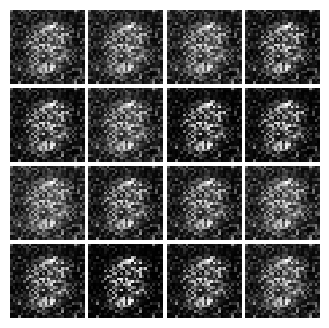

Epoch: 0, Iter: 220, D: 1.072, G:1.743


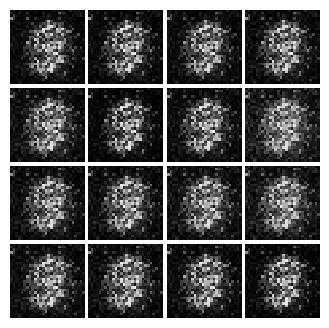

Epoch: 0, Iter: 240, D: 1.558, G:0.9675


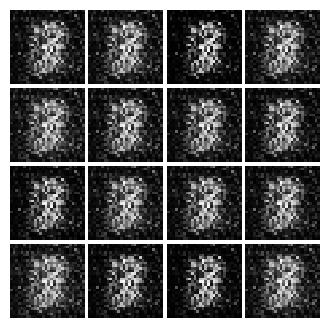

Epoch: 0, Iter: 260, D: 1.006, G:1.553


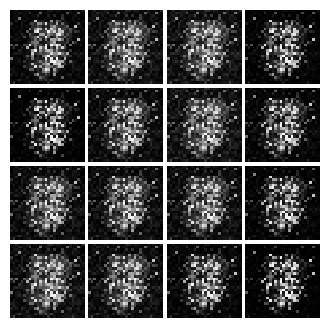

Epoch: 0, Iter: 280, D: 0.7391, G:1.907


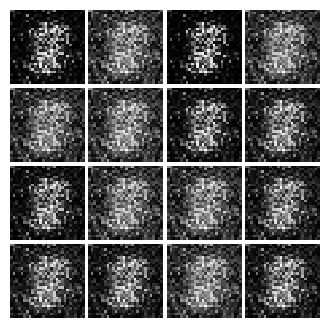

Epoch: 0, Iter: 300, D: 1.374, G:1.115


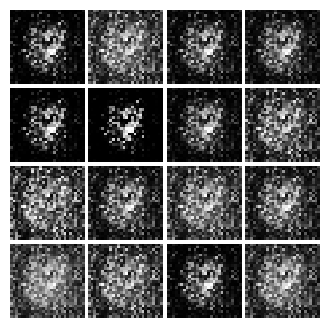

Epoch: 0, Iter: 320, D: 1.29, G:1.329


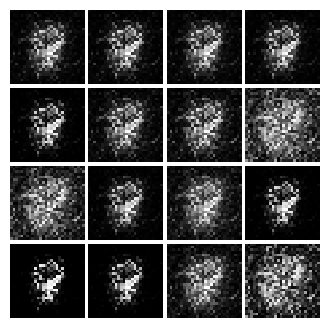

Epoch: 0, Iter: 340, D: 0.8169, G:2.134


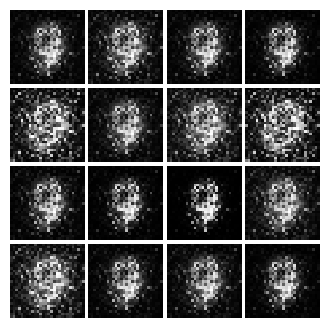

Epoch: 0, Iter: 360, D: 1.38, G:1.684


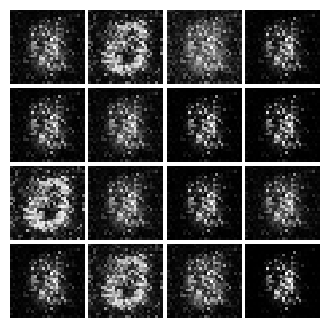

Epoch: 0, Iter: 380, D: 1.124, G:2.064


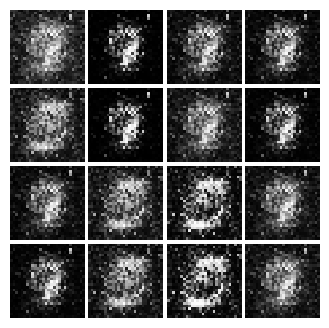

Epoch: 0, Iter: 400, D: 0.9087, G:2.133


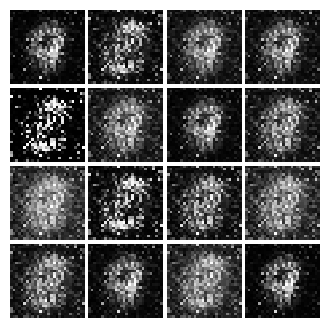

Epoch: 0, Iter: 420, D: 1.036, G:1.963


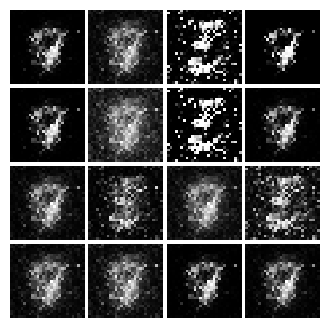

Epoch: 0, Iter: 440, D: 1.199, G:1.58


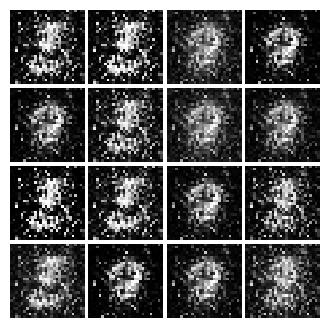

Epoch: 0, Iter: 460, D: 0.9959, G:2.61


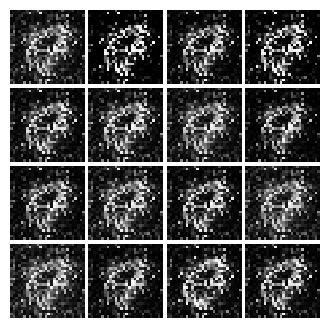

Epoch: 1, Iter: 480, D: 0.8571, G:0.7169


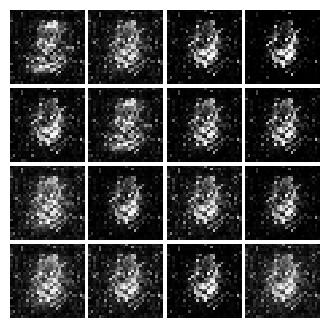

Epoch: 1, Iter: 500, D: 1.143, G:2.177


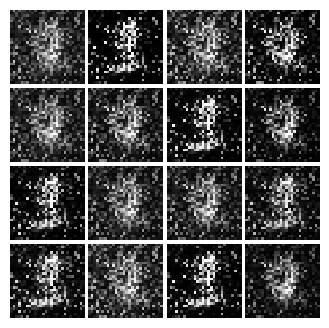

Epoch: 1, Iter: 520, D: 1.684, G:2.847


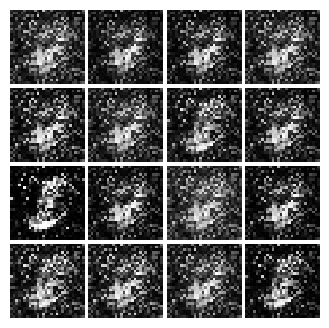

Epoch: 1, Iter: 540, D: 0.9213, G:1.236


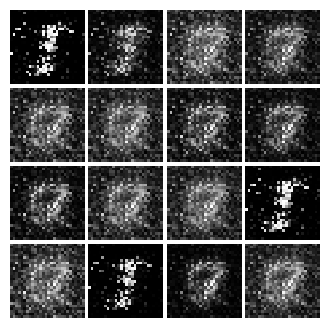

Epoch: 1, Iter: 560, D: 0.7392, G:1.898


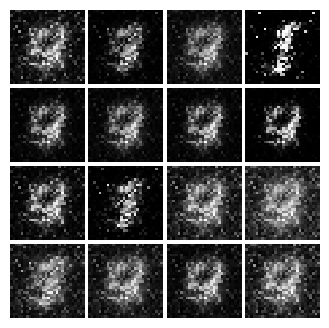

Epoch: 1, Iter: 580, D: 1.147, G:1.186


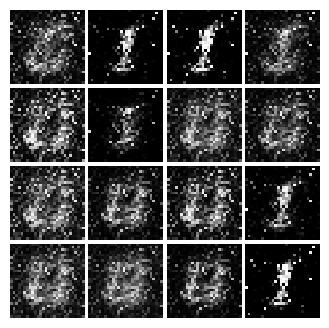

Epoch: 1, Iter: 600, D: 1.17, G:1.978


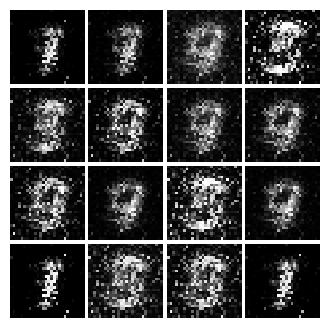

Epoch: 1, Iter: 620, D: 0.8783, G:2.392


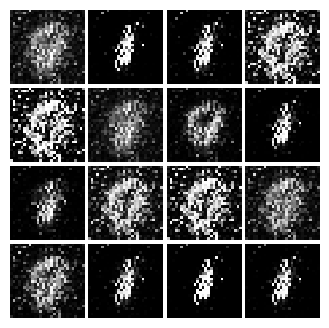

Epoch: 1, Iter: 640, D: 0.8095, G:1.845


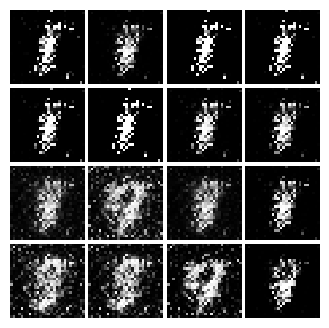

Epoch: 1, Iter: 660, D: 0.8168, G:1.522


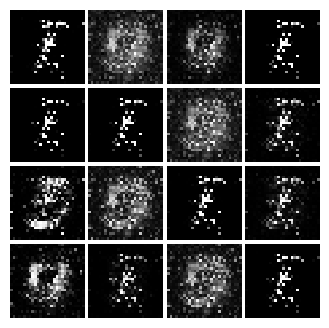

Epoch: 1, Iter: 680, D: 1.171, G:1.86


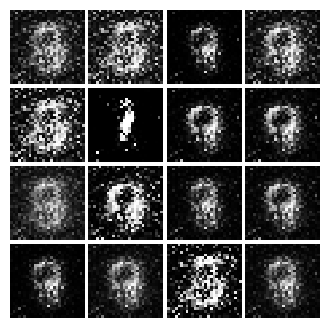

Epoch: 1, Iter: 700, D: 1.35, G:1.745


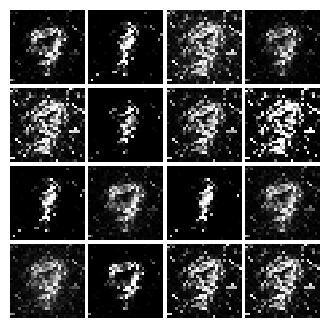

Epoch: 1, Iter: 720, D: 0.9429, G:1.696


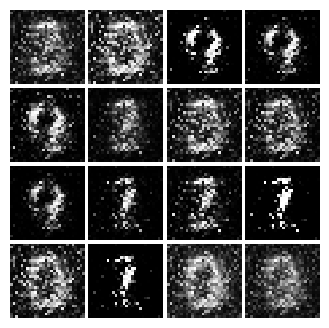

Epoch: 1, Iter: 740, D: 1.114, G:1.399


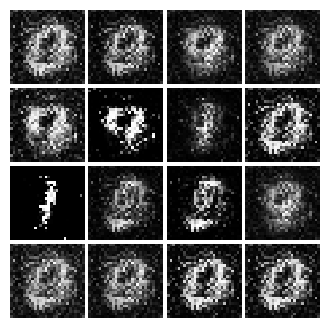

Epoch: 1, Iter: 760, D: 0.9088, G:1.323


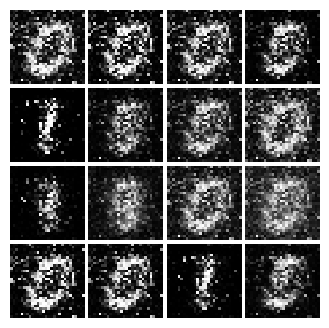

Epoch: 1, Iter: 780, D: 1.178, G:1.964


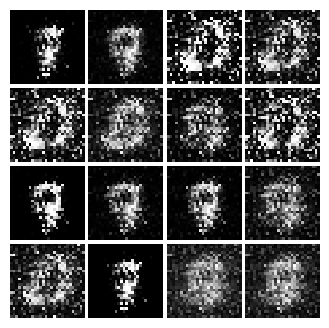

Epoch: 1, Iter: 800, D: 1.176, G:1.172


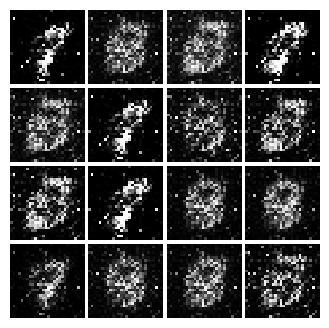

Epoch: 1, Iter: 820, D: 1.076, G:0.9857


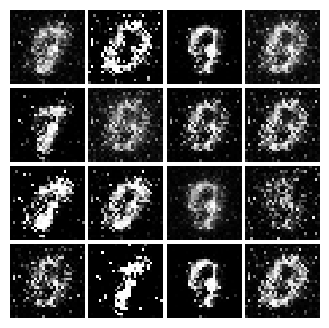

Epoch: 1, Iter: 840, D: 0.9593, G:1.296


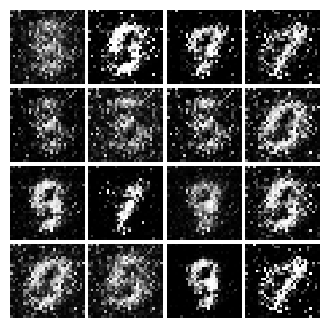

Epoch: 1, Iter: 860, D: 1.147, G:0.713


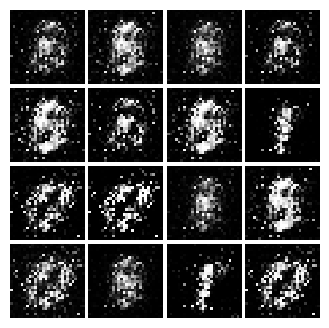

Epoch: 1, Iter: 880, D: 1.365, G:1.586


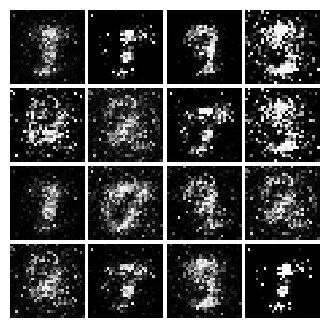

Epoch: 1, Iter: 900, D: 1.078, G:1.539


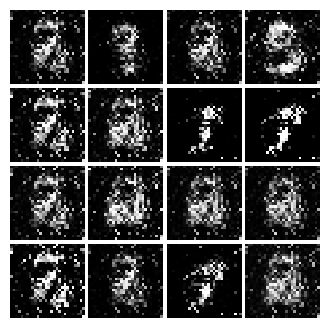

Epoch: 1, Iter: 920, D: 1.215, G:1.238


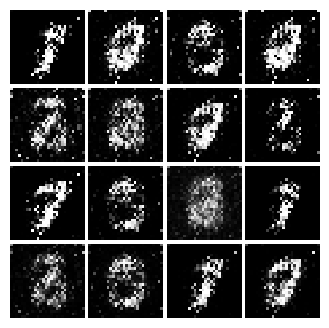

Epoch: 2, Iter: 940, D: 1.394, G:1.799


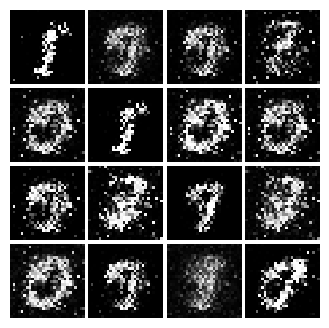

Epoch: 2, Iter: 960, D: 1.195, G:1.842


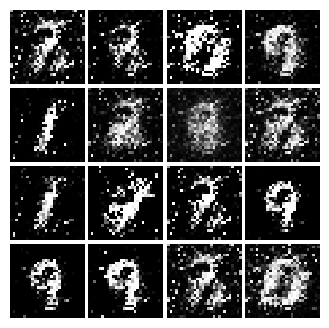

Epoch: 2, Iter: 980, D: 1.04, G:1.648


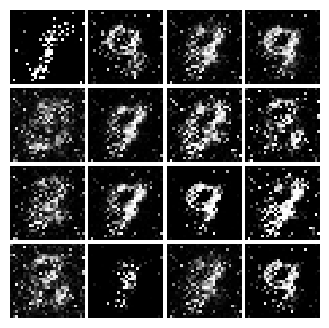

Epoch: 2, Iter: 1000, D: 0.897, G:1.669


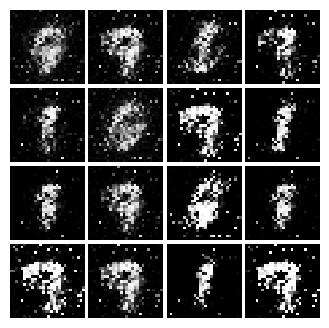

Epoch: 2, Iter: 1020, D: 1.487, G:1.285


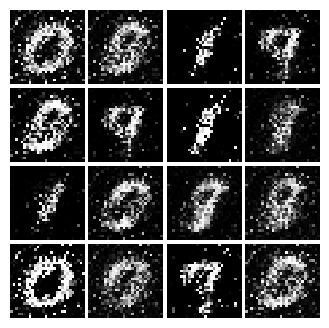

Epoch: 2, Iter: 1040, D: 1.084, G:0.9408


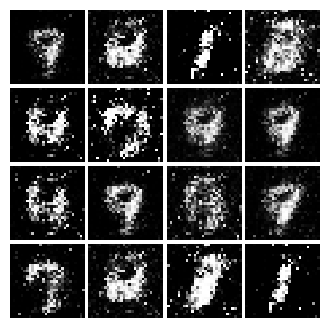

Epoch: 2, Iter: 1060, D: 1.295, G:1.083


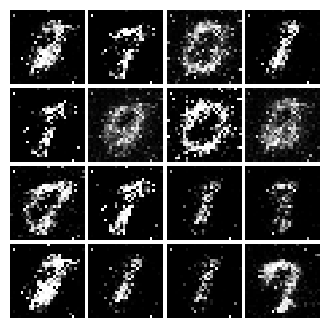

Epoch: 2, Iter: 1080, D: 1.202, G:1.002


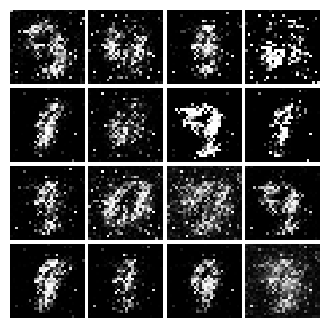

Epoch: 2, Iter: 1100, D: 1.095, G:1.309


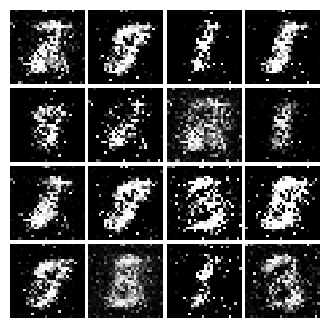

Epoch: 2, Iter: 1120, D: 1.234, G:1.134


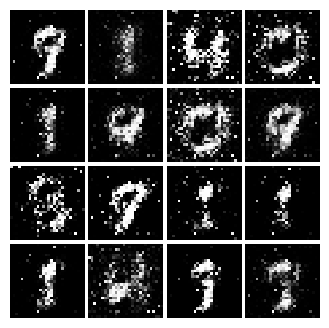

Epoch: 2, Iter: 1140, D: 1.264, G:1.091


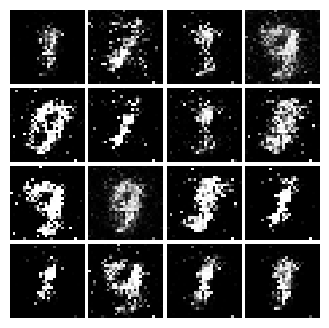

Epoch: 2, Iter: 1160, D: 1.262, G:1.346


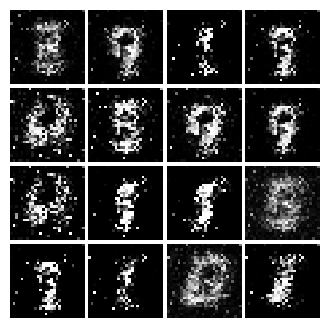

Epoch: 2, Iter: 1180, D: 1.097, G:1.107


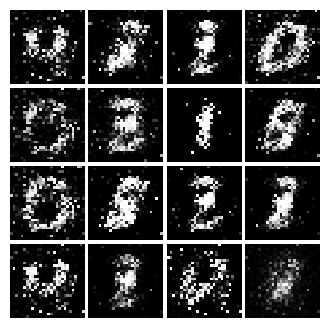

Epoch: 2, Iter: 1200, D: 1.146, G:1.126


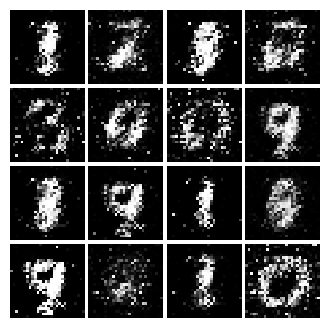

Epoch: 2, Iter: 1220, D: 1.113, G:1.258


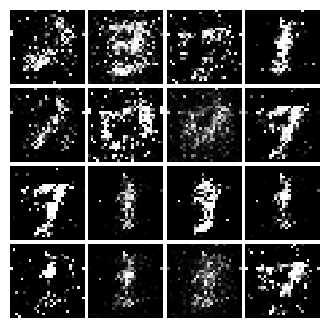

Epoch: 2, Iter: 1240, D: 1.238, G:1.068


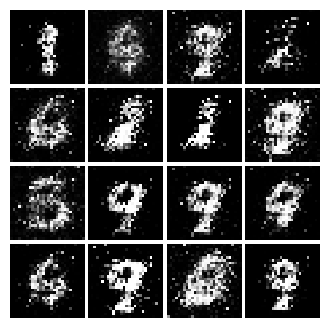

Epoch: 2, Iter: 1260, D: 1.436, G:1.044


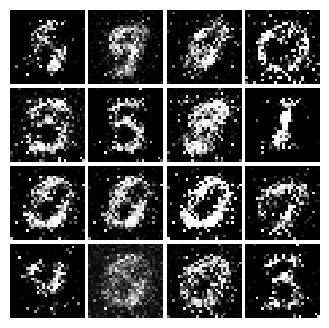

Epoch: 2, Iter: 1280, D: 1.101, G:1.158


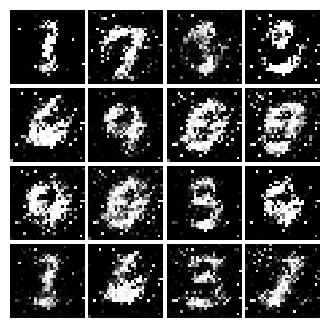

Epoch: 2, Iter: 1300, D: 1.331, G:0.8132


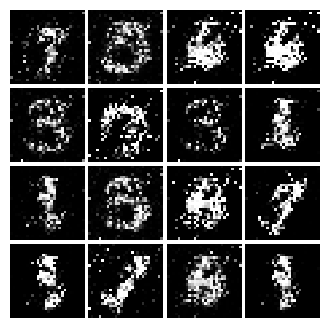

Epoch: 2, Iter: 1320, D: 1.36, G:0.8192


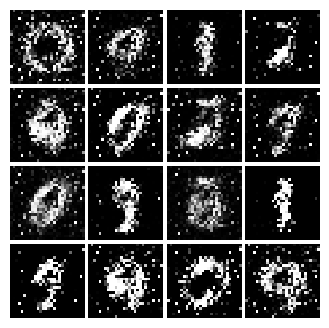

Epoch: 2, Iter: 1340, D: 1.206, G:0.9658


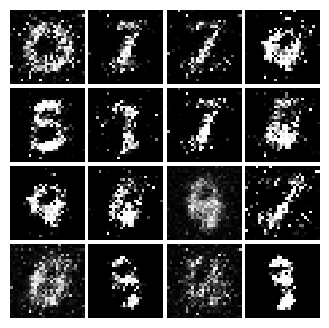

Epoch: 2, Iter: 1360, D: 1.191, G:1.11


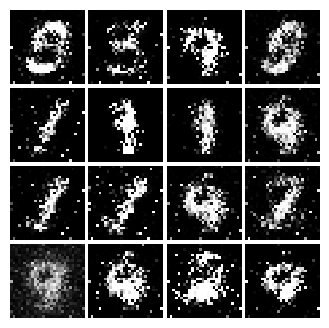

Epoch: 2, Iter: 1380, D: 1.07, G:1.719


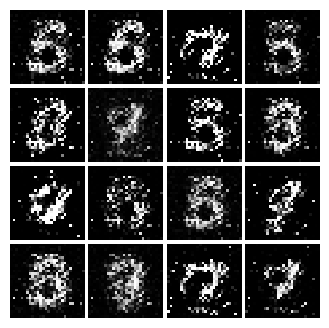

Epoch: 2, Iter: 1400, D: 1.214, G:1.097


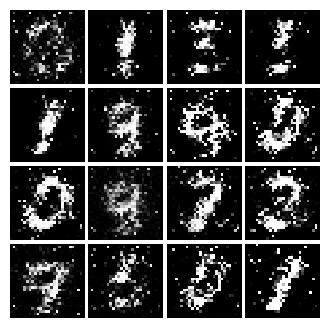

Epoch: 3, Iter: 1420, D: 1.106, G:1.285


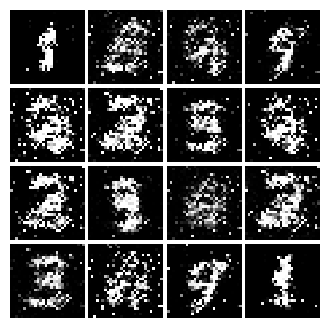

Epoch: 3, Iter: 1440, D: 1.219, G:1.347


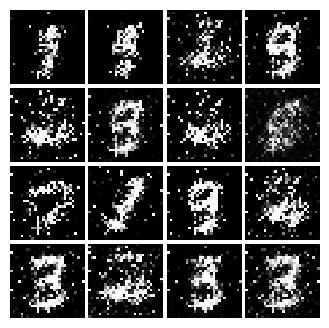

Epoch: 3, Iter: 1460, D: 1.082, G:1.199


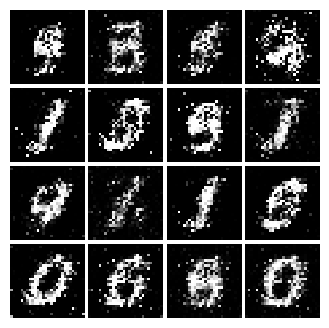

Epoch: 3, Iter: 1480, D: 1.308, G:1.243


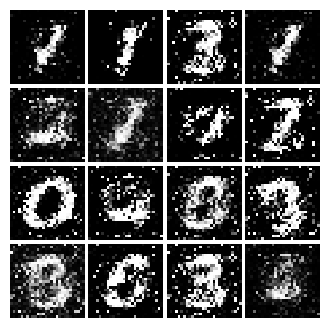

Epoch: 3, Iter: 1500, D: 1.17, G:0.9156


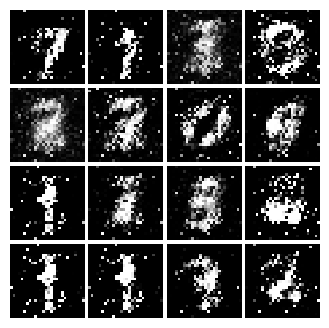

Epoch: 3, Iter: 1520, D: 1.307, G:0.9251


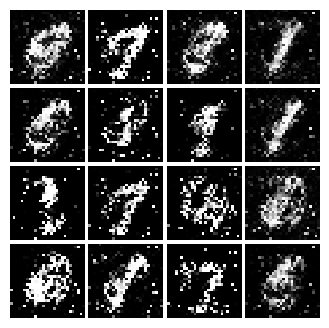

Epoch: 3, Iter: 1540, D: 1.117, G:1.201


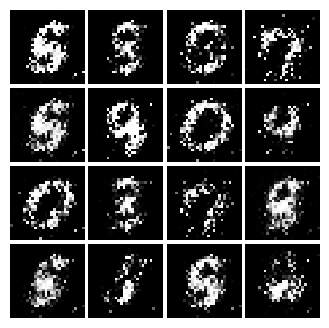

Epoch: 3, Iter: 1560, D: 1.198, G:1.175


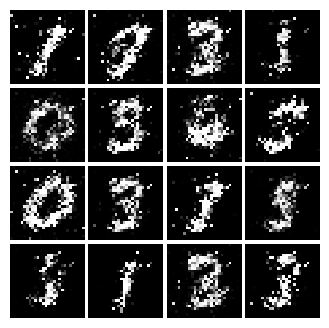

Epoch: 3, Iter: 1580, D: 1.23, G:0.904


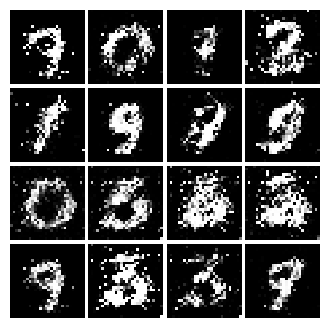

Epoch: 3, Iter: 1600, D: 1.196, G:0.9982


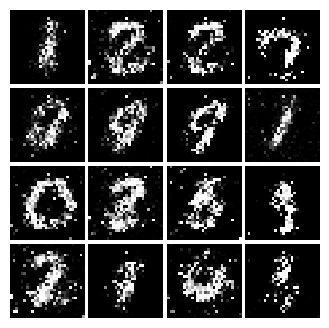

Epoch: 3, Iter: 1620, D: 1.241, G:1.439


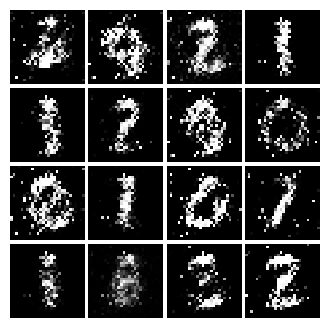

Epoch: 3, Iter: 1640, D: 1.211, G:1.038


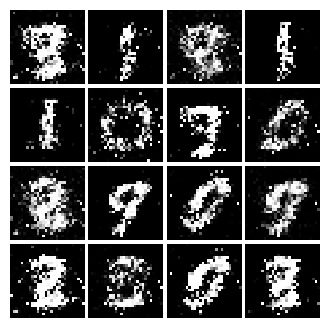

Epoch: 3, Iter: 1660, D: 1.209, G:0.9989


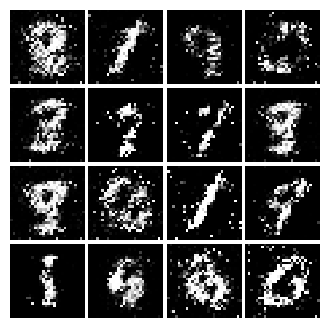

Epoch: 3, Iter: 1680, D: 1.233, G:0.9053


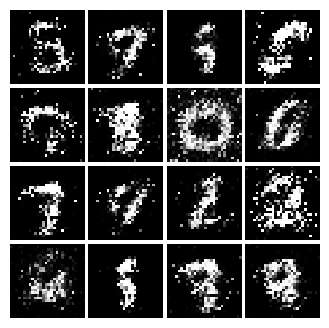

Epoch: 3, Iter: 1700, D: 1.392, G:1.05


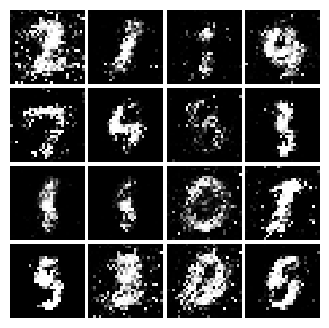

Epoch: 3, Iter: 1720, D: 1.21, G:0.8145


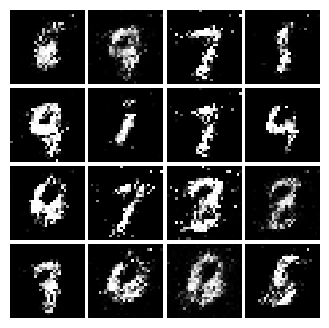

Epoch: 3, Iter: 1740, D: 1.258, G:0.9052


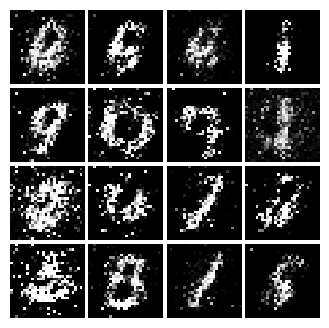

Epoch: 3, Iter: 1760, D: 1.192, G:0.913


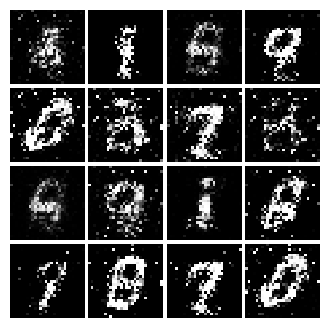

Epoch: 3, Iter: 1780, D: 1.258, G:0.9179


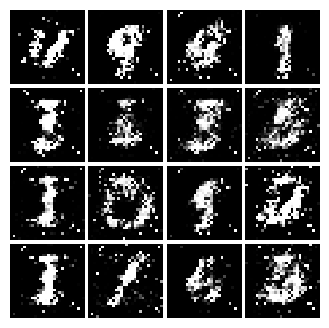

Epoch: 3, Iter: 1800, D: 1.196, G:1.073


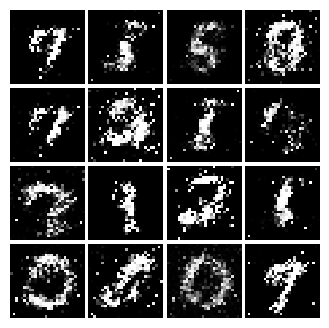

Epoch: 3, Iter: 1820, D: 1.268, G:0.9282


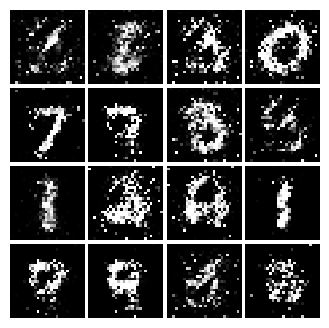

Epoch: 3, Iter: 1840, D: 1.198, G:0.8964


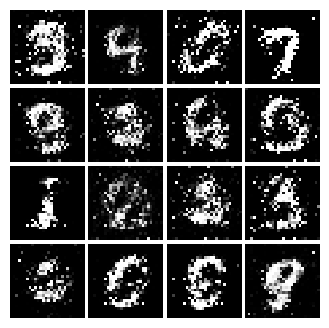

Epoch: 3, Iter: 1860, D: 1.356, G:0.9265


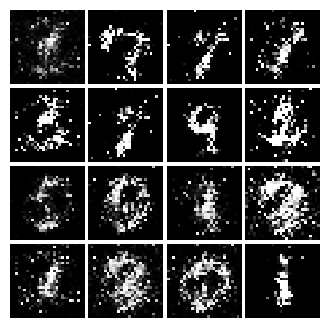

Epoch: 4, Iter: 1880, D: 1.297, G:1.124


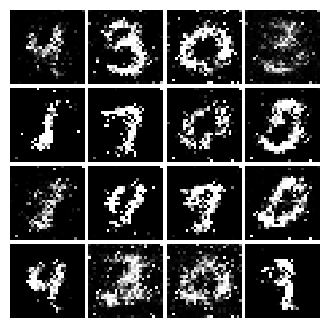

Epoch: 4, Iter: 1900, D: 1.229, G:1.078


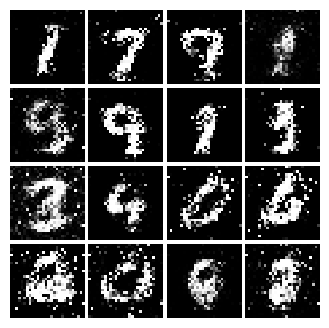

Epoch: 4, Iter: 1920, D: 1.262, G:0.8747


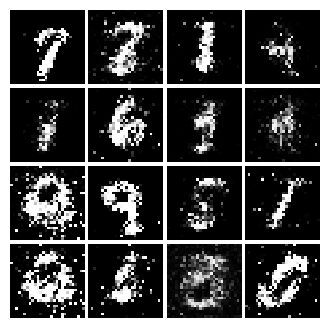

Epoch: 4, Iter: 1940, D: 1.702, G:1.157


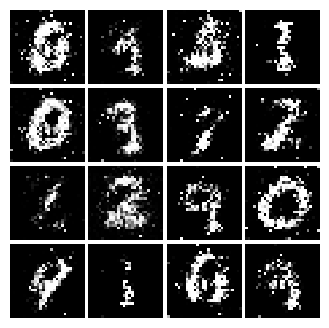

Epoch: 4, Iter: 1960, D: 1.231, G:1.006


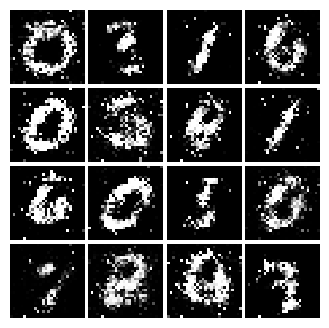

Epoch: 4, Iter: 1980, D: 1.365, G:0.9284


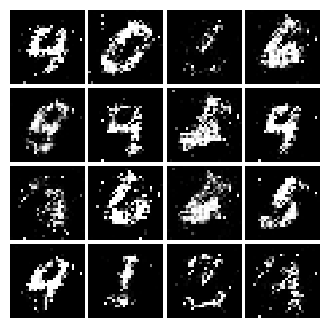

Epoch: 4, Iter: 2000, D: 1.267, G:1.12


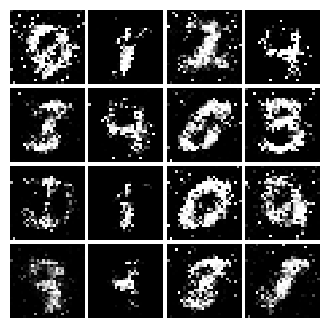

Epoch: 4, Iter: 2020, D: 1.281, G:0.8315


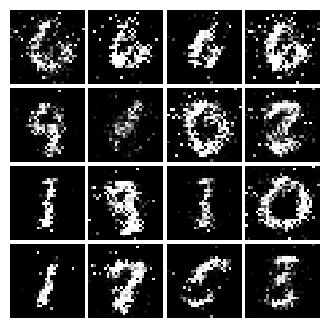

Epoch: 4, Iter: 2040, D: 1.256, G:0.9733


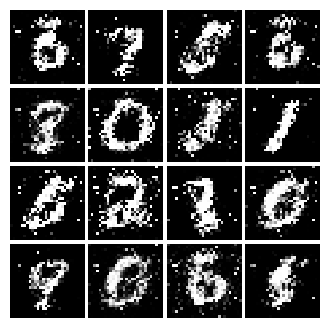

Epoch: 4, Iter: 2060, D: 1.251, G:0.8698


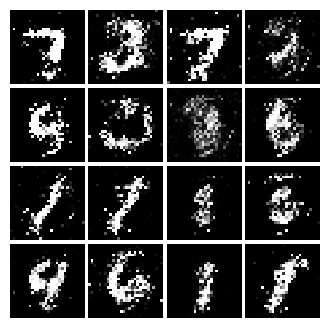

Epoch: 4, Iter: 2080, D: 1.14, G:0.9326


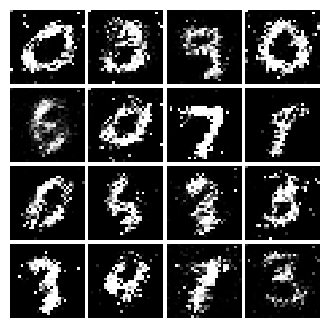

Epoch: 4, Iter: 2100, D: 1.341, G:0.8085


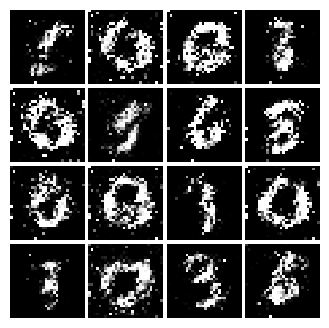

Epoch: 4, Iter: 2120, D: 1.343, G:0.9122


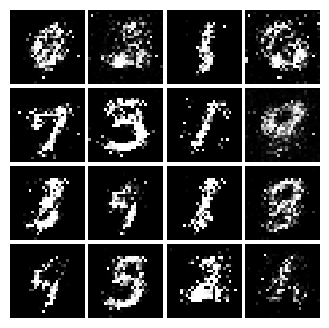

Epoch: 4, Iter: 2140, D: 1.335, G:0.9899


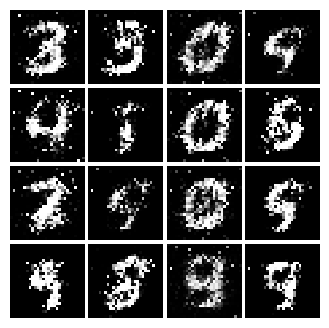

Epoch: 4, Iter: 2160, D: 1.339, G:0.7762


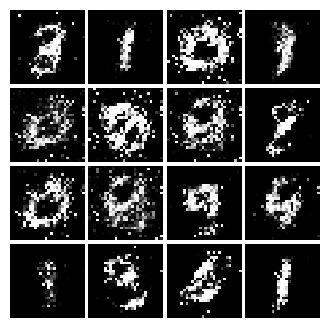

Epoch: 4, Iter: 2180, D: 1.342, G:0.9189


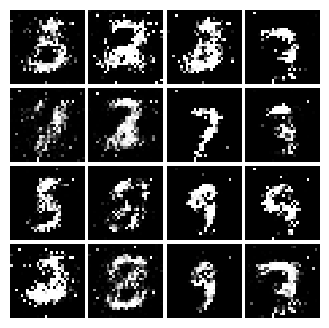

Epoch: 4, Iter: 2200, D: 1.311, G:0.9103


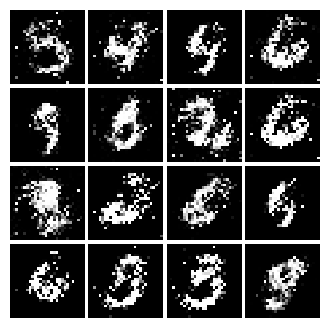

Epoch: 4, Iter: 2220, D: 1.132, G:0.9791


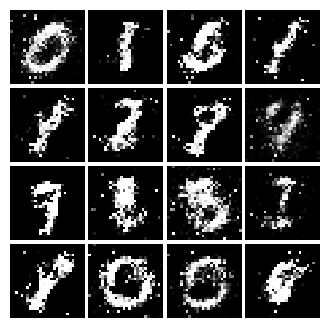

Epoch: 4, Iter: 2240, D: 1.365, G:0.9181


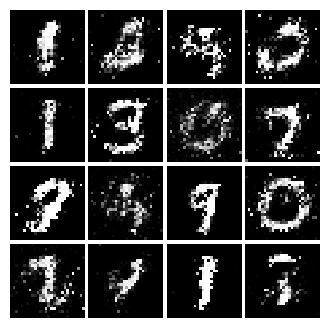

Epoch: 4, Iter: 2260, D: 1.219, G:0.9389


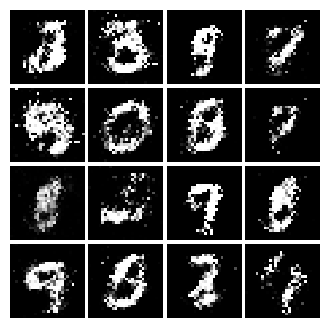

Epoch: 4, Iter: 2280, D: 1.307, G:1.046


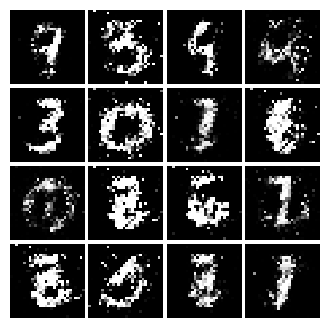

Epoch: 4, Iter: 2300, D: 1.272, G:0.7763


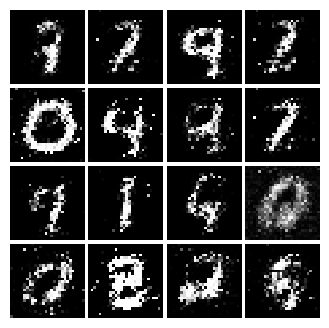

Epoch: 4, Iter: 2320, D: 1.41, G:0.8649


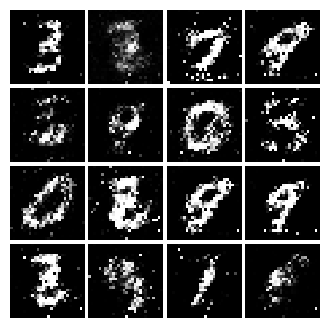

Epoch: 4, Iter: 2340, D: 1.291, G:0.9648


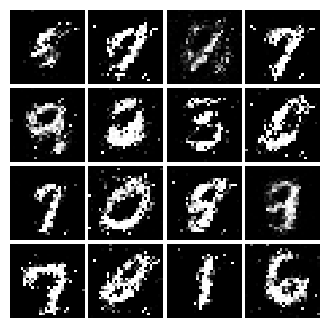

Epoch: 5, Iter: 2360, D: 1.208, G:0.9488


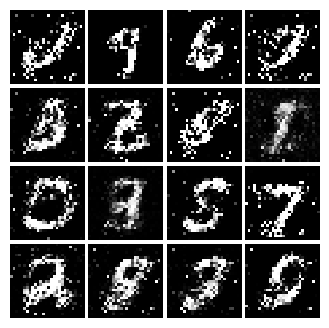

Epoch: 5, Iter: 2380, D: 1.252, G:0.8524


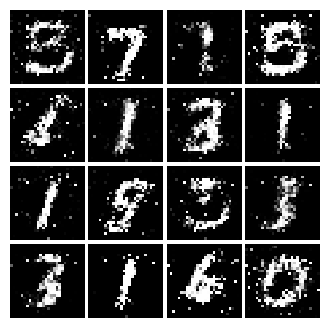

Epoch: 5, Iter: 2400, D: 1.32, G:0.9041


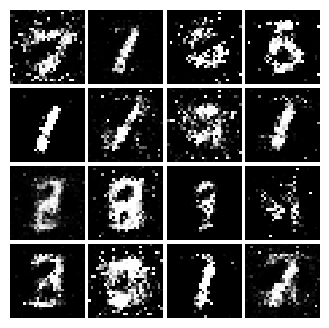

Epoch: 5, Iter: 2420, D: 1.124, G:1.095


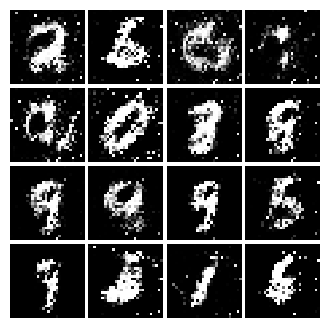

Epoch: 5, Iter: 2440, D: 1.317, G:0.9224


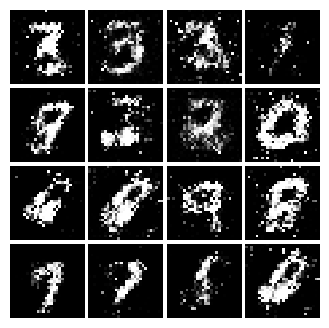

Epoch: 5, Iter: 2460, D: 1.219, G:1.228


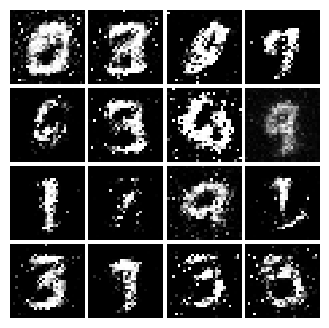

Epoch: 5, Iter: 2480, D: 1.286, G:0.9434


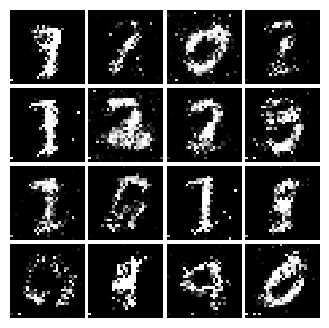

Epoch: 5, Iter: 2500, D: 1.261, G:0.8347


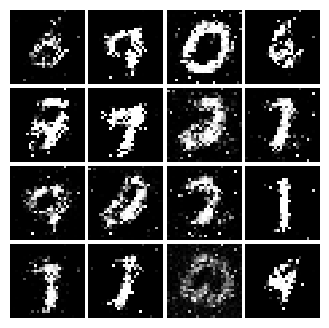

Epoch: 5, Iter: 2520, D: 1.357, G:0.8398


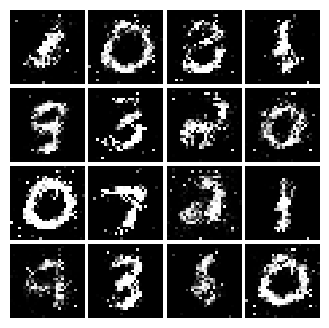

Epoch: 5, Iter: 2540, D: 1.285, G:1.003


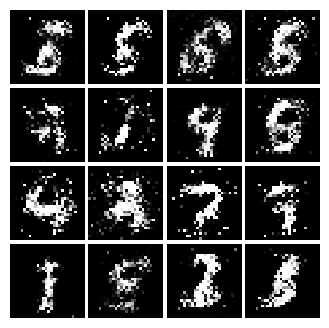

Epoch: 5, Iter: 2560, D: 1.288, G:0.8762


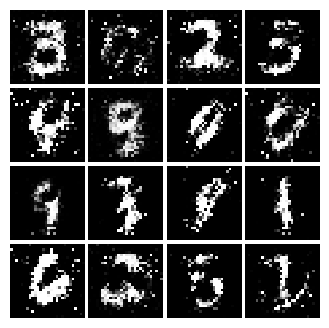

Epoch: 5, Iter: 2580, D: 1.322, G:1.141


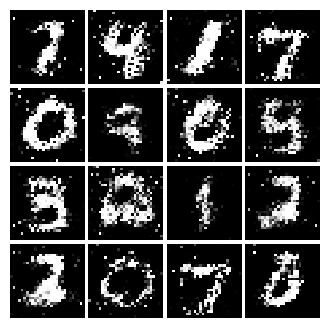

Epoch: 5, Iter: 2600, D: 1.333, G:0.8978


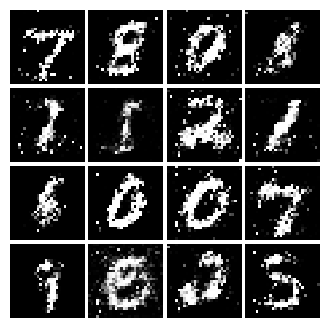

Epoch: 5, Iter: 2620, D: 1.197, G:0.8939


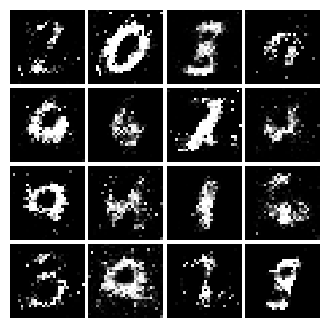

Epoch: 5, Iter: 2640, D: 1.374, G:0.8283


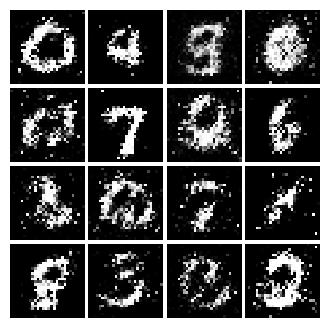

Epoch: 5, Iter: 2660, D: 1.242, G:0.8632


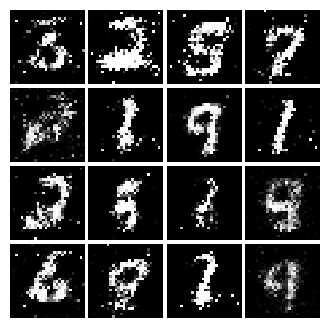

Epoch: 5, Iter: 2680, D: 1.283, G:0.9395


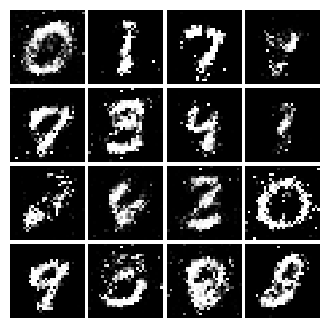

Epoch: 5, Iter: 2700, D: 1.43, G:0.8405


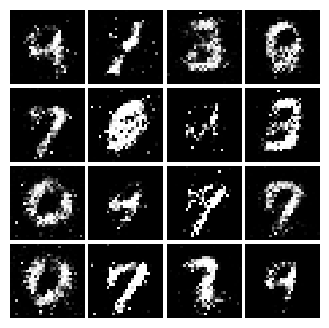

Epoch: 5, Iter: 2720, D: 1.367, G:0.7417


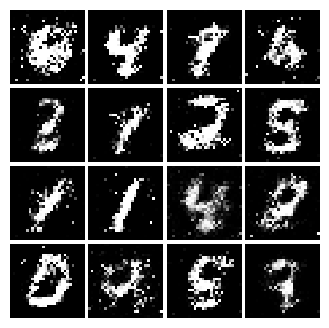

Epoch: 5, Iter: 2740, D: 1.36, G:0.9179


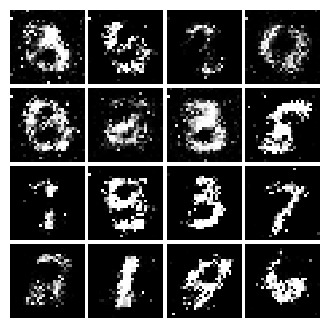

Epoch: 5, Iter: 2760, D: 1.306, G:0.82


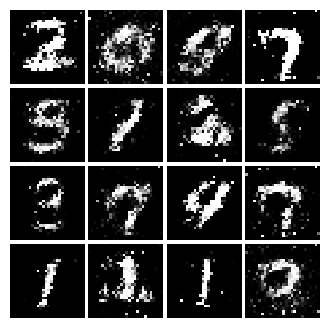

Epoch: 5, Iter: 2780, D: 1.267, G:0.9468


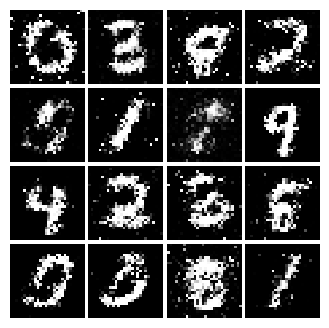

Epoch: 5, Iter: 2800, D: 1.129, G:0.9059


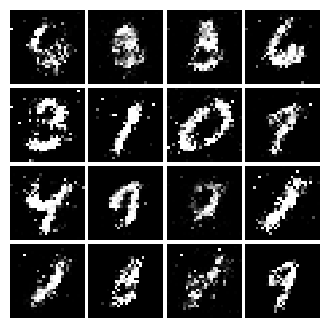

Epoch: 6, Iter: 2820, D: 1.353, G:0.8606


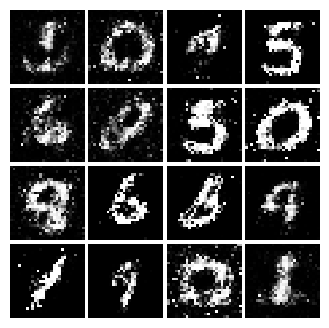

Epoch: 6, Iter: 2840, D: 1.322, G:0.9981


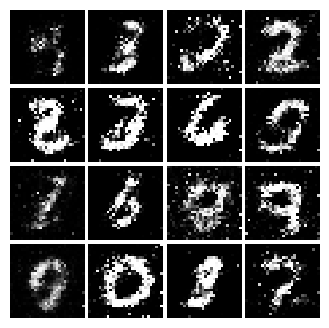

Epoch: 6, Iter: 2860, D: 1.243, G:0.8946


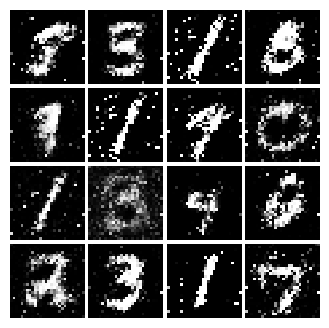

Epoch: 6, Iter: 2880, D: 1.383, G:0.8706


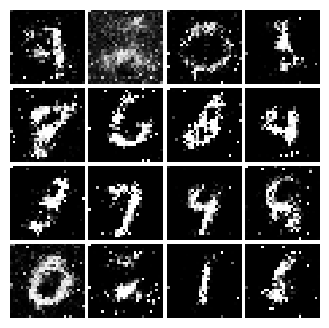

Epoch: 6, Iter: 2900, D: 1.303, G:0.8675


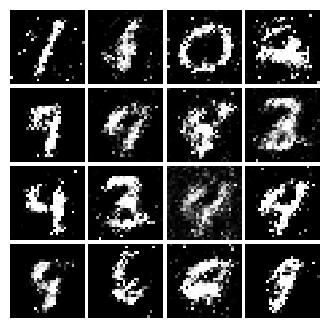

Epoch: 6, Iter: 2920, D: 1.4, G:0.7834


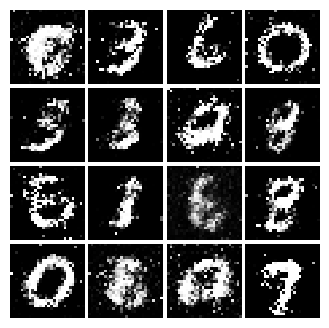

Epoch: 6, Iter: 2940, D: 1.427, G:0.939


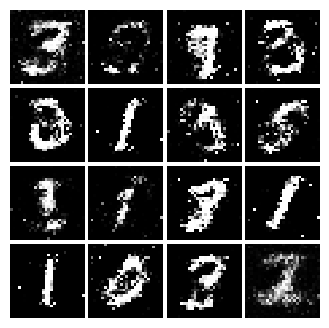

Epoch: 6, Iter: 2960, D: 1.257, G:0.8228


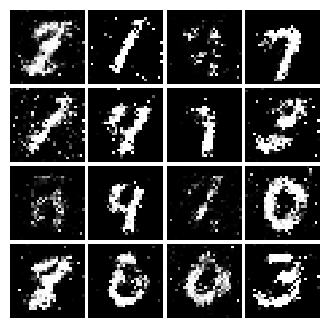

Epoch: 6, Iter: 2980, D: 1.358, G:0.8435


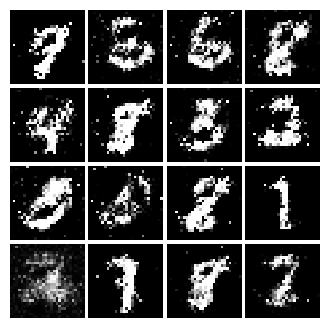

Epoch: 6, Iter: 3000, D: 1.324, G:0.8542


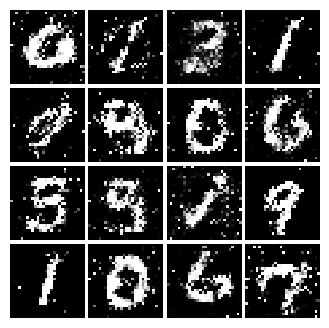

Epoch: 6, Iter: 3020, D: 1.351, G:0.8901


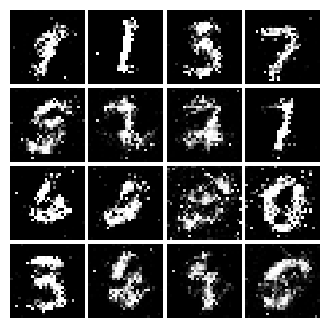

Epoch: 6, Iter: 3040, D: 1.287, G:0.7836


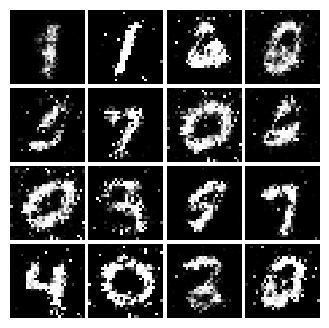

Epoch: 6, Iter: 3060, D: 1.282, G:0.8256


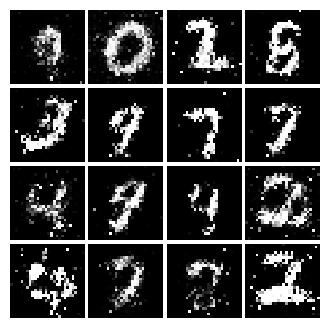

Epoch: 6, Iter: 3080, D: 1.381, G:0.7953


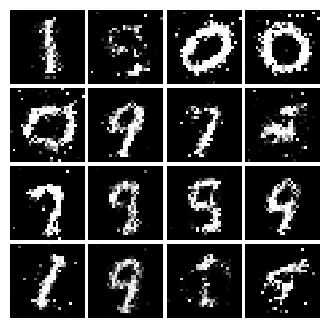

Epoch: 6, Iter: 3100, D: 1.351, G:0.7806


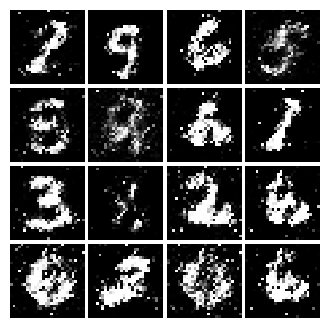

Epoch: 6, Iter: 3120, D: 1.309, G:0.9438


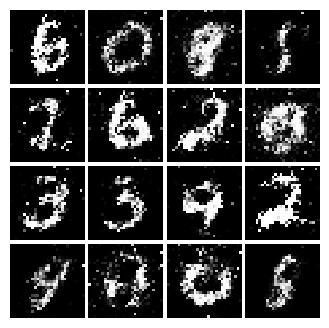

Epoch: 6, Iter: 3140, D: 1.365, G:0.8696


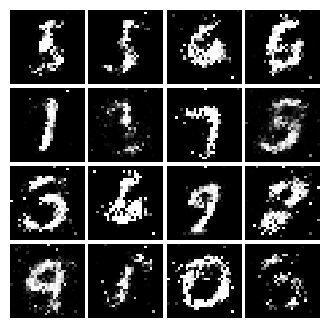

Epoch: 6, Iter: 3160, D: 1.348, G:0.758


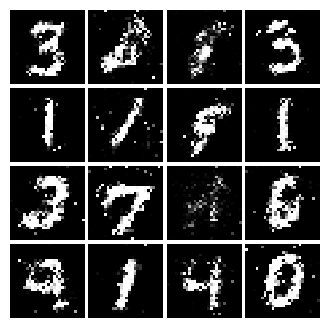

Epoch: 6, Iter: 3180, D: 1.403, G:0.8277


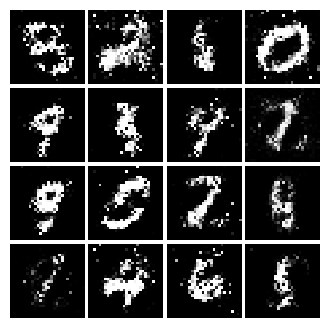

Epoch: 6, Iter: 3200, D: 1.357, G:0.8403


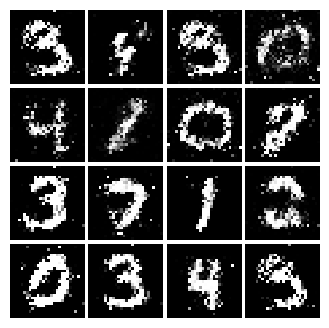

Epoch: 6, Iter: 3220, D: 1.392, G:0.8612


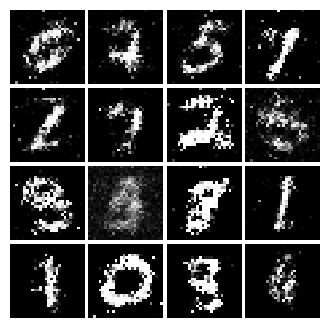

Epoch: 6, Iter: 3240, D: 1.228, G:0.7717


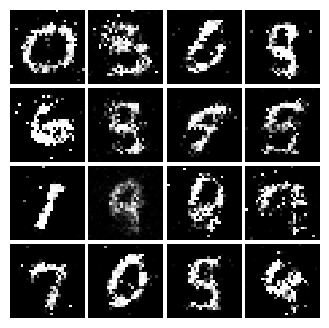

Epoch: 6, Iter: 3260, D: 1.333, G:0.8649


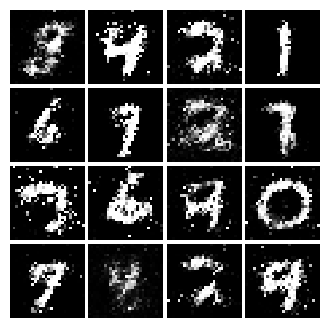

Epoch: 6, Iter: 3280, D: 1.288, G:0.8649


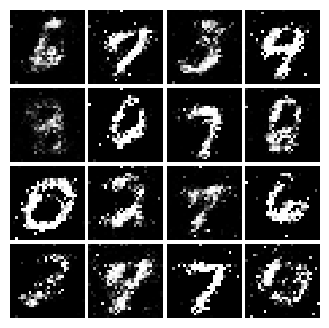

Epoch: 7, Iter: 3300, D: 1.254, G:0.8832


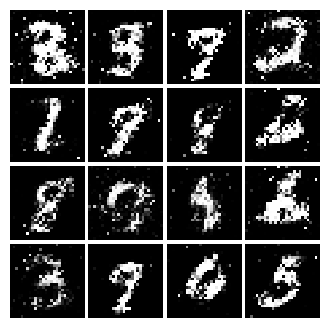

Epoch: 7, Iter: 3320, D: 1.307, G:0.8445


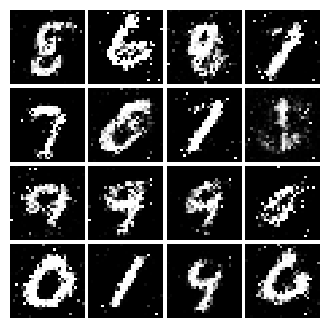

Epoch: 7, Iter: 3340, D: 1.284, G:0.8512


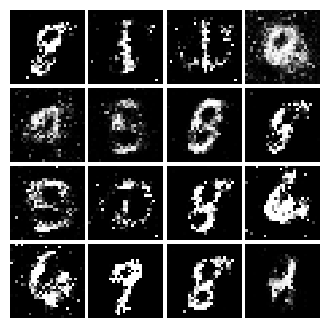

Epoch: 7, Iter: 3360, D: 1.412, G:0.8388


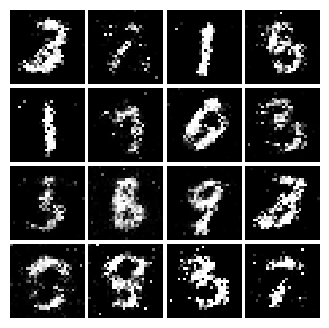

Epoch: 7, Iter: 3380, D: 1.314, G:0.8427


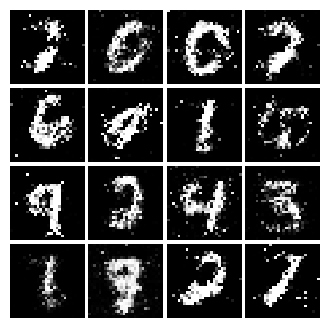

Epoch: 7, Iter: 3400, D: 1.372, G:0.8872


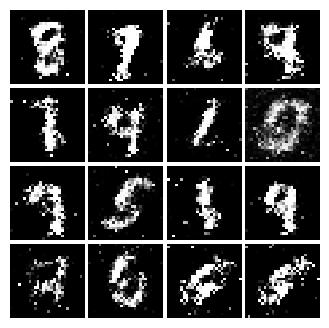

Epoch: 7, Iter: 3420, D: 1.353, G:0.6518


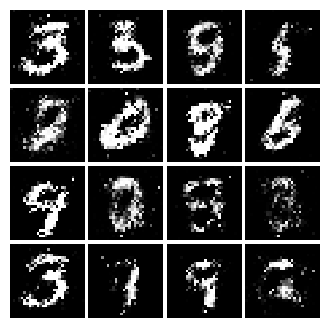

Epoch: 7, Iter: 3440, D: 1.352, G:0.8135


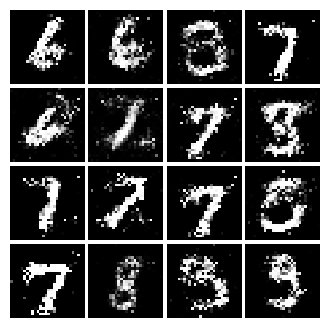

Epoch: 7, Iter: 3460, D: 1.3, G:0.7129


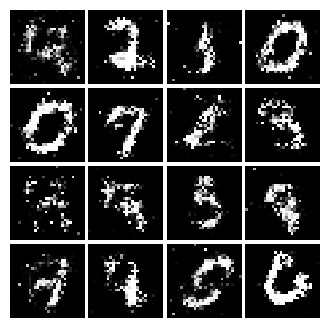

Epoch: 7, Iter: 3480, D: 1.371, G:0.8406


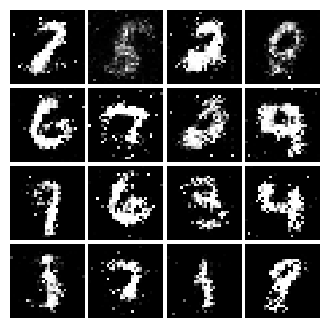

Epoch: 7, Iter: 3500, D: 1.274, G:0.8309


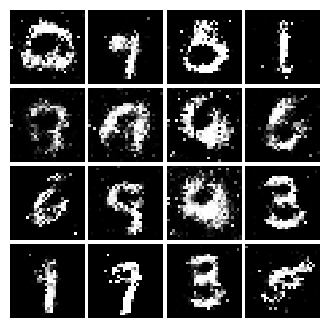

Epoch: 7, Iter: 3520, D: 1.308, G:0.7532


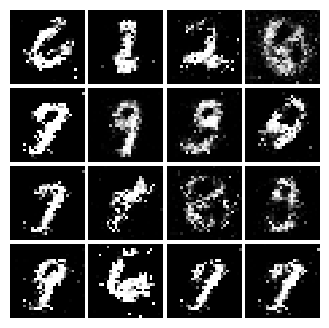

Epoch: 7, Iter: 3540, D: 1.299, G:0.7417


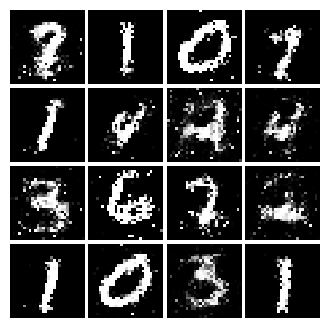

Epoch: 7, Iter: 3560, D: 1.276, G:0.9134


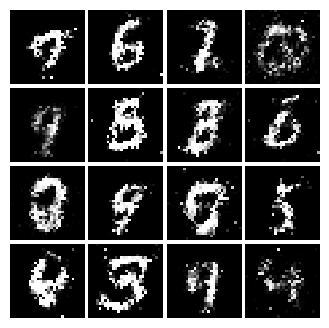

Epoch: 7, Iter: 3580, D: 1.367, G:0.7837


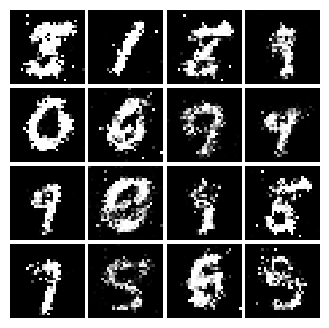

Epoch: 7, Iter: 3600, D: 1.323, G:0.771


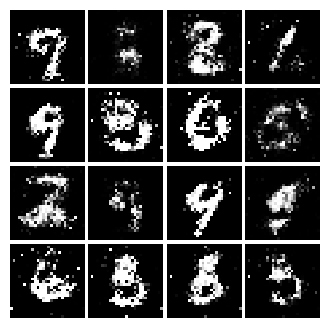

Epoch: 7, Iter: 3620, D: 1.31, G:0.7801


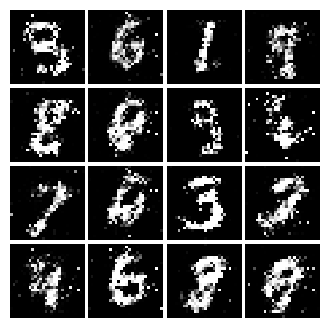

Epoch: 7, Iter: 3640, D: 1.35, G:0.8275


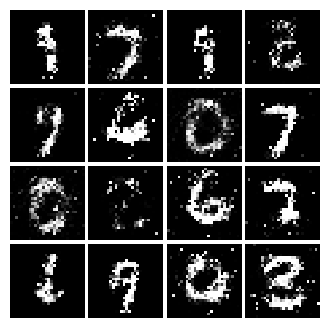

Epoch: 7, Iter: 3660, D: 1.315, G:0.9304


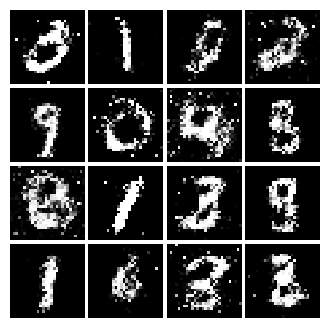

Epoch: 7, Iter: 3680, D: 1.362, G:0.7928


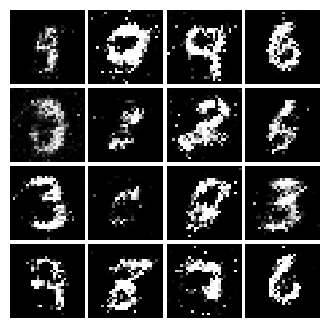

Epoch: 7, Iter: 3700, D: 1.341, G:0.8394


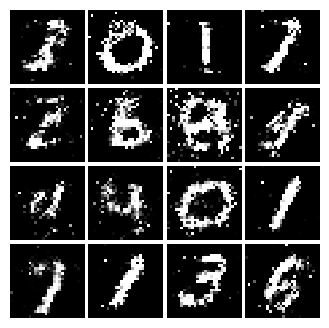

Epoch: 7, Iter: 3720, D: 1.351, G:0.8224


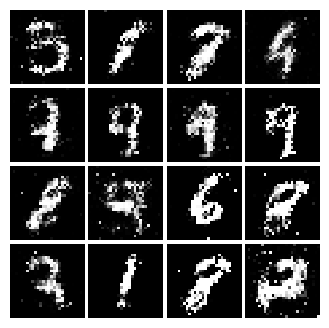

Epoch: 7, Iter: 3740, D: 1.324, G:0.7532


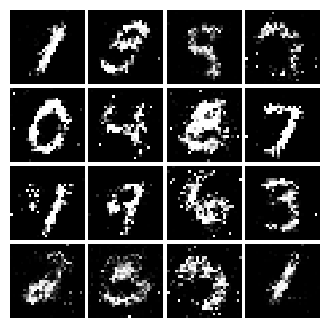

Epoch: 8, Iter: 3760, D: 1.347, G:0.8406


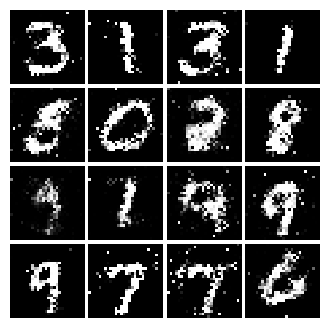

Epoch: 8, Iter: 3780, D: 1.405, G:0.7955


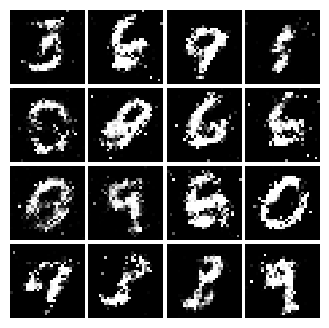

Epoch: 8, Iter: 3800, D: 1.353, G:0.8187


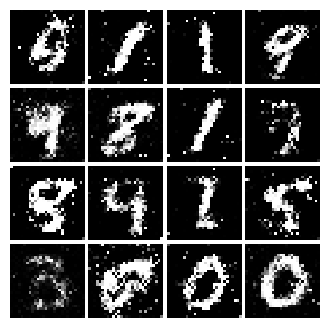

Epoch: 8, Iter: 3820, D: 1.269, G:0.7601


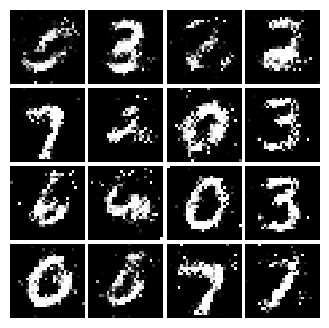

Epoch: 8, Iter: 3840, D: 1.376, G:0.9041


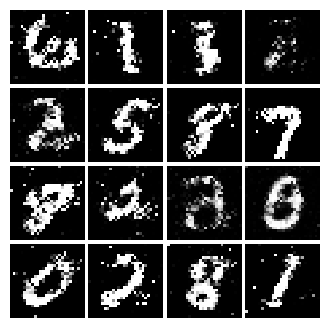

Epoch: 8, Iter: 3860, D: 1.263, G:0.8587


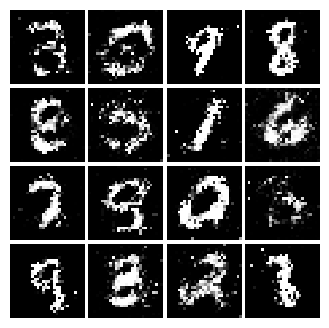

Epoch: 8, Iter: 3880, D: 1.266, G:0.8559


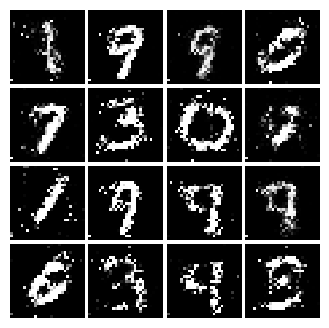

Epoch: 8, Iter: 3900, D: 1.391, G:0.7629


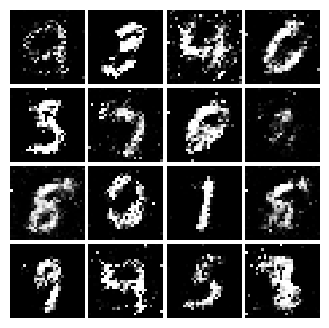

Epoch: 8, Iter: 3920, D: 1.286, G:0.7974


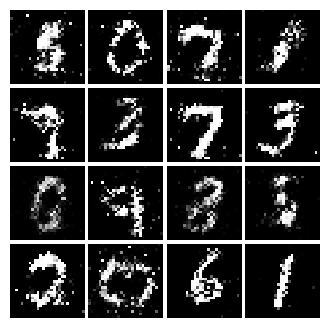

Epoch: 8, Iter: 3940, D: 1.352, G:0.9131


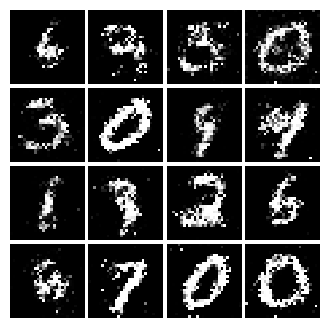

Epoch: 8, Iter: 3960, D: 1.343, G:0.8963


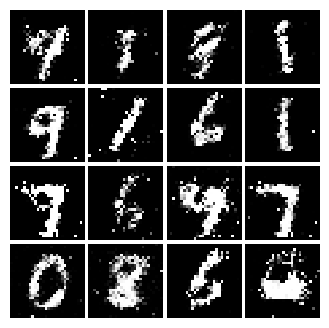

Epoch: 8, Iter: 3980, D: 1.32, G:0.7997


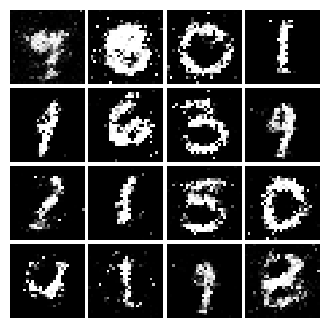

Epoch: 8, Iter: 4000, D: 1.326, G:0.8184


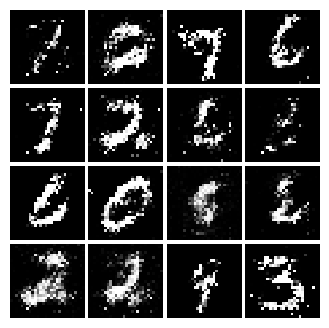

Epoch: 8, Iter: 4020, D: 1.35, G:0.7655


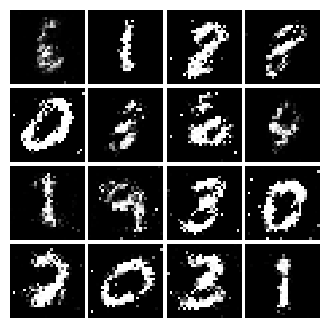

Epoch: 8, Iter: 4040, D: 1.32, G:0.8721


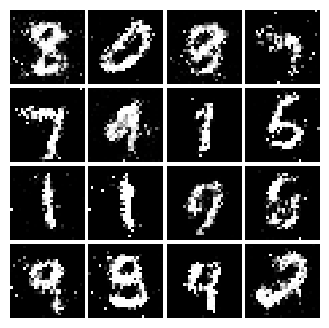

Epoch: 8, Iter: 4060, D: 1.279, G:0.6895


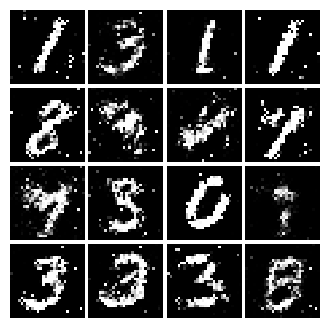

Epoch: 8, Iter: 4080, D: 1.393, G:0.7438


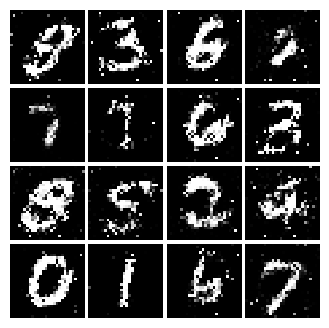

Epoch: 8, Iter: 4100, D: 1.34, G:0.8195


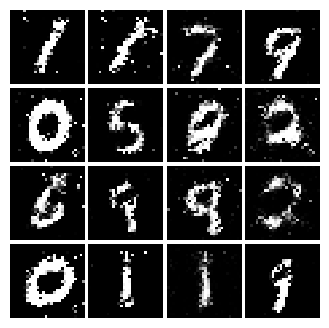

Epoch: 8, Iter: 4120, D: 1.338, G:0.7821


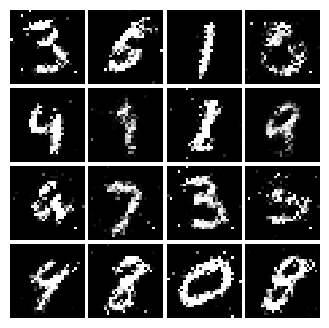

Epoch: 8, Iter: 4140, D: 1.345, G:0.7899


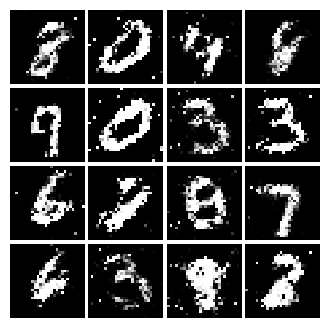

Epoch: 8, Iter: 4160, D: 1.333, G:0.7874


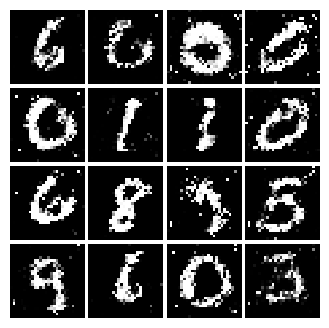

Epoch: 8, Iter: 4180, D: 1.364, G:0.7054


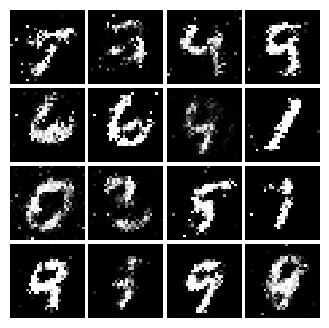

Epoch: 8, Iter: 4200, D: 1.289, G:0.8191


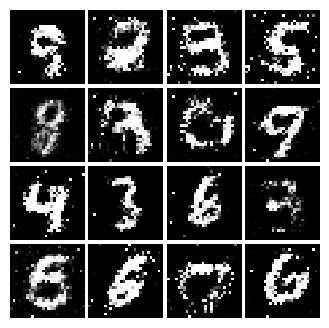

Epoch: 8, Iter: 4220, D: 1.311, G:0.7631


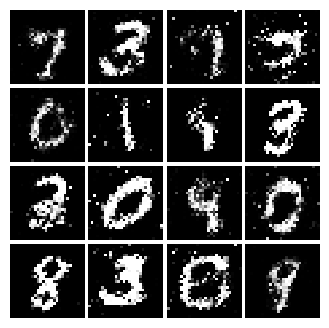

Epoch: 9, Iter: 4240, D: 1.41, G:0.743


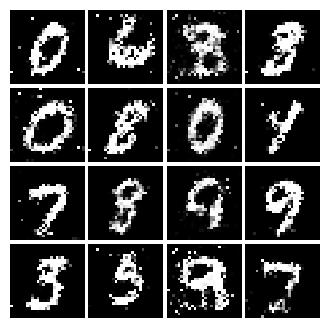

Epoch: 9, Iter: 4260, D: 1.406, G:0.6423


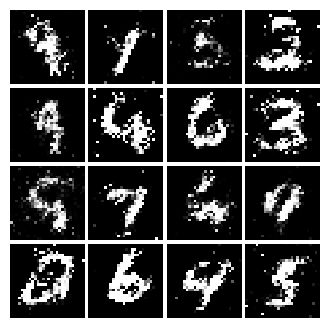

Epoch: 9, Iter: 4280, D: 1.372, G:0.7963


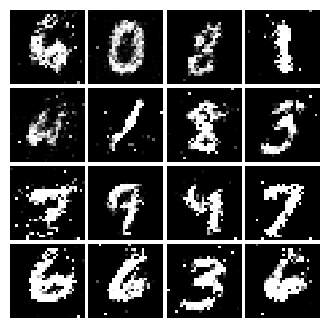

Epoch: 9, Iter: 4300, D: 1.296, G:0.7569


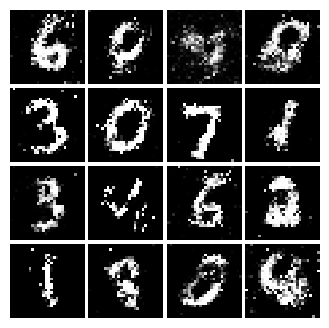

Epoch: 9, Iter: 4320, D: 1.352, G:0.7758


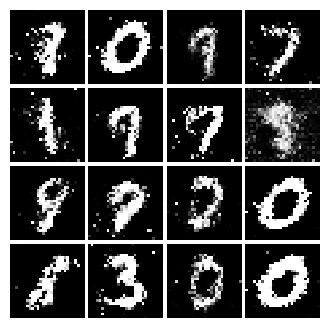

Epoch: 9, Iter: 4340, D: 1.306, G:0.7754


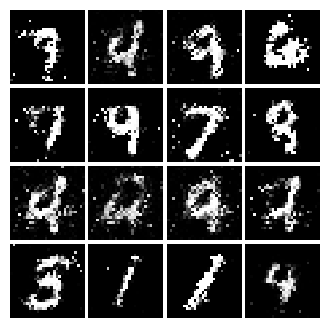

Epoch: 9, Iter: 4360, D: 1.451, G:0.7245


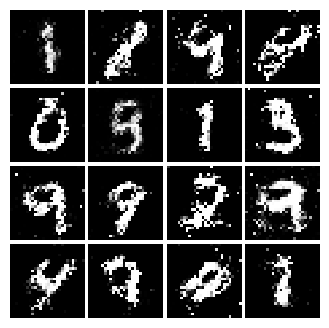

Epoch: 9, Iter: 4380, D: 1.459, G:0.7731


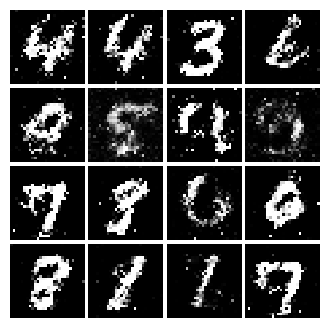

Epoch: 9, Iter: 4400, D: 1.253, G:0.8085


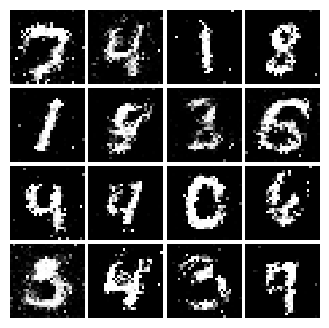

Epoch: 9, Iter: 4420, D: 1.356, G:0.7776


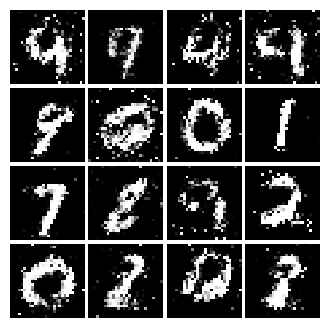

Epoch: 9, Iter: 4440, D: 1.387, G:0.811


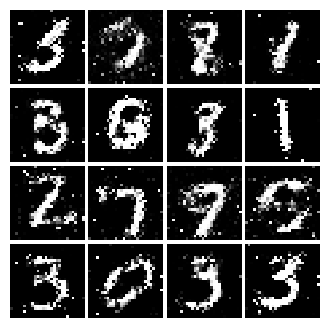

Epoch: 9, Iter: 4460, D: 1.347, G:0.8711


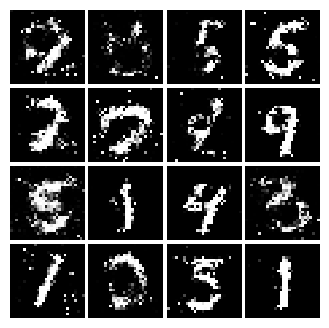

Epoch: 9, Iter: 4480, D: 1.325, G:0.7958


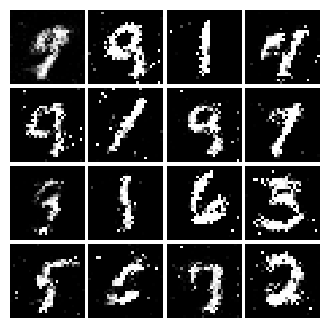

Epoch: 9, Iter: 4500, D: 1.494, G:0.7564


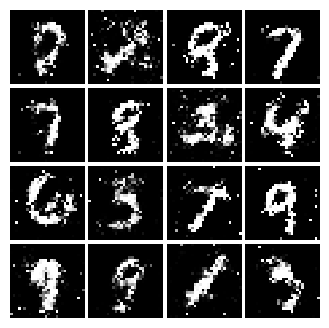

Epoch: 9, Iter: 4520, D: 1.318, G:0.7988


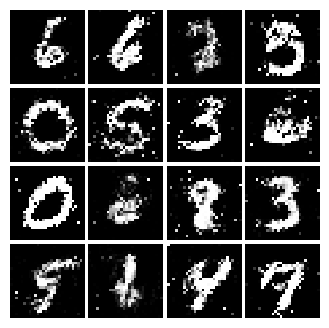

Epoch: 9, Iter: 4540, D: 1.329, G:0.7733


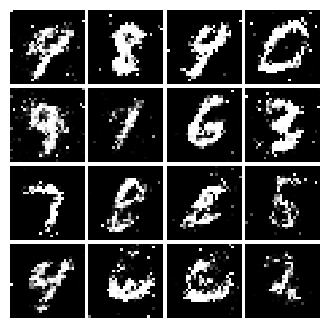

Epoch: 9, Iter: 4560, D: 1.318, G:0.8084


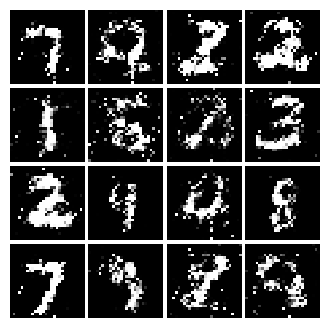

Epoch: 9, Iter: 4580, D: 1.364, G:0.8646


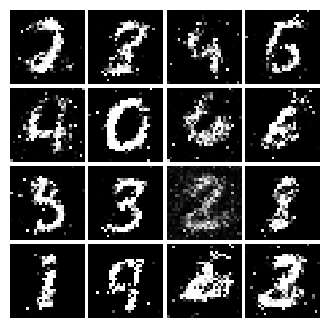

Epoch: 9, Iter: 4600, D: 1.398, G:0.6976


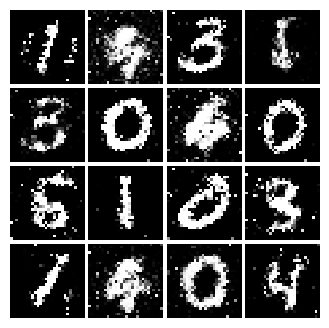

Epoch: 9, Iter: 4620, D: 1.435, G:0.9005


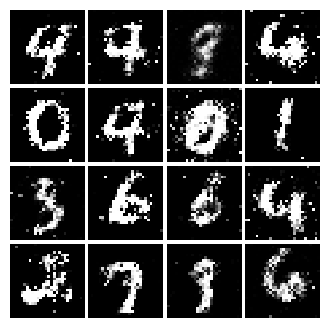

Epoch: 9, Iter: 4640, D: 1.346, G:0.8111


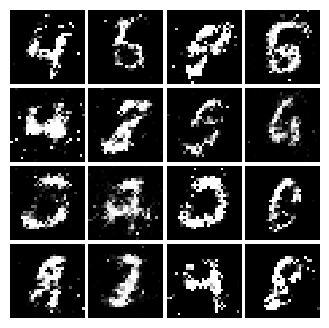

Epoch: 9, Iter: 4660, D: 1.389, G:0.7658


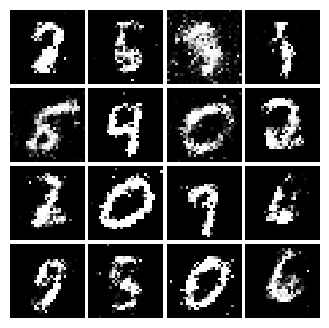

Epoch: 9, Iter: 4680, D: 1.382, G:0.7448


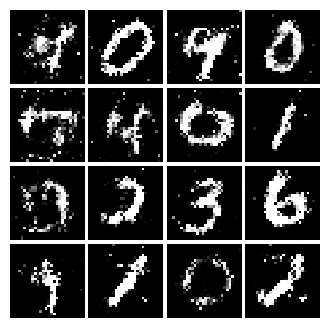

Final images


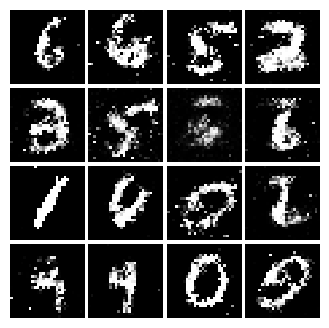

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

In [ ]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [ ]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Epoch: 0, Iter: 0, D: 2.631, G:0.5014


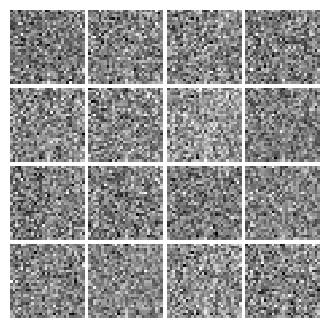

Epoch: 0, Iter: 20, D: 0.0959, G:1.268


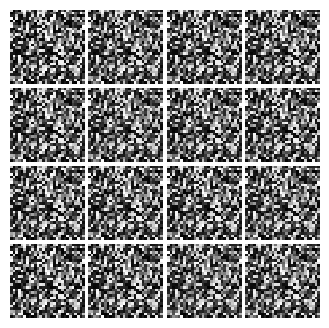

Epoch: 0, Iter: 40, D: 0.4477, G:0.5124


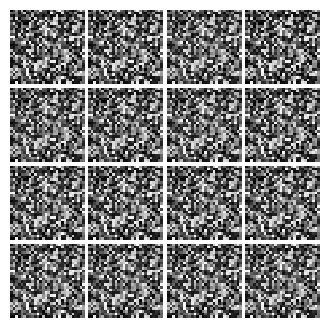

Epoch: 0, Iter: 60, D: 0.1206, G:0.6368


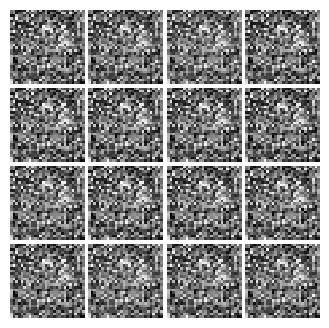

Epoch: 0, Iter: 80, D: 0.06071, G:0.3503


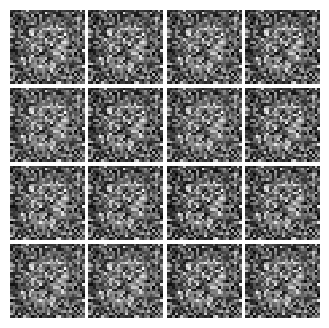

Epoch: 0, Iter: 100, D: 0.03115, G:0.5511


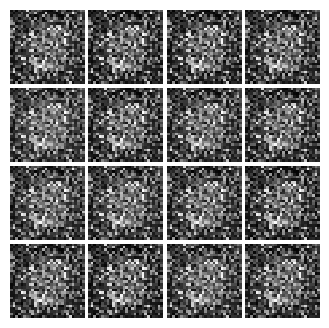

Epoch: 0, Iter: 120, D: 0.01585, G:0.5215


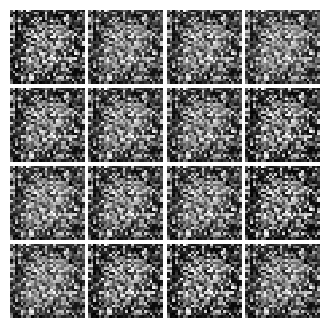

Epoch: 0, Iter: 140, D: 0.2892, G:0.5485


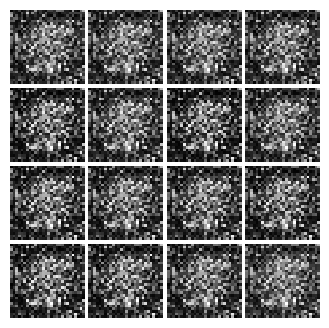

Epoch: 0, Iter: 160, D: 0.4767, G:0.4795


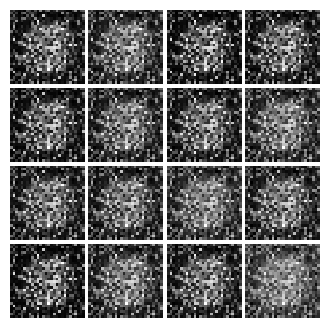

Epoch: 0, Iter: 180, D: 0.08448, G:0.6017


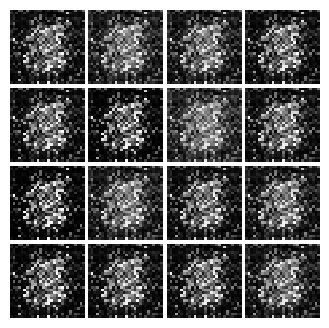

Epoch: 0, Iter: 200, D: 0.1084, G:0.4536


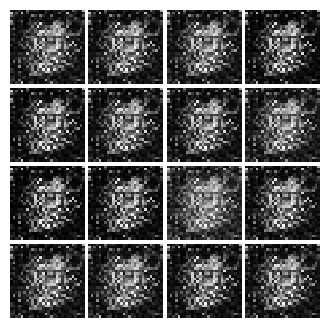

Epoch: 0, Iter: 220, D: 0.07113, G:0.6953


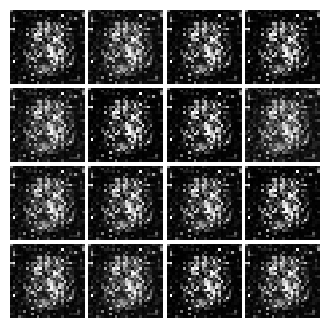

Epoch: 0, Iter: 240, D: 0.03226, G:0.5338


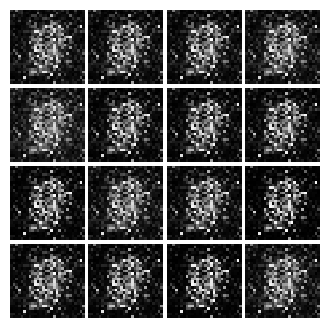

Epoch: 0, Iter: 260, D: 0.292, G:0.1702


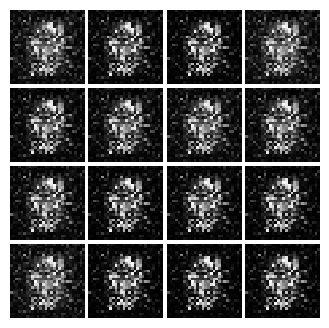

Epoch: 0, Iter: 280, D: 0.1208, G:0.4616


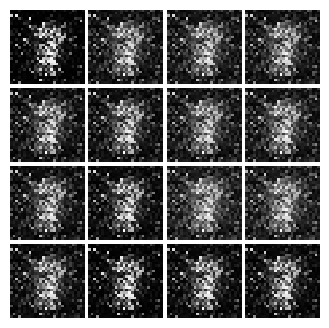

Epoch: 0, Iter: 300, D: 0.4315, G:1.372


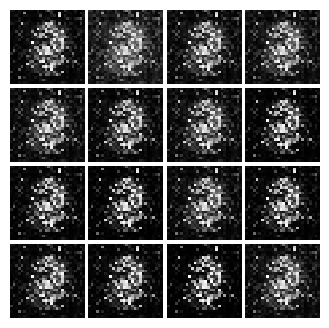

Epoch: 0, Iter: 320, D: 0.3612, G:0.9236


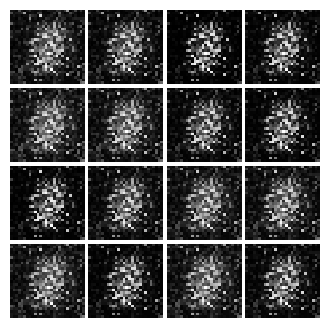

Epoch: 0, Iter: 340, D: 0.1106, G:0.5301


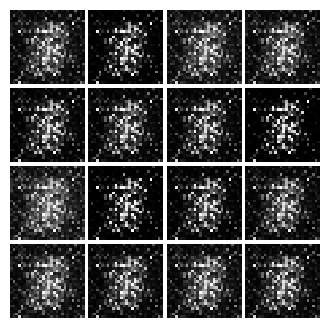

Epoch: 0, Iter: 360, D: 0.09578, G:0.4855


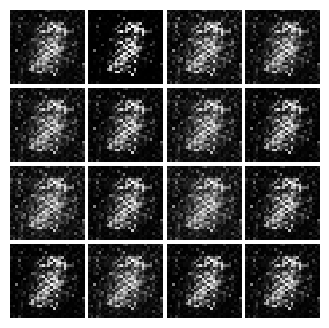

Epoch: 0, Iter: 380, D: 0.185, G:0.4578


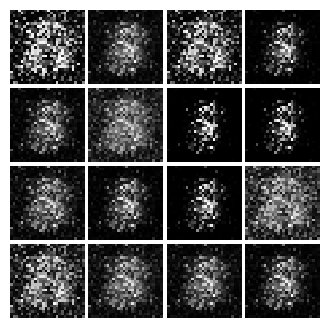

Epoch: 0, Iter: 400, D: 0.1155, G:0.47


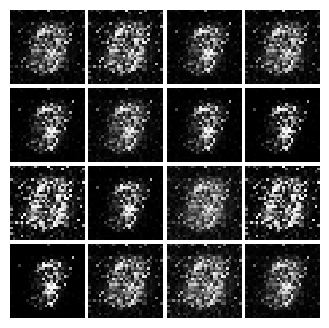

Epoch: 0, Iter: 420, D: 0.1776, G:0.4605


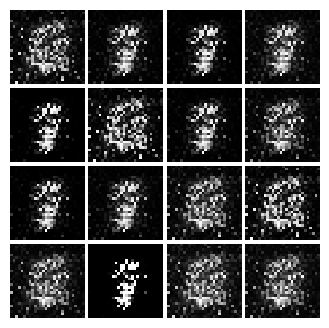

Epoch: 0, Iter: 440, D: 0.6487, G:0.4537


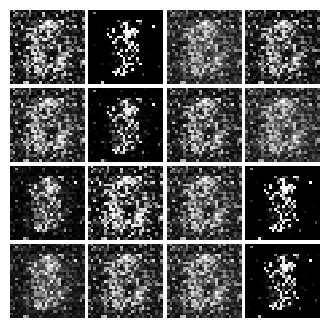

Epoch: 0, Iter: 460, D: 0.187, G:0.6661


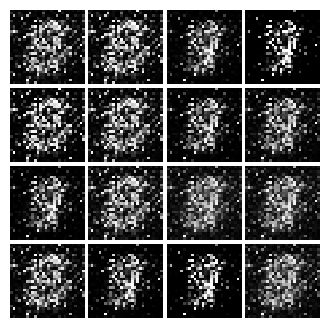

Epoch: 1, Iter: 480, D: 0.1308, G:0.3658


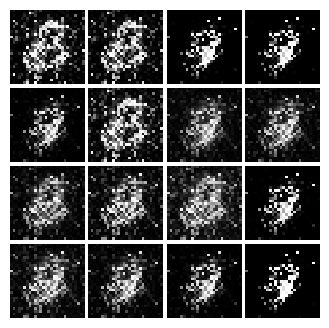

Epoch: 1, Iter: 500, D: 0.1795, G:0.1763


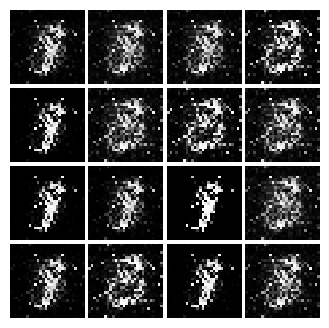

Epoch: 1, Iter: 520, D: 0.08673, G:0.3726


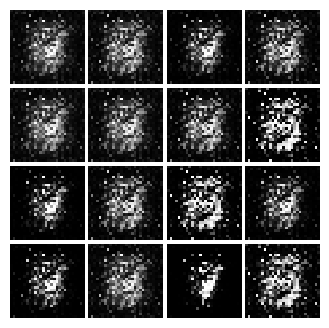

Epoch: 1, Iter: 540, D: 0.1182, G:0.4052


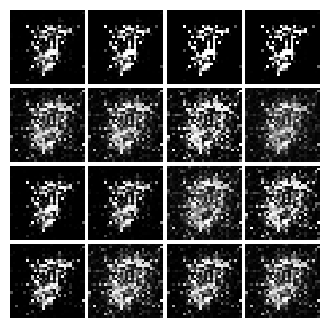

Epoch: 1, Iter: 560, D: 0.1133, G:0.3969


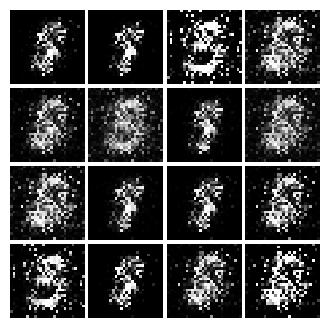

Epoch: 1, Iter: 580, D: 0.06017, G:0.3898


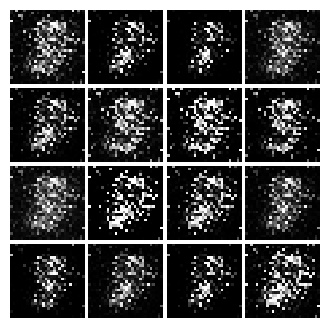

Epoch: 1, Iter: 600, D: 0.09903, G:0.483


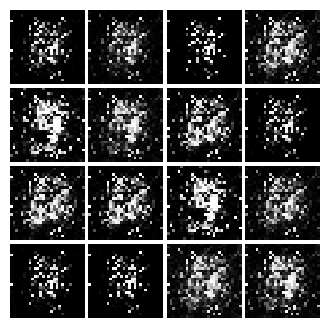

Epoch: 1, Iter: 620, D: 0.08491, G:0.4674


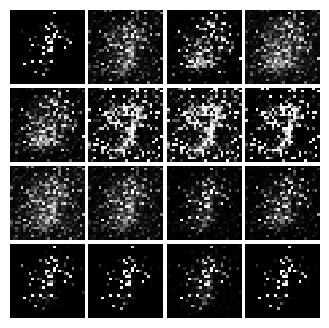

Epoch: 1, Iter: 640, D: 0.1031, G:0.2231


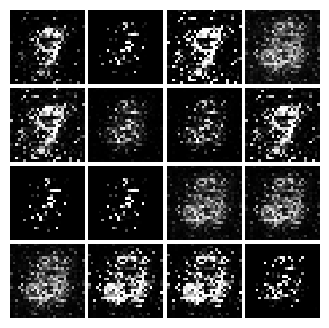

Epoch: 1, Iter: 660, D: 0.1312, G:0.4722


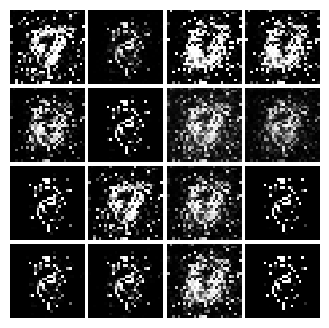

Epoch: 1, Iter: 680, D: 0.1419, G:0.3181


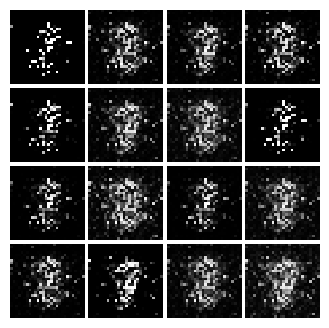

Epoch: 1, Iter: 700, D: 0.3968, G:0.3858


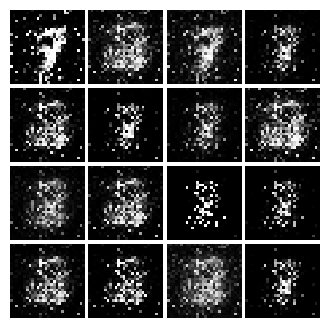

Epoch: 1, Iter: 720, D: 0.1223, G:0.2974


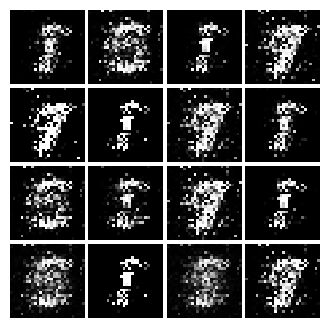

Epoch: 1, Iter: 740, D: 0.09976, G:0.456


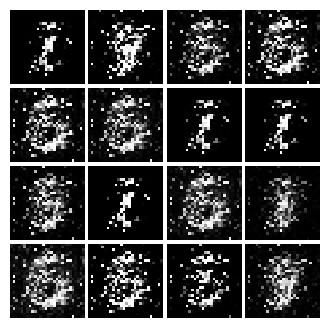

Epoch: 1, Iter: 760, D: 0.07886, G:0.3282


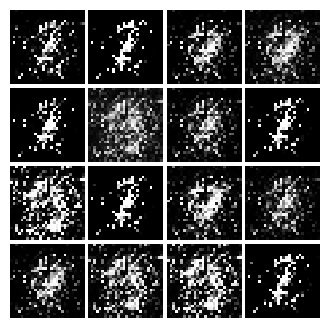

Epoch: 1, Iter: 780, D: 0.1396, G:2.112


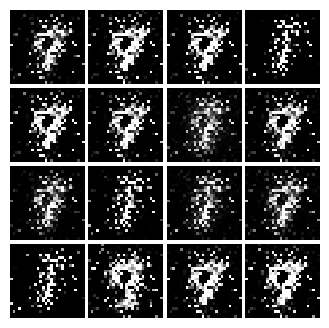

Epoch: 1, Iter: 800, D: 0.1119, G:0.4086


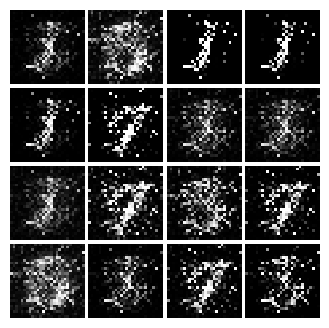

Epoch: 1, Iter: 820, D: 0.1693, G:0.3626


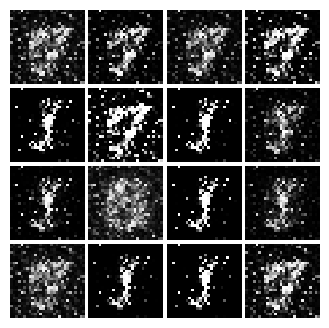

Epoch: 1, Iter: 840, D: 0.1088, G:0.4009


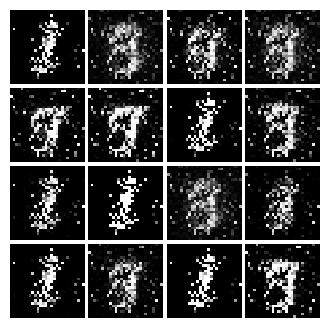

Epoch: 1, Iter: 860, D: 0.1654, G:0.2741


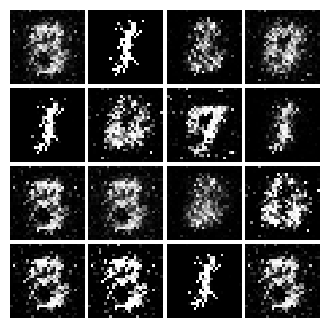

Epoch: 1, Iter: 880, D: 0.1494, G:0.3104


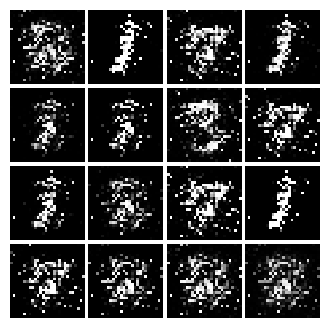

Epoch: 1, Iter: 900, D: 0.2037, G:0.4369


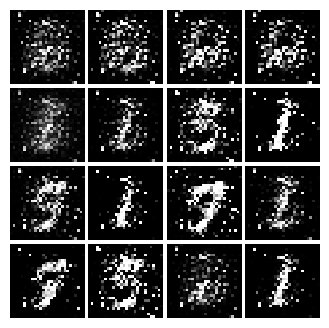

Epoch: 1, Iter: 920, D: 0.1804, G:0.3075


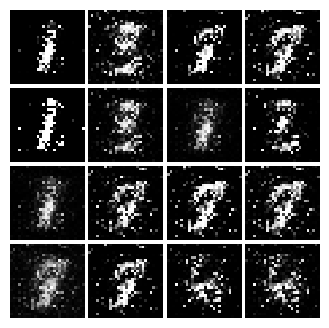

Epoch: 2, Iter: 940, D: 0.121, G:0.3528


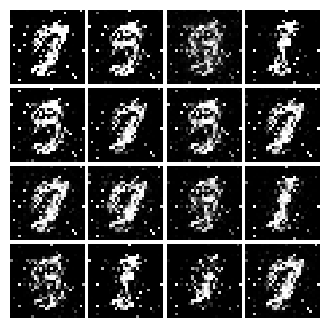

Epoch: 2, Iter: 960, D: 0.2687, G:0.7147


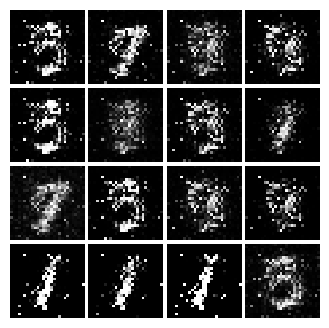

Epoch: 2, Iter: 980, D: 0.09076, G:0.362


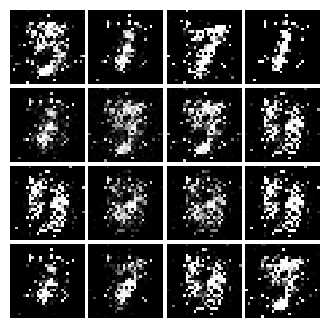

Epoch: 2, Iter: 1000, D: 0.139, G:0.4738


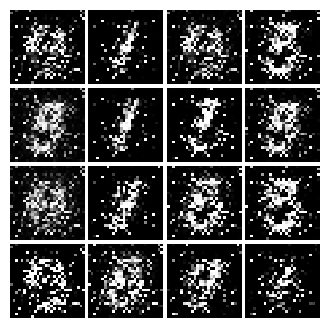

Epoch: 2, Iter: 1020, D: 0.1723, G:0.2856


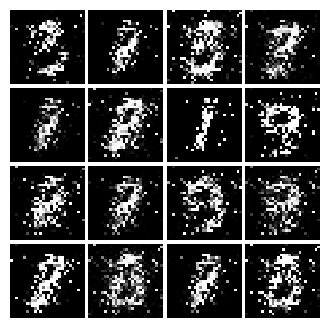

Epoch: 2, Iter: 1040, D: 0.1091, G:0.3686


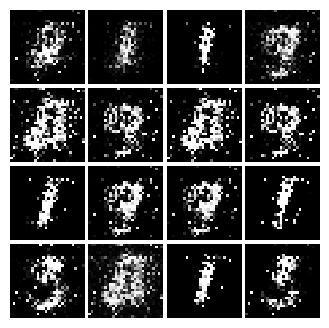

Epoch: 2, Iter: 1060, D: 0.1107, G:0.3341


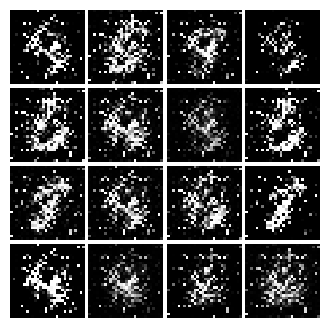

Epoch: 2, Iter: 1080, D: 0.1439, G:0.3171


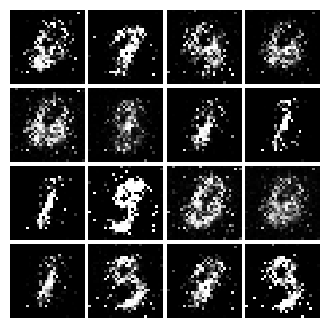

Epoch: 2, Iter: 1100, D: 0.156, G:0.3395


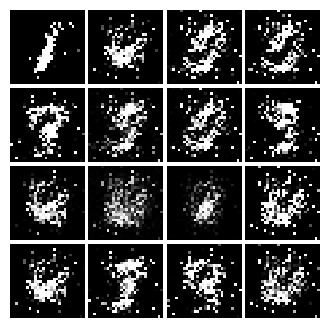

Epoch: 2, Iter: 1120, D: 0.2334, G:1.253


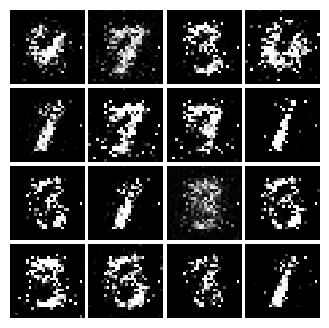

Epoch: 2, Iter: 1140, D: 0.1629, G:0.3039


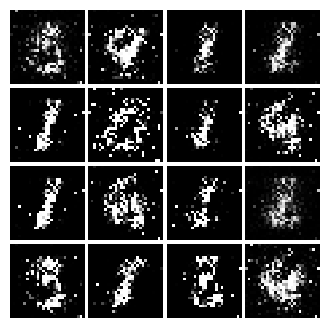

Epoch: 2, Iter: 1160, D: 0.1417, G:0.2649


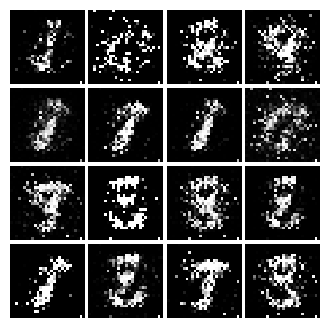

Epoch: 2, Iter: 1180, D: 0.1711, G:0.2542


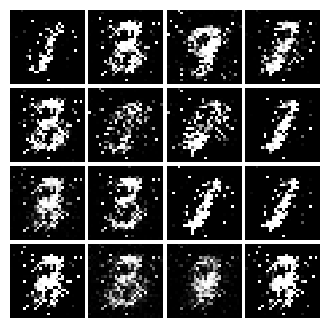

Epoch: 2, Iter: 1200, D: 0.1578, G:0.1991


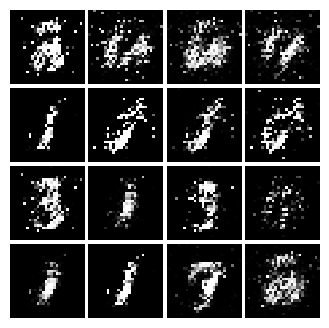

Epoch: 2, Iter: 1220, D: 0.1448, G:0.4232


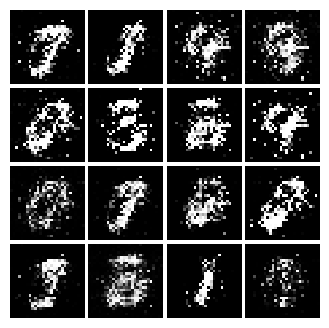

Epoch: 2, Iter: 1240, D: 0.2453, G:0.1901


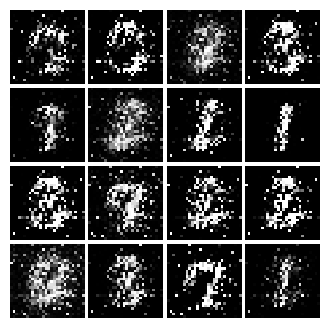

Epoch: 2, Iter: 1260, D: 0.2028, G:0.264


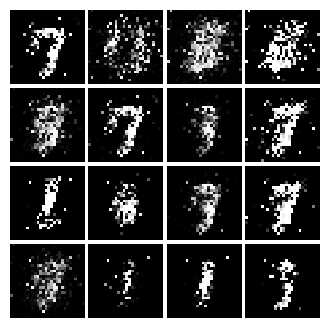

Epoch: 2, Iter: 1280, D: 0.1611, G:0.2826


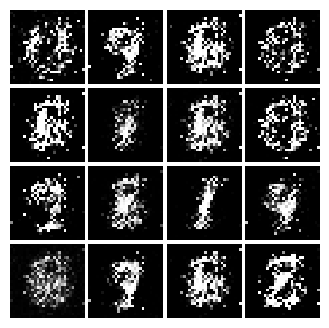

Epoch: 2, Iter: 1300, D: 0.1813, G:0.2387


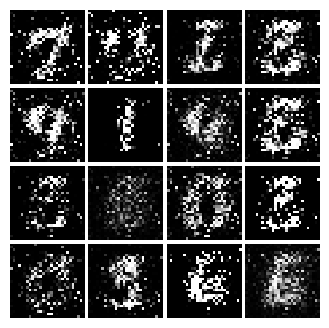

Epoch: 2, Iter: 1320, D: 0.1921, G:0.2103


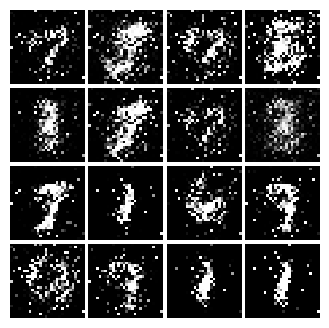

Epoch: 2, Iter: 1340, D: 0.1735, G:0.1887


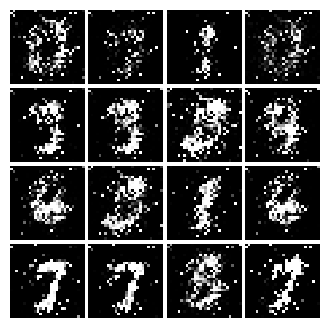

Epoch: 2, Iter: 1360, D: 0.154, G:0.2686


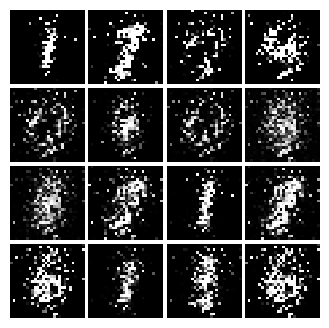

Epoch: 2, Iter: 1380, D: 0.148, G:0.293


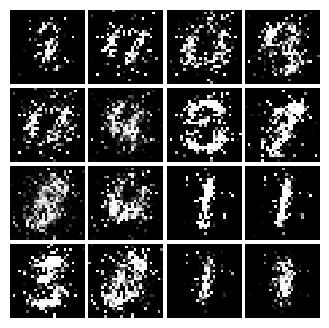

Epoch: 2, Iter: 1400, D: 0.1551, G:0.3119


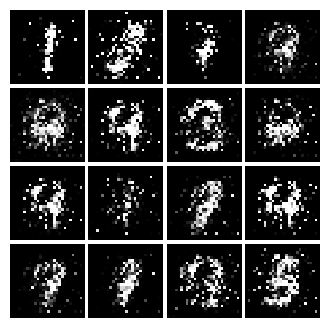

Epoch: 3, Iter: 1420, D: 0.2095, G:0.2563


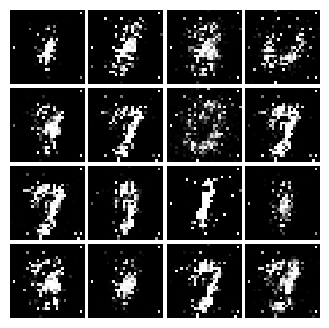

Epoch: 3, Iter: 1440, D: 0.137, G:0.2825


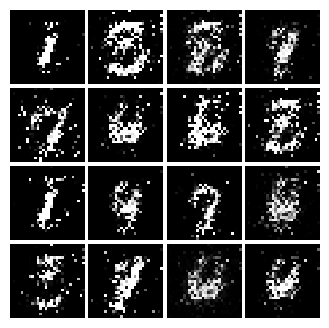

Epoch: 3, Iter: 1460, D: 0.1752, G:0.2748


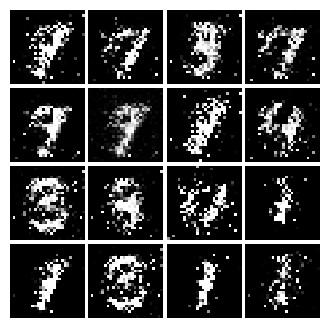

Epoch: 3, Iter: 1480, D: 0.1485, G:0.2635


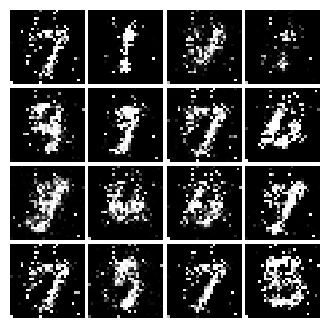

Epoch: 3, Iter: 1500, D: 0.1773, G:0.3472


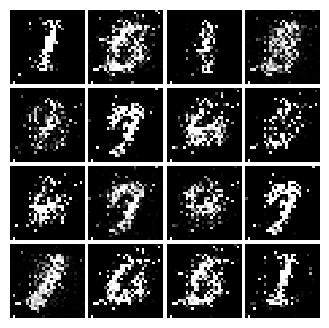

Epoch: 3, Iter: 1520, D: 0.09282, G:0.4279


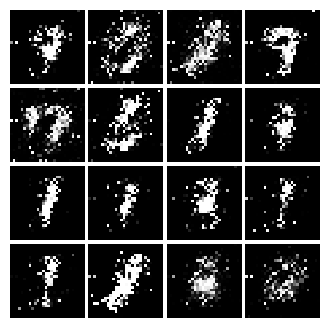

Epoch: 3, Iter: 1540, D: 0.1675, G:0.2753


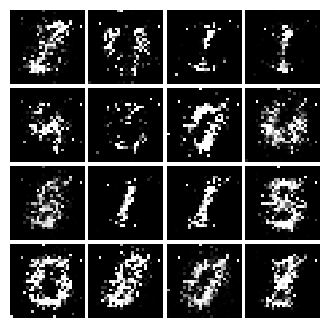

Epoch: 3, Iter: 1560, D: 0.157, G:0.3829


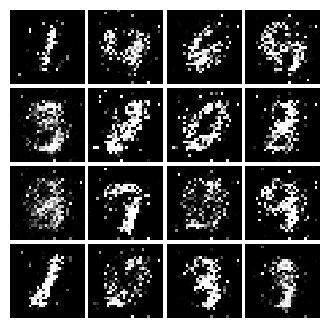

Epoch: 3, Iter: 1580, D: 0.129, G:0.4781


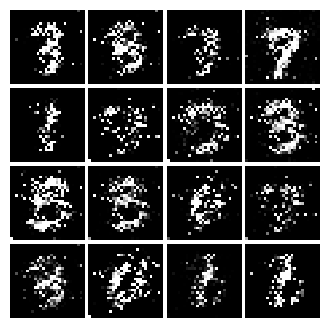

Epoch: 3, Iter: 1600, D: 0.1668, G:0.2481


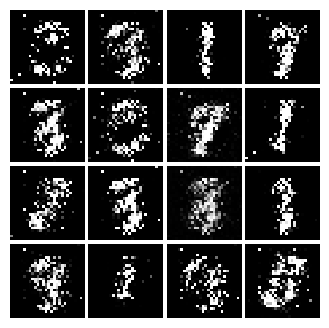

Epoch: 3, Iter: 1620, D: 0.12, G:0.2938


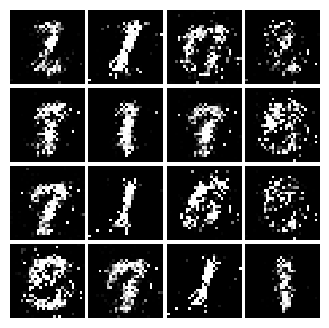

Epoch: 3, Iter: 1640, D: 0.1801, G:0.3144


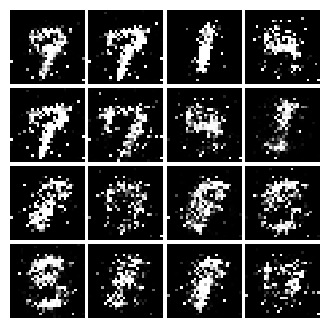

Epoch: 3, Iter: 1660, D: 0.1401, G:0.3111


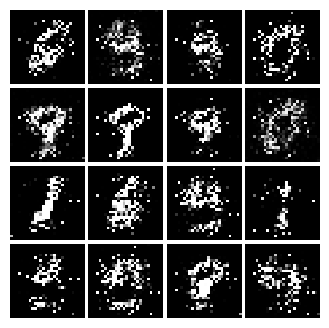

Epoch: 3, Iter: 1680, D: 0.1449, G:0.3389


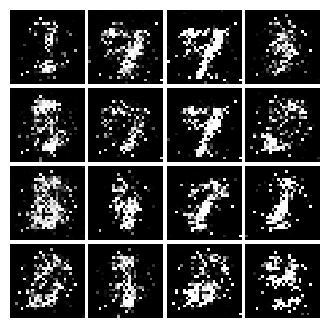

Epoch: 3, Iter: 1700, D: 0.1847, G:0.2636


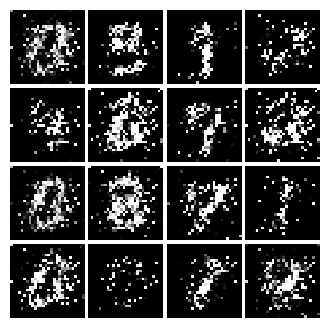

Epoch: 3, Iter: 1720, D: 0.1888, G:0.5096


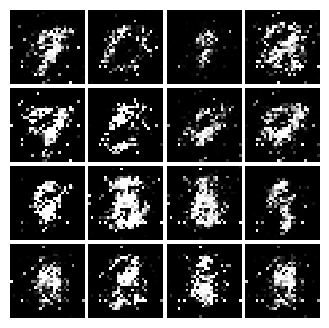

Epoch: 3, Iter: 1740, D: 0.1933, G:0.2725


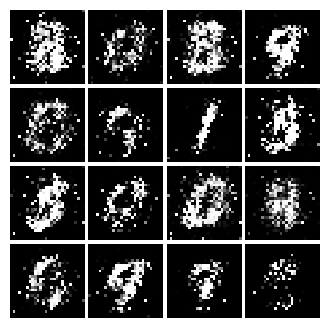

Epoch: 3, Iter: 1760, D: 0.1743, G:0.3449


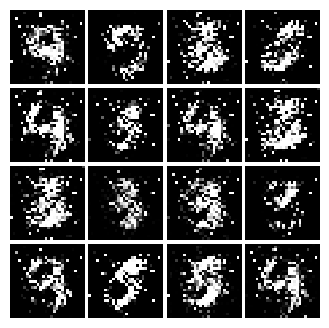

Epoch: 3, Iter: 1780, D: 0.1824, G:0.1997


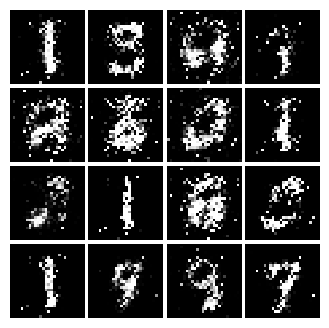

Epoch: 3, Iter: 1800, D: 0.2259, G:0.2188


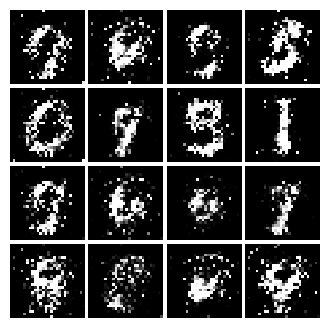

Epoch: 3, Iter: 1820, D: 0.2212, G:0.2295


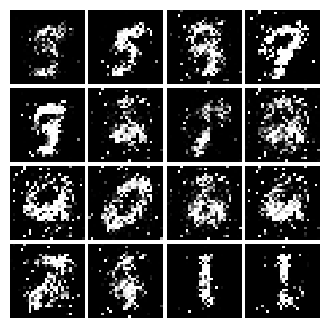

Epoch: 3, Iter: 1840, D: 0.2012, G:0.7776


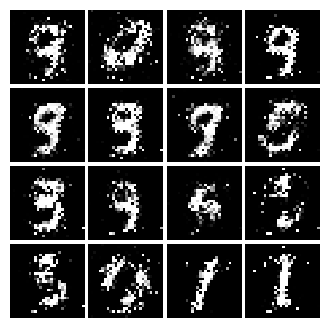

Epoch: 3, Iter: 1860, D: 0.181, G:0.2415


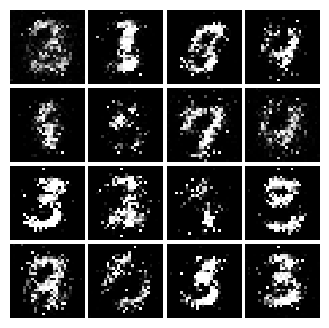

Epoch: 4, Iter: 1880, D: 0.1924, G:0.2322


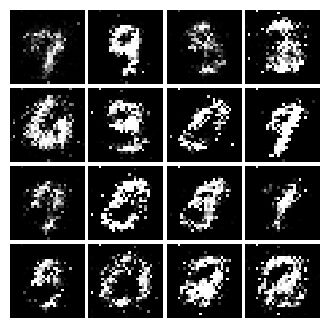

Epoch: 4, Iter: 1900, D: 0.2536, G:0.2289


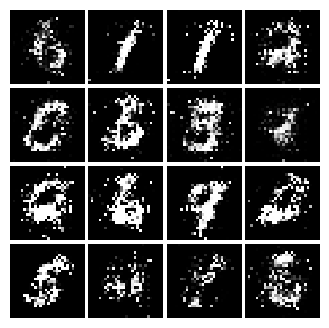

Epoch: 4, Iter: 1920, D: 0.2023, G:0.1983


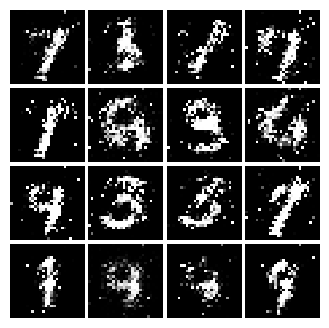

Epoch: 4, Iter: 1940, D: 0.2059, G:0.2043


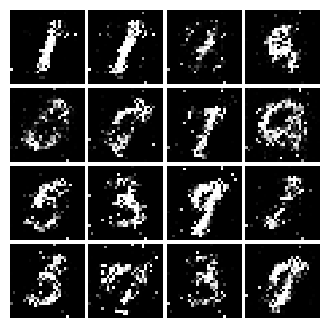

Epoch: 4, Iter: 1960, D: 0.2106, G:0.2388


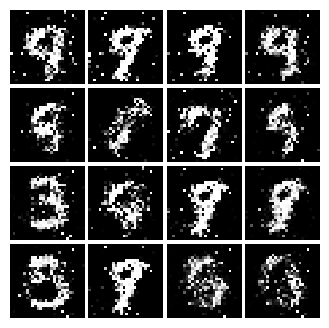

Epoch: 4, Iter: 1980, D: 0.2153, G:0.2162


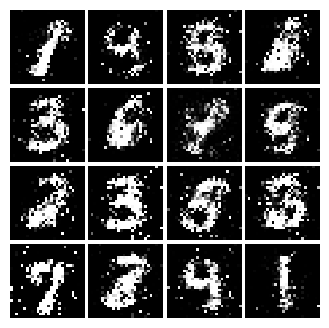

Epoch: 4, Iter: 2000, D: 0.2644, G:0.2299


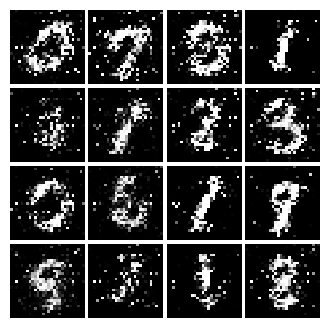

Epoch: 4, Iter: 2020, D: 0.2212, G:0.3346


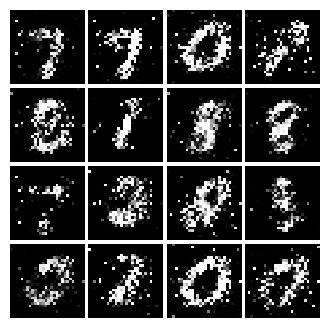

Epoch: 4, Iter: 2040, D: 0.2045, G:0.177


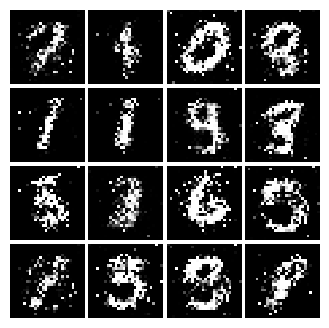

Epoch: 4, Iter: 2060, D: 0.2299, G:0.1651


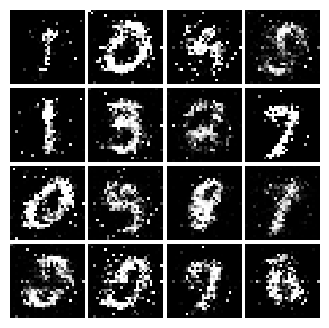

Epoch: 4, Iter: 2080, D: 0.2196, G:0.2043


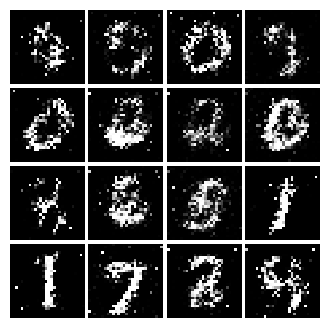

Epoch: 4, Iter: 2100, D: 0.2124, G:0.1954


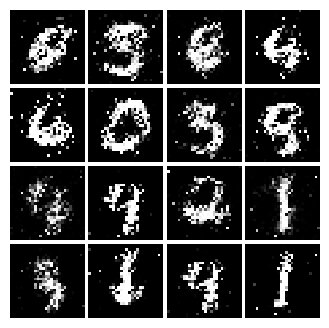

Epoch: 4, Iter: 2120, D: 0.255, G:0.1556


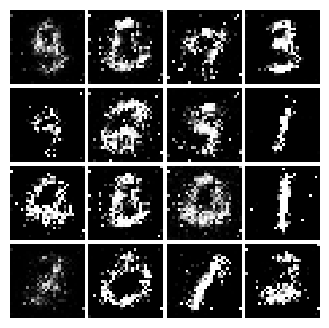

Epoch: 4, Iter: 2140, D: 0.2028, G:0.2114


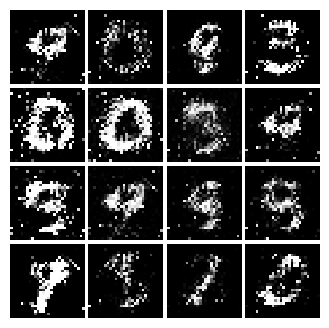

Epoch: 4, Iter: 2160, D: 0.2366, G:0.1654


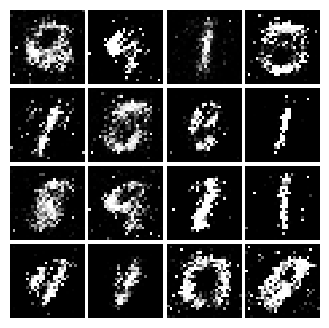

Epoch: 4, Iter: 2180, D: 0.2317, G:0.1704


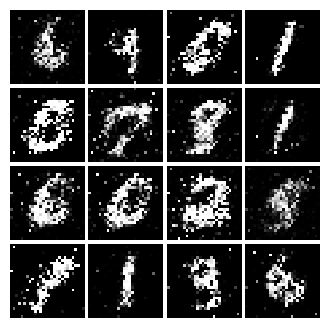

Epoch: 4, Iter: 2200, D: 0.2173, G:0.2116


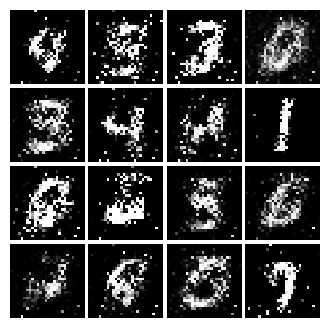

Epoch: 4, Iter: 2220, D: 0.2035, G:0.1774


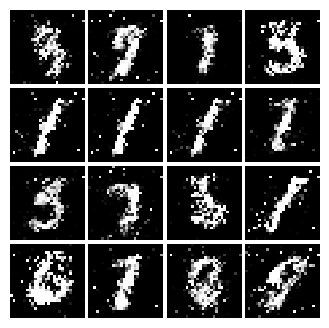

Epoch: 4, Iter: 2240, D: 0.2485, G:0.1977


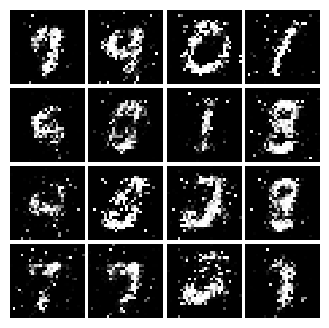

Epoch: 4, Iter: 2260, D: 0.2116, G:0.2195


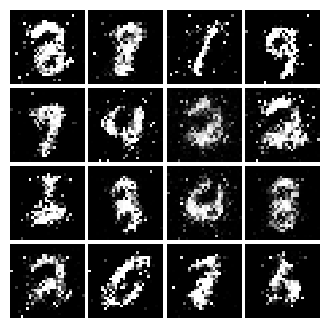

Epoch: 4, Iter: 2280, D: 0.2321, G:0.1842


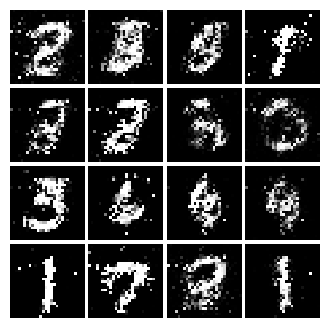

Epoch: 4, Iter: 2300, D: 0.2181, G:0.1682


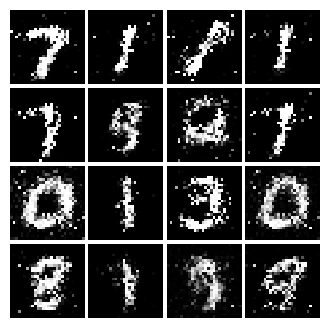

Epoch: 4, Iter: 2320, D: 0.2147, G:0.2189


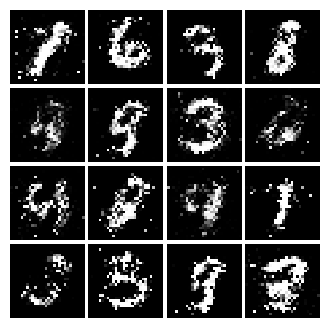

Epoch: 4, Iter: 2340, D: 0.2274, G:0.2857


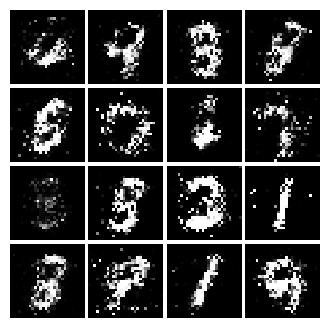

Epoch: 5, Iter: 2360, D: 0.2423, G:0.1801


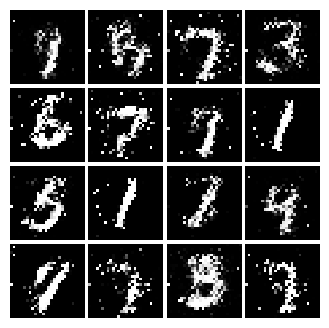

Epoch: 5, Iter: 2380, D: 0.2267, G:0.173


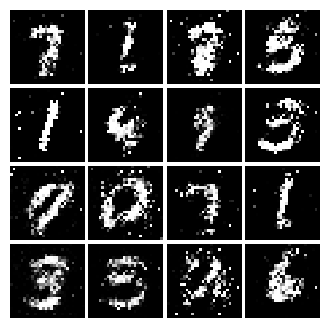

Epoch: 5, Iter: 2400, D: 0.2, G:0.2007


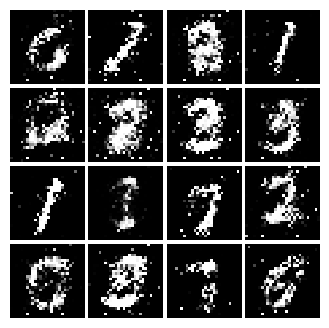

Epoch: 5, Iter: 2420, D: 0.2115, G:0.2252


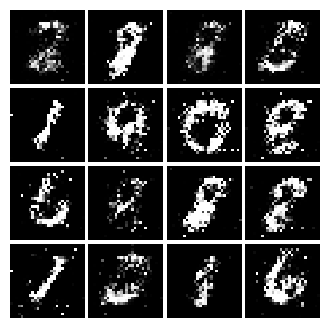

Epoch: 5, Iter: 2440, D: 0.2247, G:0.1865


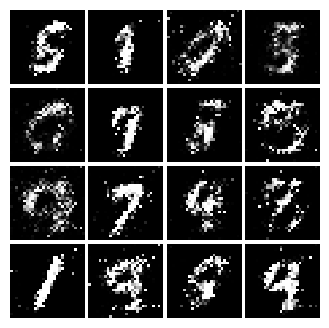

Epoch: 5, Iter: 2460, D: 0.1999, G:0.191


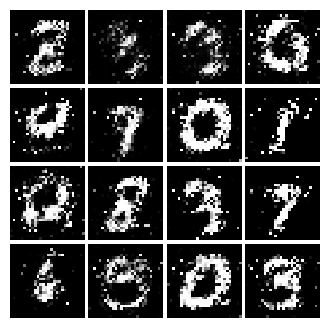

Epoch: 5, Iter: 2480, D: 0.2144, G:0.1778


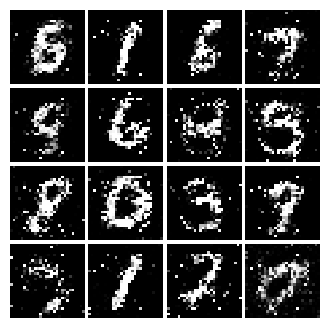

Epoch: 5, Iter: 2500, D: 0.2192, G:0.2725


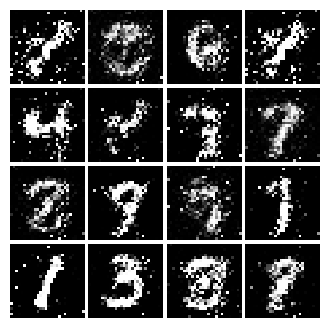

Epoch: 5, Iter: 2520, D: 0.206, G:0.1952


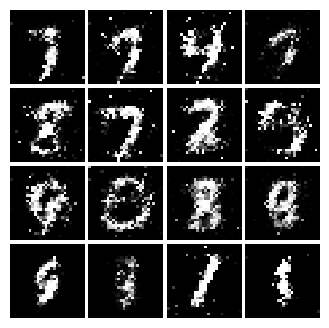

Epoch: 5, Iter: 2540, D: 0.2302, G:0.159


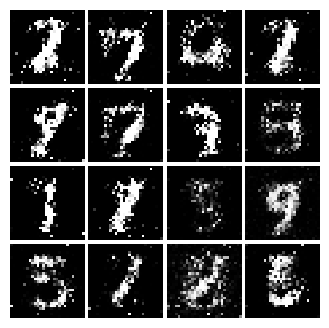

Epoch: 5, Iter: 2560, D: 0.2133, G:0.1782


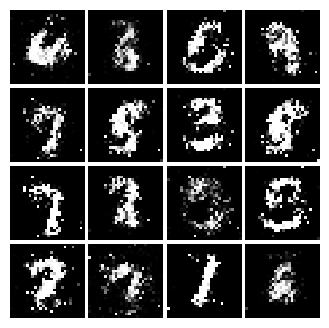

Epoch: 5, Iter: 2580, D: 0.2139, G:0.2341


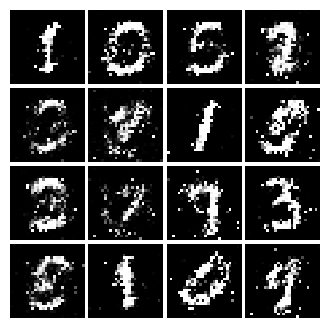

Epoch: 5, Iter: 2600, D: 0.2335, G:0.1654


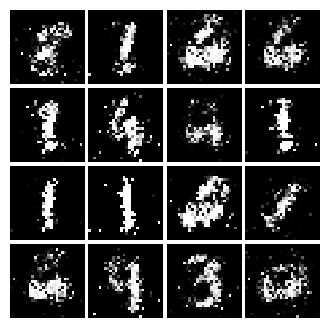

Epoch: 5, Iter: 2620, D: 0.2008, G:0.1958


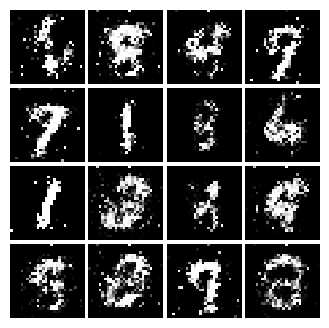

Epoch: 5, Iter: 2640, D: 0.2316, G:0.2177


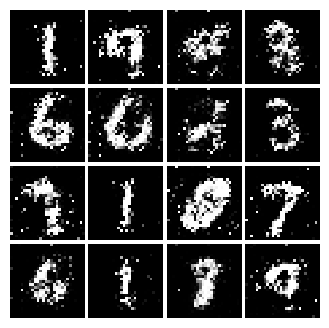

Epoch: 5, Iter: 2660, D: 0.2332, G:0.192


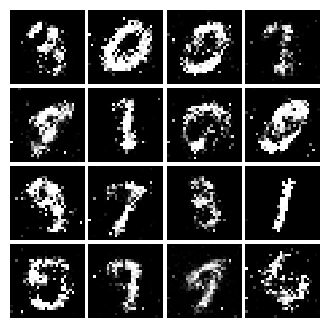

Epoch: 5, Iter: 2680, D: 0.253, G:0.1817


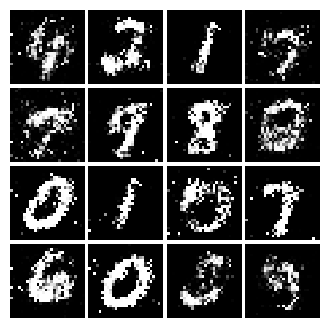

Epoch: 5, Iter: 2700, D: 0.2422, G:0.1852


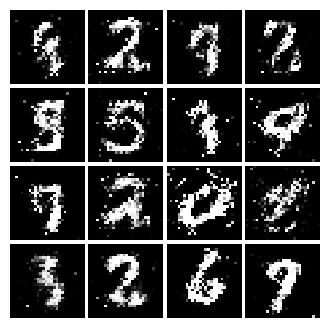

Epoch: 5, Iter: 2720, D: 0.2209, G:0.1699


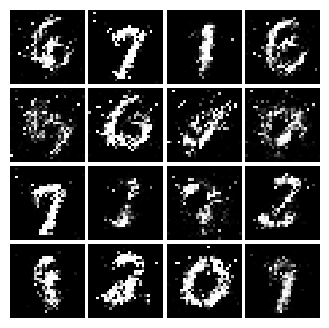

Epoch: 5, Iter: 2740, D: 0.2363, G:0.1764


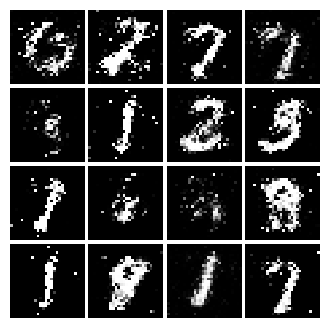

Epoch: 5, Iter: 2760, D: 0.2347, G:0.1496


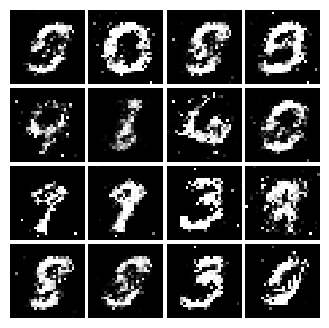

Epoch: 5, Iter: 2780, D: 0.2298, G:0.1504


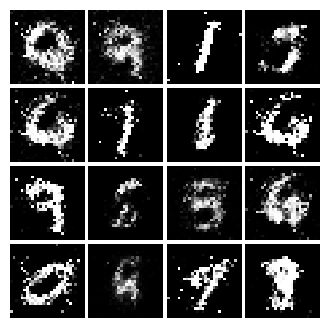

Epoch: 5, Iter: 2800, D: 0.2276, G:0.2045


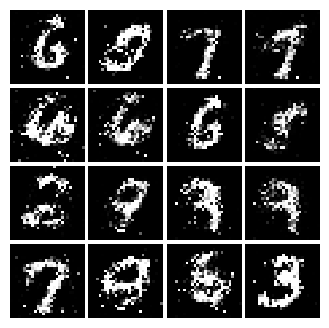

Epoch: 6, Iter: 2820, D: 0.2567, G:0.173


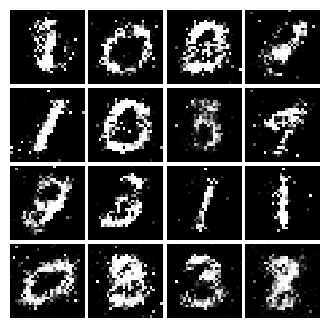

Epoch: 6, Iter: 2840, D: 0.1942, G:0.1873


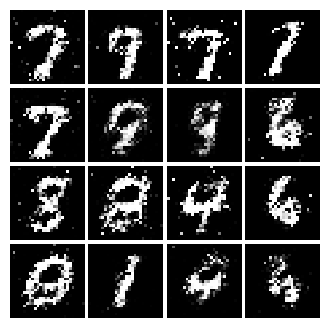

Epoch: 6, Iter: 2860, D: 0.2084, G:0.1675


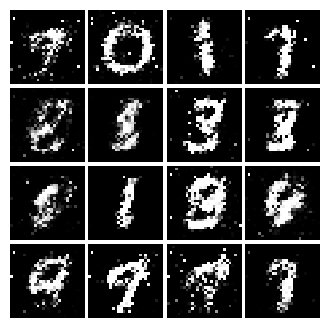

Epoch: 6, Iter: 2880, D: 0.1811, G:0.2263


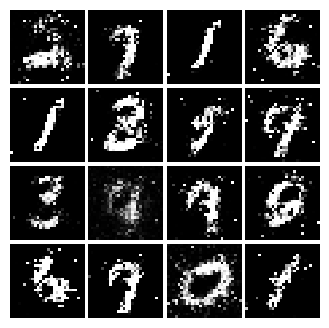

Epoch: 6, Iter: 2900, D: 0.2375, G:0.2028


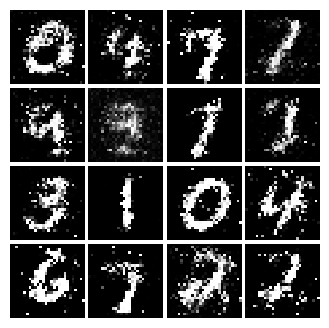

Epoch: 6, Iter: 2920, D: 0.2371, G:0.1677


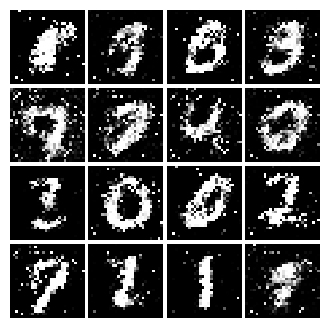

Epoch: 6, Iter: 2940, D: 0.2216, G:0.1732


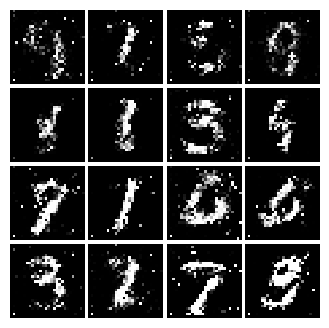

Epoch: 6, Iter: 2960, D: 0.2125, G:0.212


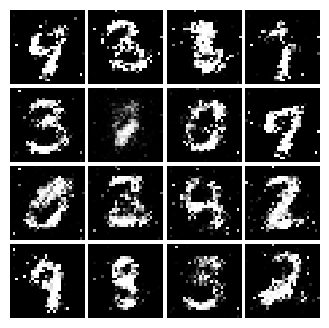

Epoch: 6, Iter: 2980, D: 0.2472, G:0.1443


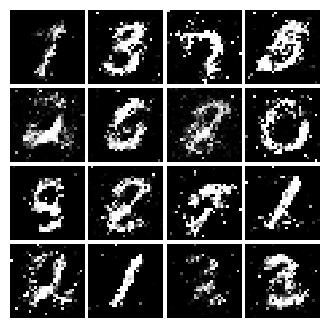

Epoch: 6, Iter: 3000, D: 0.2332, G:0.2192


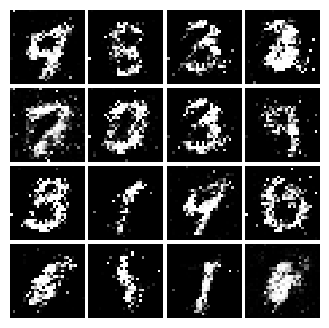

Epoch: 6, Iter: 3020, D: 0.2207, G:0.2304


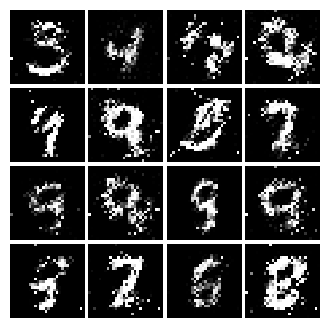

Epoch: 6, Iter: 3040, D: 0.193, G:0.2116


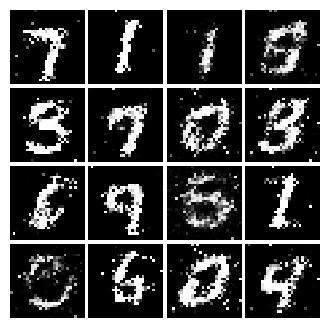

Epoch: 6, Iter: 3060, D: 0.2112, G:0.1745


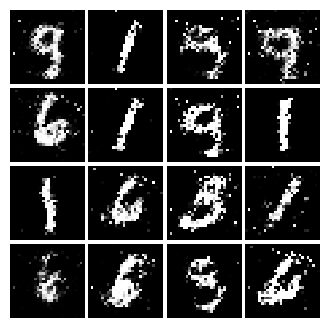

Epoch: 6, Iter: 3080, D: 0.2347, G:0.1933


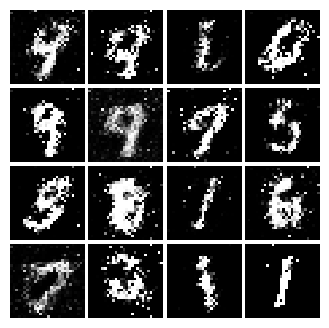

Epoch: 6, Iter: 3100, D: 0.2078, G:0.1539


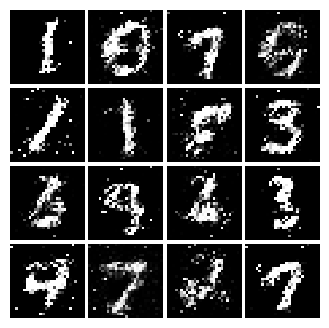

Epoch: 6, Iter: 3120, D: 0.2054, G:0.1844


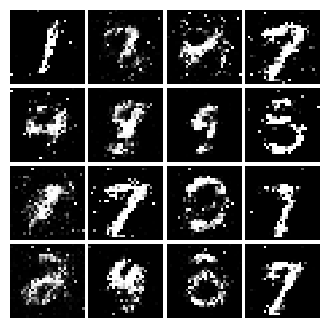

Epoch: 6, Iter: 3140, D: 0.2454, G:0.1579


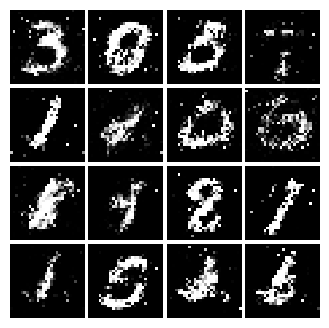

Epoch: 6, Iter: 3160, D: 0.2091, G:0.1917


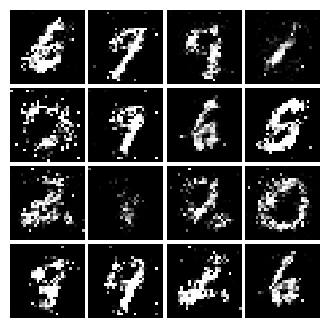

Epoch: 6, Iter: 3180, D: 0.1908, G:0.1925


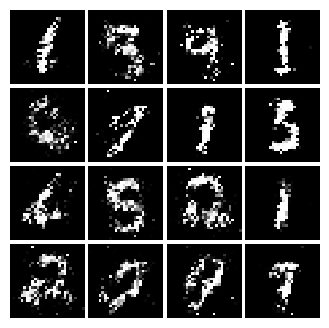

Epoch: 6, Iter: 3200, D: 0.2247, G:0.207


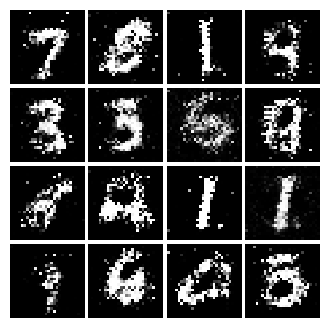

Epoch: 6, Iter: 3220, D: 0.2037, G:0.1784


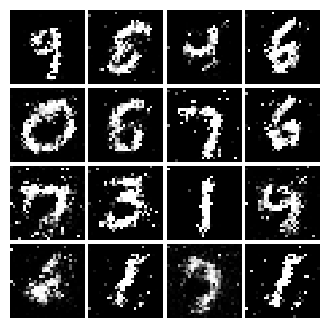

Epoch: 6, Iter: 3240, D: 0.2131, G:0.2133


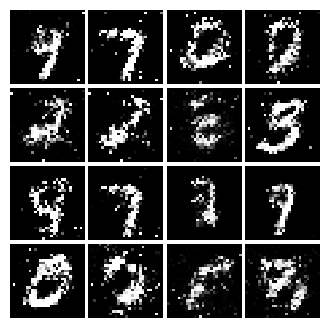

Epoch: 6, Iter: 3260, D: 0.2406, G:0.2041


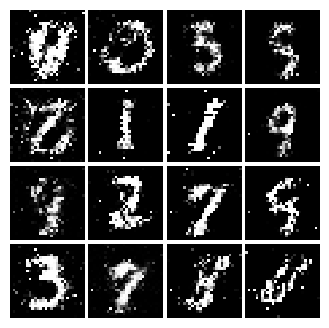

Epoch: 6, Iter: 3280, D: 0.2152, G:0.1424


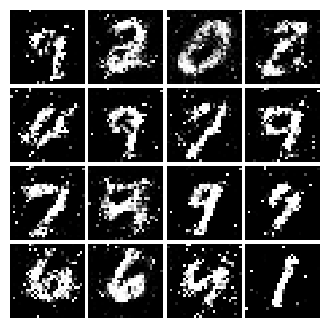

Epoch: 7, Iter: 3300, D: 0.2151, G:0.1796


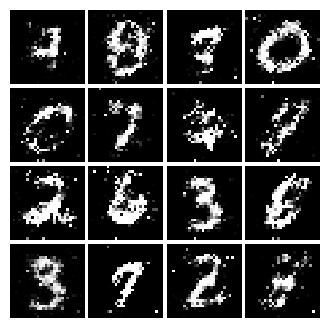

Epoch: 7, Iter: 3320, D: 0.2036, G:0.1895


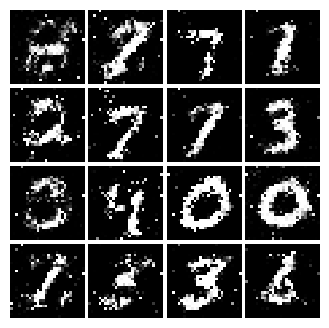

Epoch: 7, Iter: 3340, D: 0.2288, G:0.1702


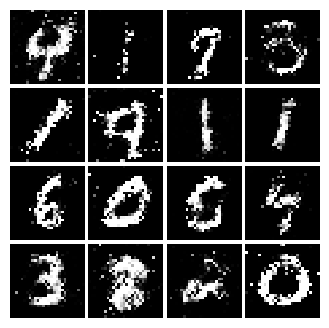

Epoch: 7, Iter: 3360, D: 0.2555, G:0.1412


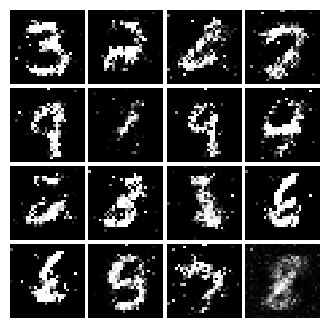

Epoch: 7, Iter: 3380, D: 0.2236, G:0.1746


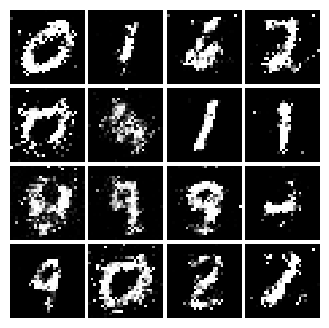

Epoch: 7, Iter: 3400, D: 0.2398, G:0.1925


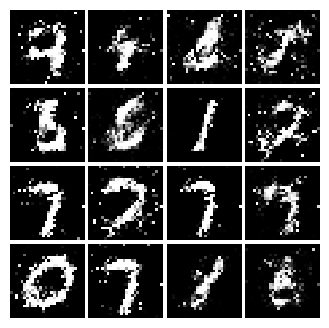

Epoch: 7, Iter: 3420, D: 0.2125, G:0.1439


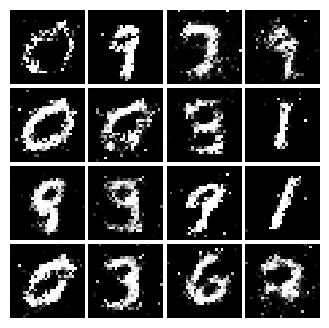

Epoch: 7, Iter: 3440, D: 0.2222, G:0.1828


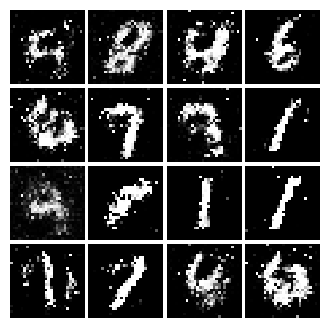

Epoch: 7, Iter: 3460, D: 0.2064, G:0.1682


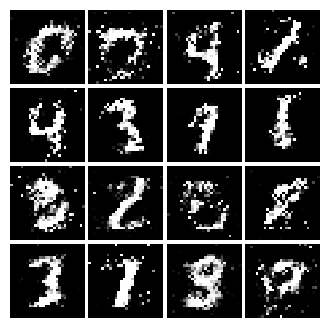

Epoch: 7, Iter: 3480, D: 0.2194, G:0.1817


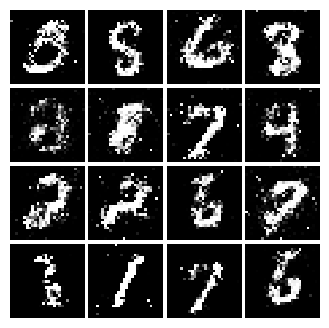

Epoch: 7, Iter: 3500, D: 0.2206, G:0.1678


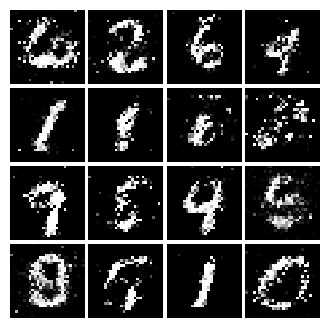

Epoch: 7, Iter: 3520, D: 0.2209, G:0.1764


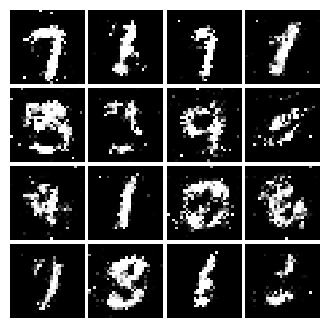

Epoch: 7, Iter: 3540, D: 0.1956, G:0.1856


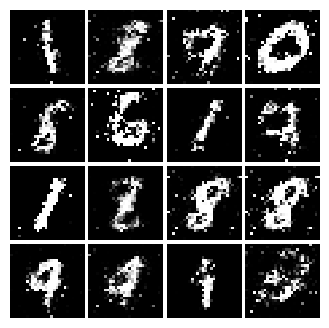

Epoch: 7, Iter: 3560, D: 0.2285, G:0.1789


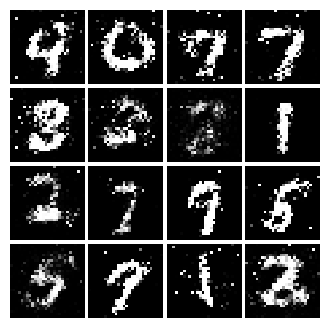

Epoch: 7, Iter: 3580, D: 0.2305, G:0.1925


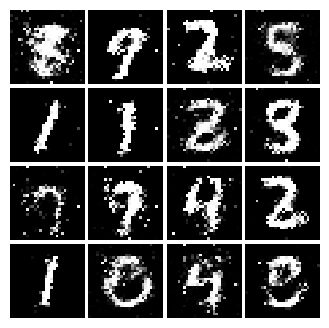

Epoch: 7, Iter: 3600, D: 0.2108, G:0.1874


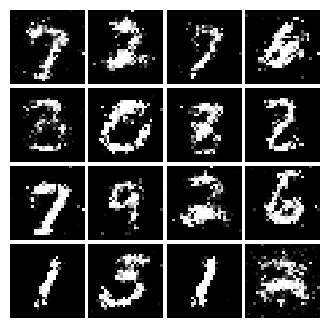

Epoch: 7, Iter: 3620, D: 0.2595, G:0.1341


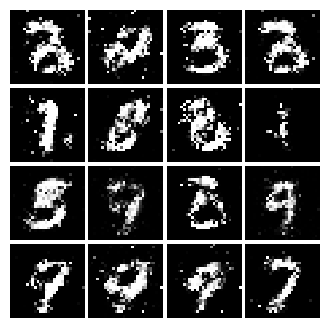

Epoch: 7, Iter: 3640, D: 0.237, G:0.1677


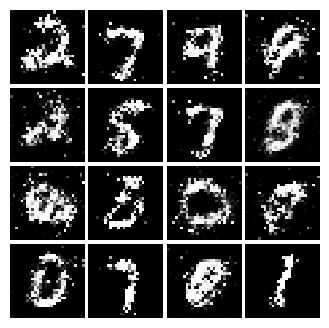

Epoch: 7, Iter: 3660, D: 0.2344, G:0.1583


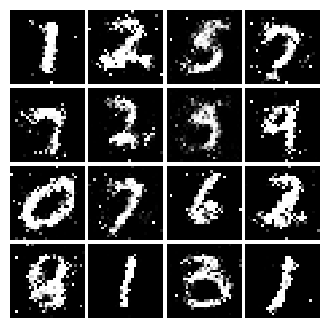

Epoch: 7, Iter: 3680, D: 0.2228, G:0.1679


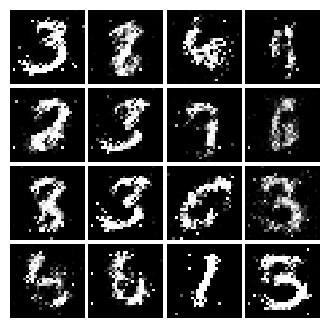

Epoch: 7, Iter: 3700, D: 0.2325, G:0.1614


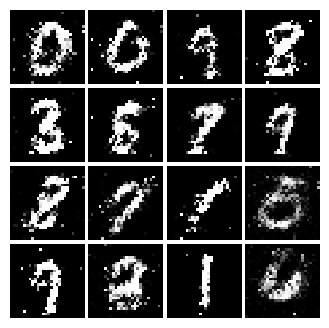

Epoch: 7, Iter: 3720, D: 0.2094, G:0.186


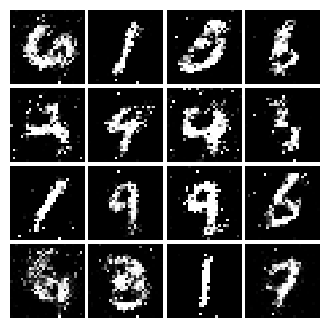

Epoch: 7, Iter: 3740, D: 0.2278, G:0.1752


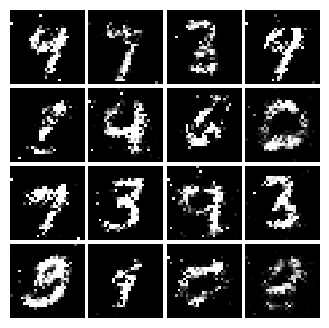

Epoch: 8, Iter: 3760, D: 0.2997, G:0.2217


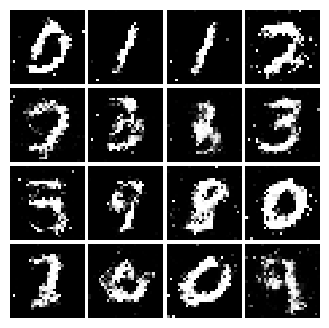

Epoch: 8, Iter: 3780, D: 0.2544, G:0.1544


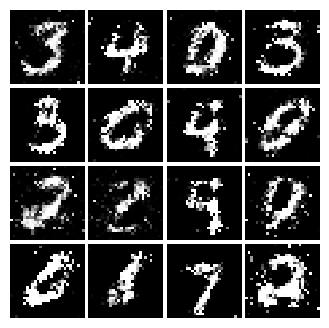

Epoch: 8, Iter: 3800, D: 0.2216, G:0.1571


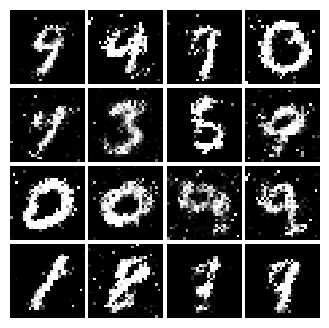

Epoch: 8, Iter: 3820, D: 0.2702, G:0.1662


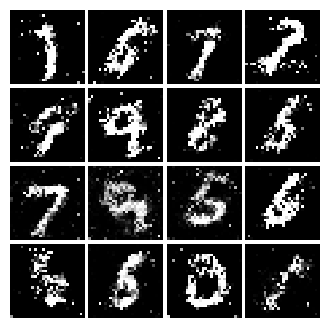

Epoch: 8, Iter: 3840, D: 0.2165, G:0.1553


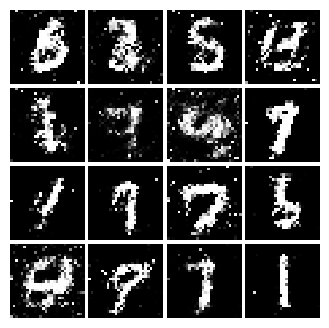

Epoch: 8, Iter: 3860, D: 0.2491, G:0.1546


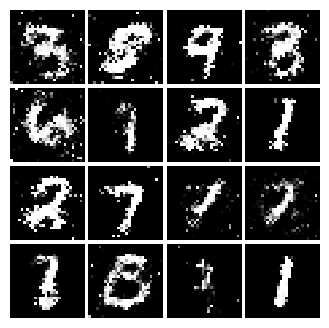

Epoch: 8, Iter: 3880, D: 0.2402, G:0.148


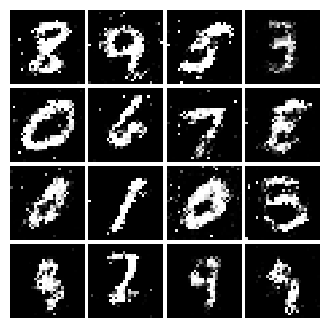

Epoch: 8, Iter: 3900, D: 0.2398, G:0.1545


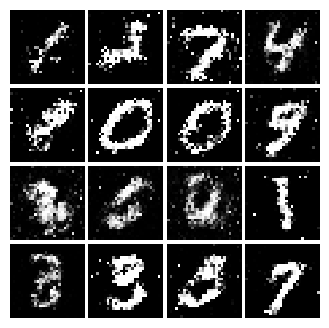

Epoch: 8, Iter: 3920, D: 0.2378, G:0.1564


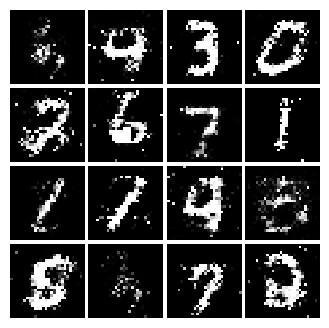

Epoch: 8, Iter: 3940, D: 0.2275, G:0.1626


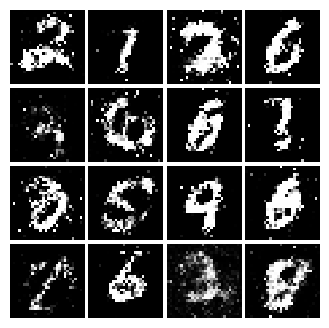

Epoch: 8, Iter: 3960, D: 0.2358, G:0.1649


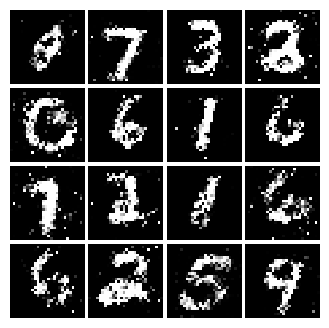

Epoch: 8, Iter: 3980, D: 0.2291, G:0.1819


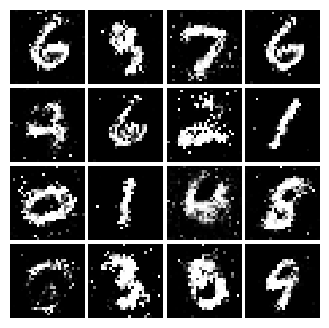

Epoch: 8, Iter: 4000, D: 0.2101, G:0.1794


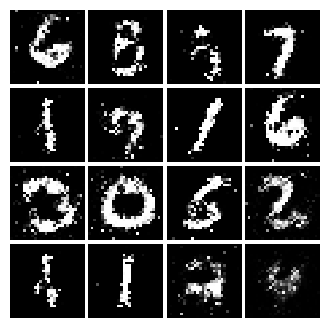

Epoch: 8, Iter: 4020, D: 0.2579, G:0.1647


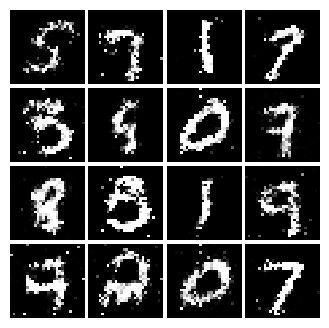

Epoch: 8, Iter: 4040, D: 0.2303, G:0.1661


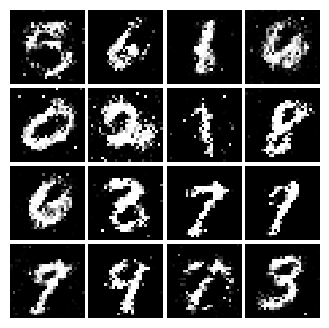

Epoch: 8, Iter: 4060, D: 0.2193, G:0.1671


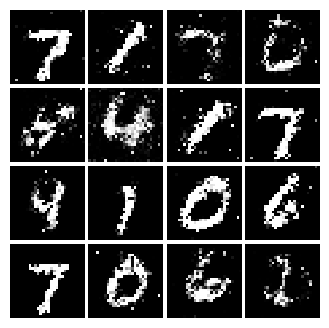

Epoch: 8, Iter: 4080, D: 0.2523, G:0.1516


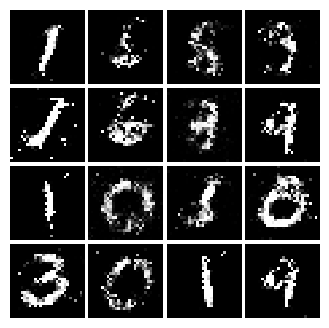

Epoch: 8, Iter: 4100, D: 0.2176, G:0.1668


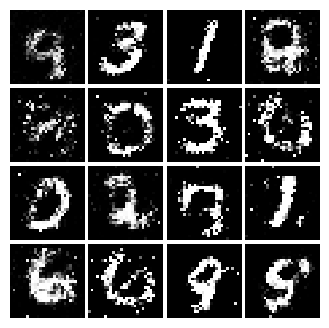

Epoch: 8, Iter: 4120, D: 0.2433, G:0.1684


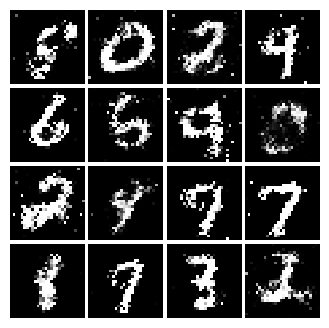

Epoch: 8, Iter: 4140, D: 0.2351, G:0.1721


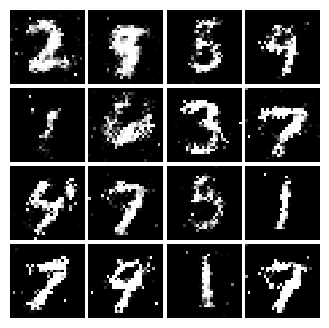

Epoch: 8, Iter: 4160, D: 0.2432, G:0.1774


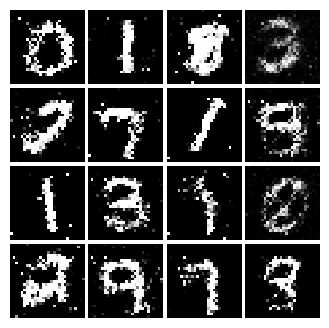

Epoch: 8, Iter: 4180, D: 0.2277, G:0.1683


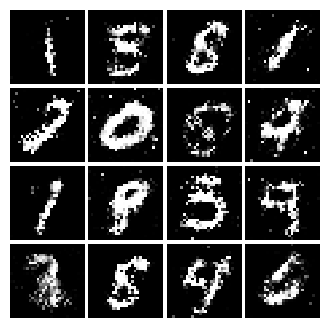

Epoch: 8, Iter: 4200, D: 0.2263, G:0.1628


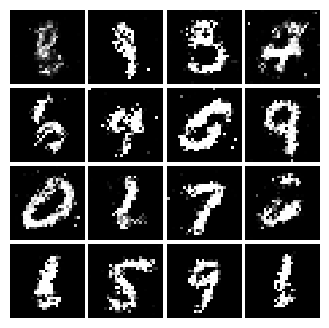

Epoch: 8, Iter: 4220, D: 0.249, G:0.1669


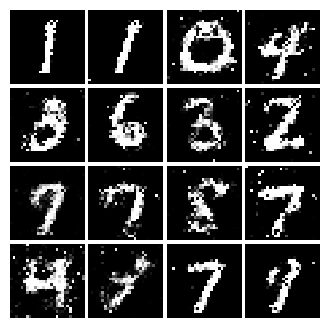

Epoch: 9, Iter: 4240, D: 0.2295, G:0.1486


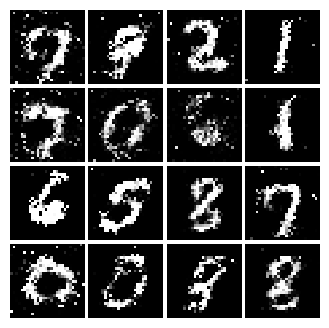

Epoch: 9, Iter: 4260, D: 0.2389, G:0.1498


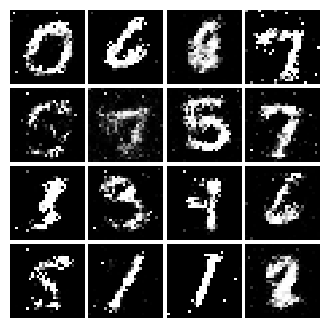

Epoch: 9, Iter: 4280, D: 0.2234, G:0.197


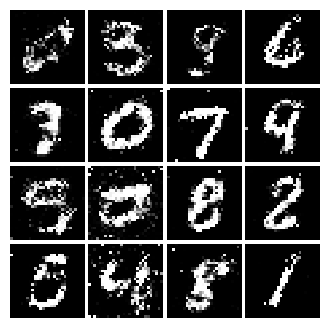

Epoch: 9, Iter: 4300, D: 0.2289, G:0.1713


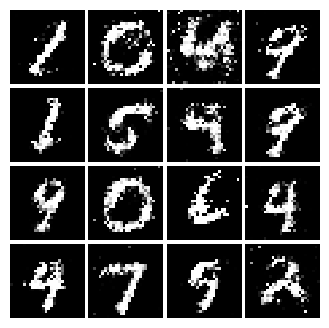

Epoch: 9, Iter: 4320, D: 0.2409, G:0.1726


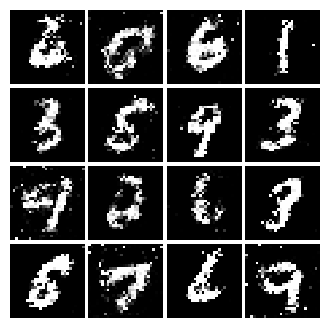

Epoch: 9, Iter: 4340, D: 0.2384, G:0.1785


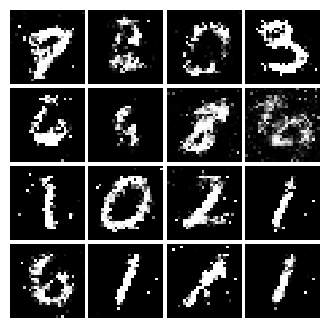

Epoch: 9, Iter: 4360, D: 0.2106, G:0.168


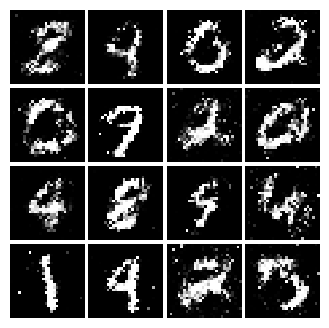

Epoch: 9, Iter: 4380, D: 0.2513, G:0.17


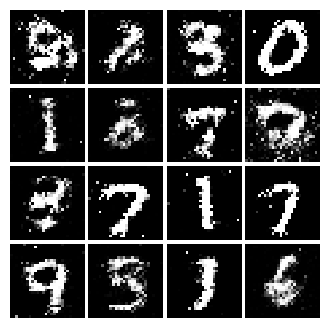

Epoch: 9, Iter: 4400, D: 0.2202, G:0.1891


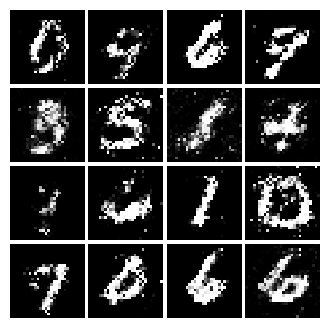

Epoch: 9, Iter: 4420, D: 0.2169, G:0.1658


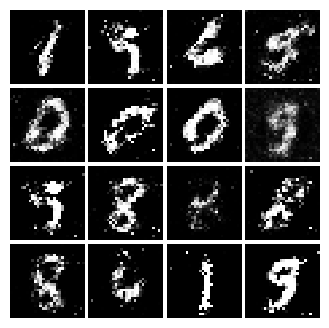

Epoch: 9, Iter: 4440, D: 0.23, G:0.171


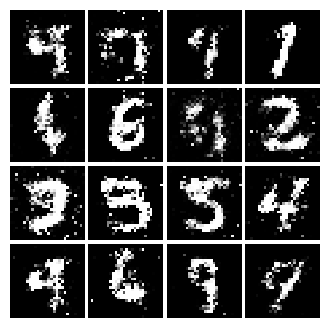

Epoch: 9, Iter: 4460, D: 0.2579, G:0.1683


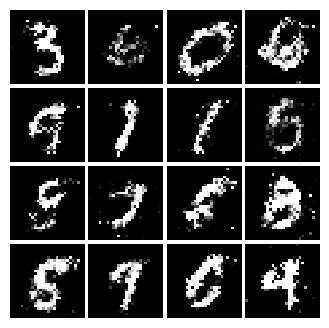

Epoch: 9, Iter: 4480, D: 0.2382, G:0.1582


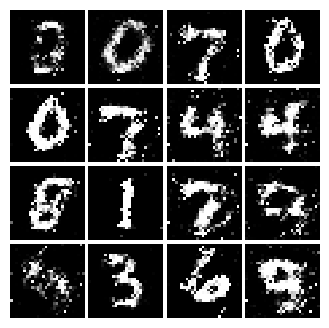

Epoch: 9, Iter: 4500, D: 0.248, G:0.1524


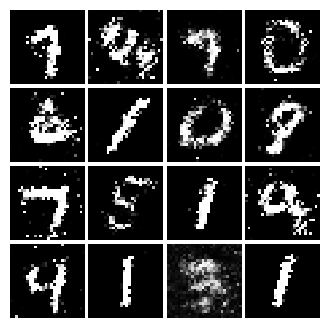

Epoch: 9, Iter: 4520, D: 0.2322, G:0.167


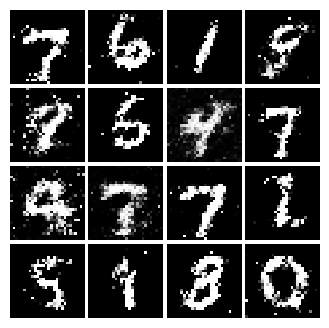

Epoch: 9, Iter: 4540, D: 0.2381, G:0.174


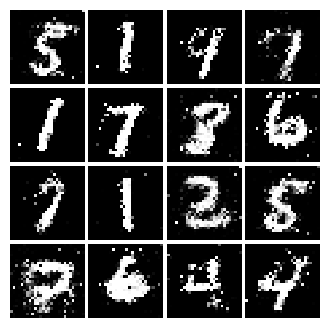

Epoch: 9, Iter: 4560, D: 0.2126, G:0.1729


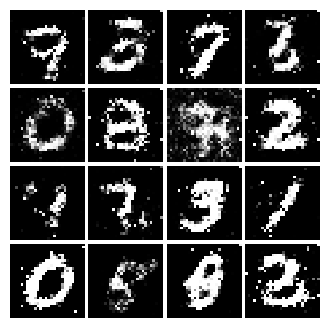

Epoch: 9, Iter: 4580, D: 0.2273, G:0.1651


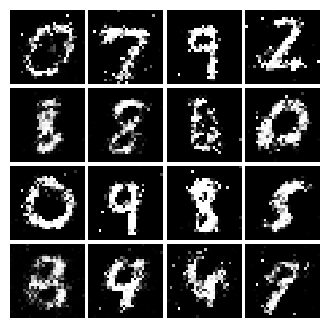

Epoch: 9, Iter: 4600, D: 0.2461, G:0.211


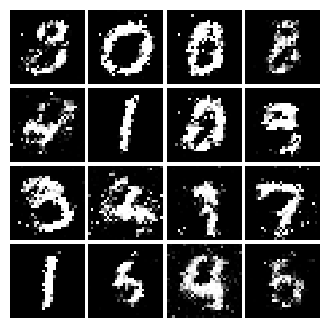

Epoch: 9, Iter: 4620, D: 0.2373, G:0.1616


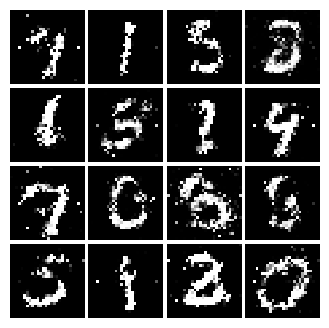

Epoch: 9, Iter: 4640, D: 0.2289, G:0.1628


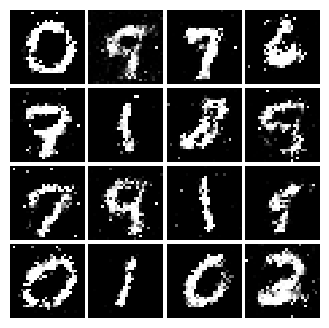

Epoch: 9, Iter: 4660, D: 0.2296, G:0.152


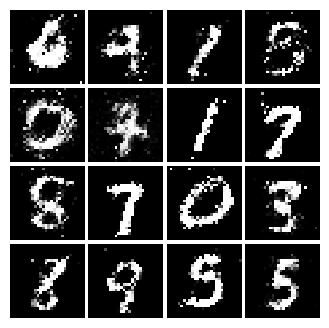

Epoch: 9, Iter: 4680, D: 0.2451, G:0.1684


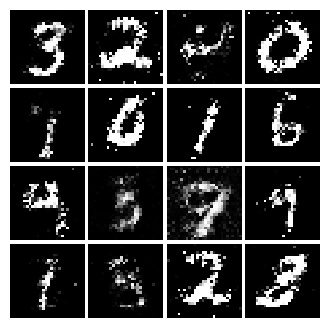

Final images


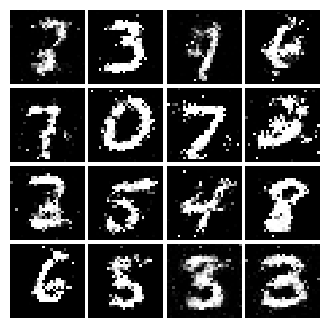

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs


In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(input_shape=(784,)),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Correct number of parameters in discriminator.


#### Generator


In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(input_shape=(noise_dim,)),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


### Train and evaluate a DCGAN


Epoch: 0, Iter: 0, D: 1.377, G:0.6564


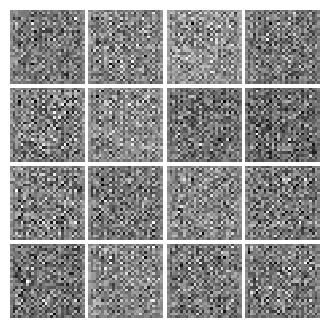

Epoch: 0, Iter: 20, D: 0.7121, G:0.8757


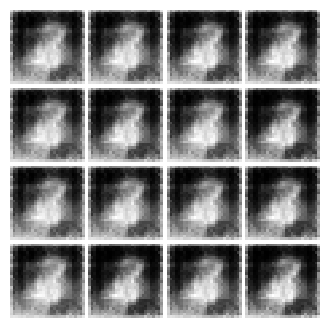

Epoch: 0, Iter: 40, D: 0.3058, G:2.356


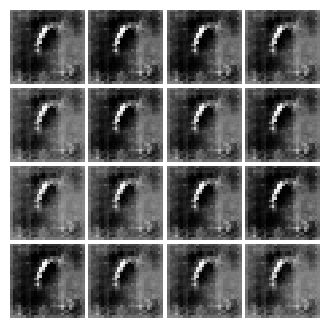

Epoch: 0, Iter: 60, D: 1.056, G:0.5093


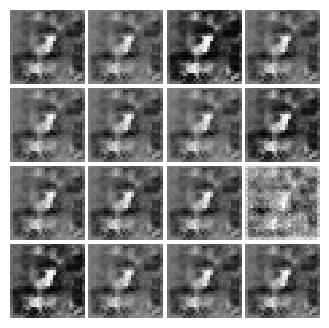

Epoch: 0, Iter: 80, D: 1.15, G:1.863


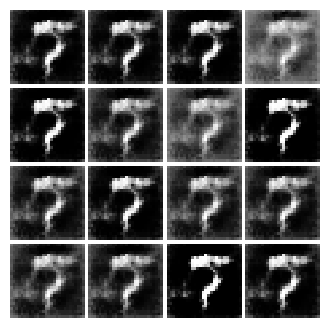

Epoch: 0, Iter: 100, D: 0.4908, G:1.378


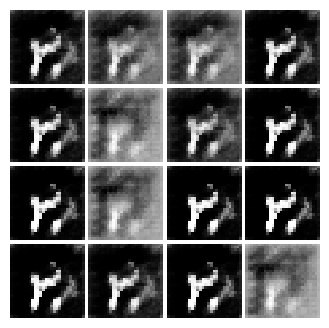

Epoch: 0, Iter: 120, D: 0.8951, G:1.036


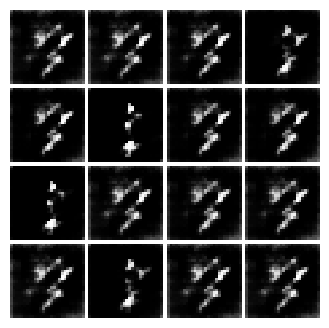

Epoch: 0, Iter: 140, D: 0.7183, G:5.365


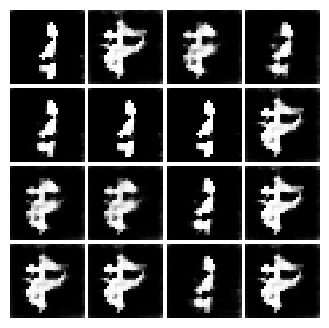

Epoch: 0, Iter: 160, D: 0.3719, G:2.185


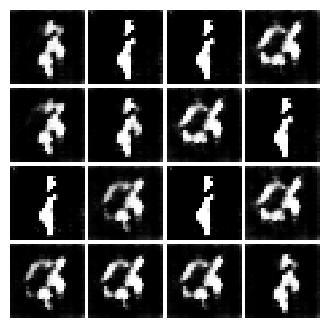

Epoch: 0, Iter: 180, D: 1.016, G:3.381


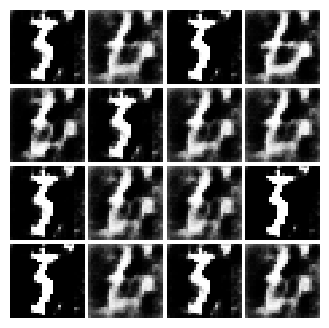

Epoch: 0, Iter: 200, D: 0.5331, G:2.732


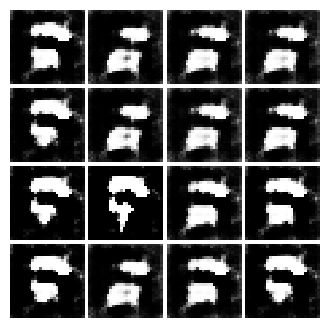

Epoch: 0, Iter: 220, D: 0.1544, G:3.685


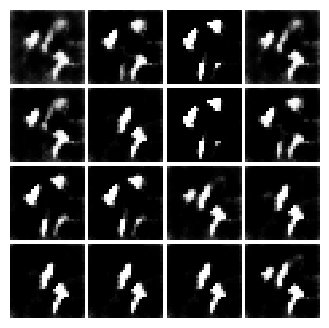

Epoch: 0, Iter: 240, D: 0.5368, G:2.359


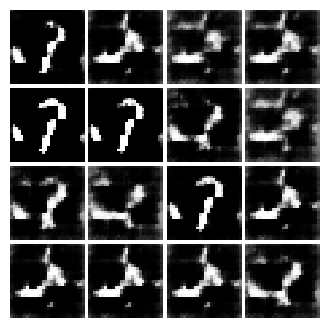

Epoch: 0, Iter: 260, D: 0.4337, G:3.682


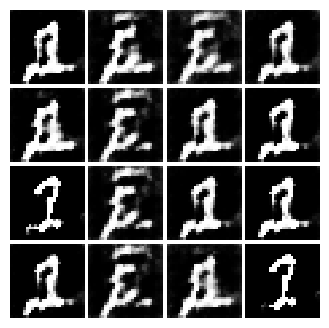

Epoch: 0, Iter: 280, D: 0.5134, G:2.691


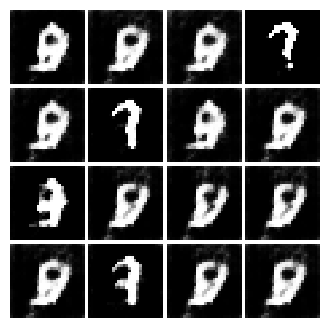

Epoch: 0, Iter: 300, D: 0.9328, G:2.853


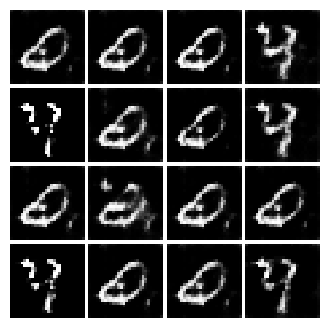

Epoch: 0, Iter: 320, D: 0.5231, G:2.725


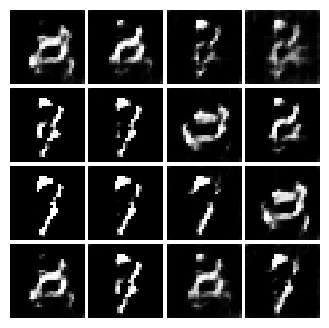

Epoch: 0, Iter: 340, D: 0.4041, G:2.719


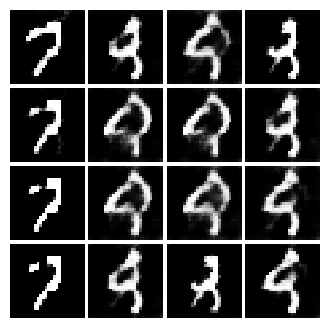

Epoch: 0, Iter: 360, D: 0.3746, G:2.261


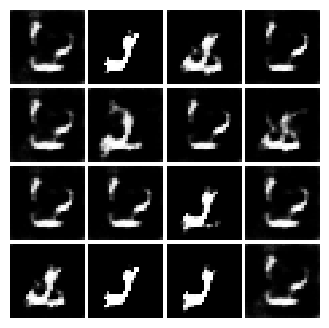

Epoch: 0, Iter: 380, D: 0.6826, G:2.759


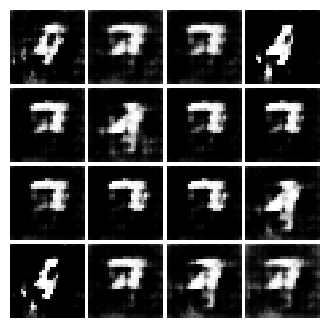

Epoch: 0, Iter: 400, D: 0.2872, G:2.777


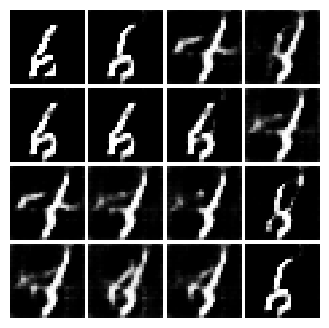

Epoch: 0, Iter: 420, D: 0.4675, G:3.257


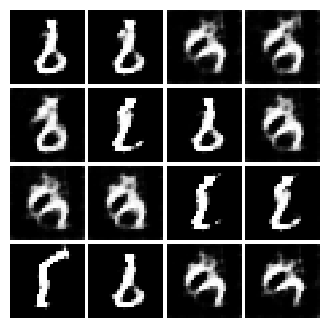

Epoch: 0, Iter: 440, D: 0.902, G:3.918


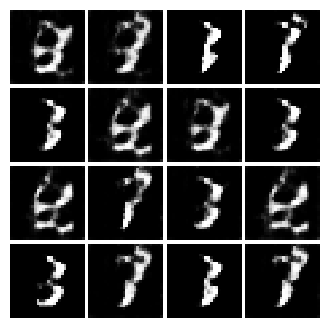

Epoch: 0, Iter: 460, D: 0.4185, G:2.497


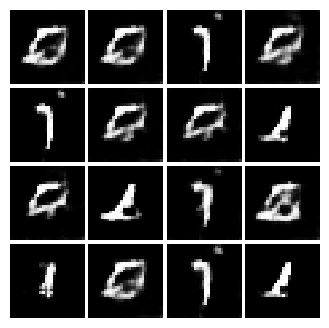

Epoch: 1, Iter: 480, D: 0.6875, G:2.486


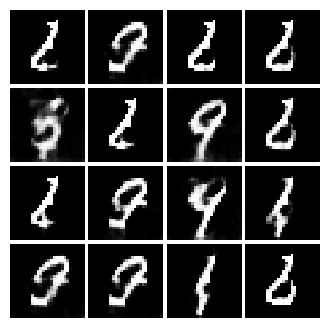

Epoch: 1, Iter: 500, D: 0.8097, G:3.647


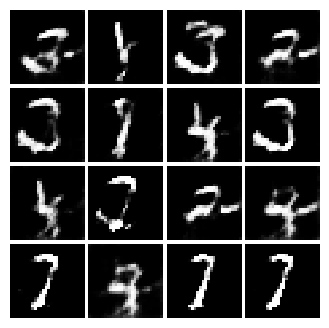

Epoch: 1, Iter: 520, D: 0.4131, G:2.2


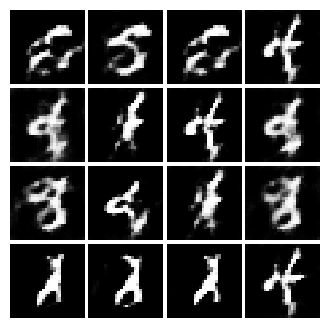

Epoch: 1, Iter: 540, D: 0.7263, G:2.391


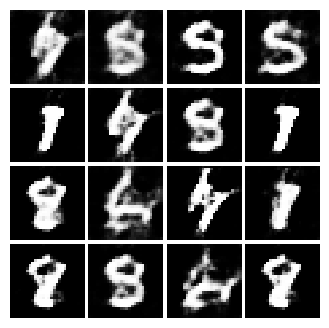

Epoch: 1, Iter: 560, D: 0.8134, G:0.8532


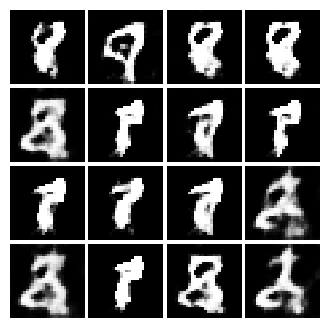

Epoch: 1, Iter: 580, D: 0.6724, G:1.882


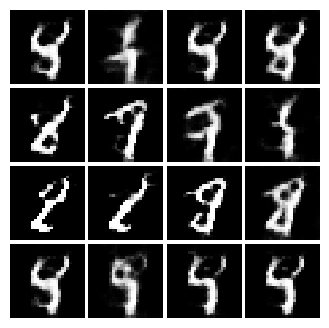

Epoch: 1, Iter: 600, D: 0.8564, G:1.391


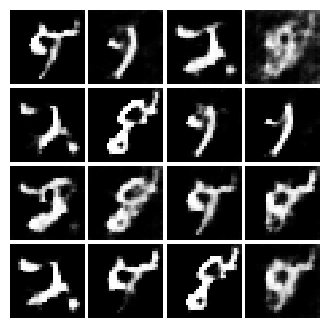

Epoch: 1, Iter: 620, D: 0.4533, G:2.851


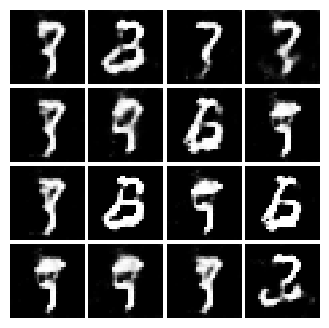

Epoch: 1, Iter: 640, D: 2.661, G:7.75


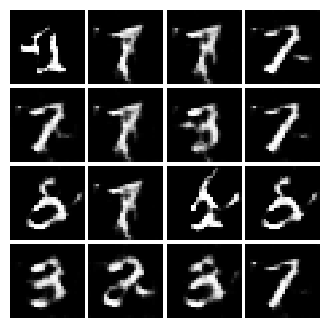

Epoch: 1, Iter: 660, D: 0.7327, G:2.07


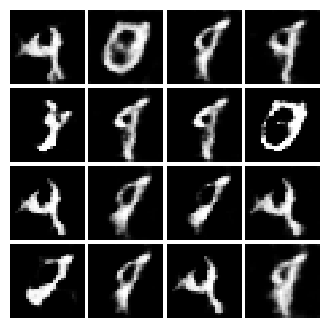

Epoch: 1, Iter: 680, D: 1.211, G:1.679


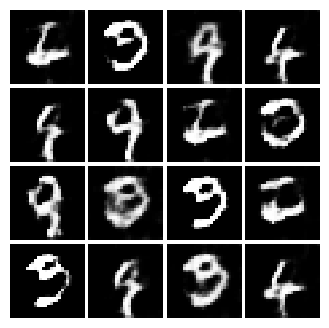

Epoch: 1, Iter: 700, D: 0.6332, G:2.928


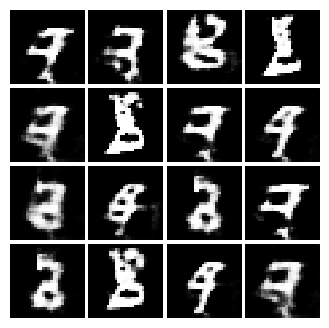

Epoch: 1, Iter: 720, D: 0.4876, G:3.544


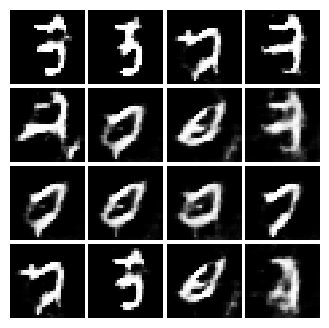

Epoch: 1, Iter: 740, D: 1.103, G:1.473


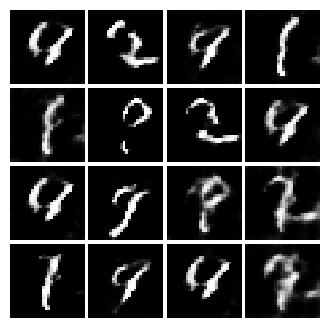

Epoch: 1, Iter: 760, D: 0.7024, G:1.927


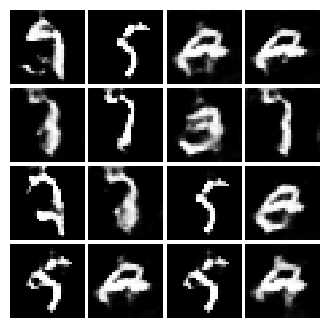

Epoch: 1, Iter: 780, D: 0.4514, G:2.77


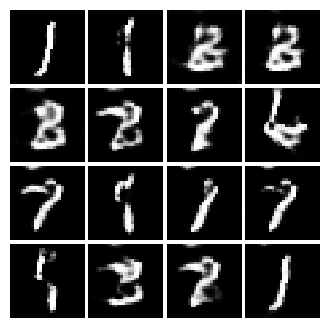

Epoch: 1, Iter: 800, D: 0.4525, G:2.472


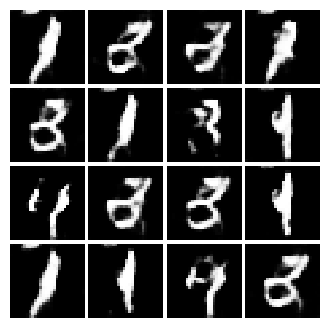

Epoch: 1, Iter: 820, D: 0.6003, G:2.827


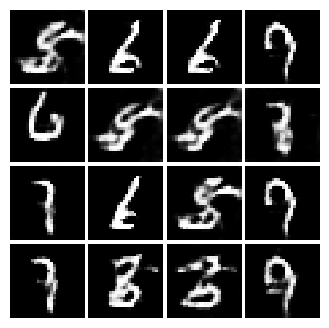

Epoch: 1, Iter: 840, D: 0.5288, G:2.426


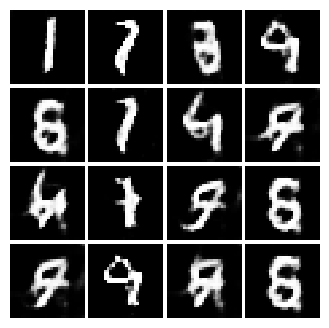

Epoch: 1, Iter: 860, D: 1.629, G:2.87


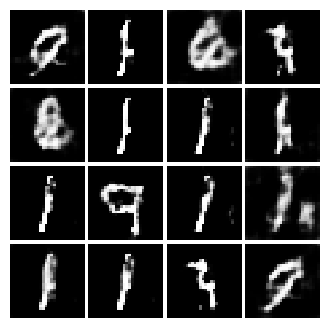

Epoch: 1, Iter: 880, D: 0.3946, G:2.499


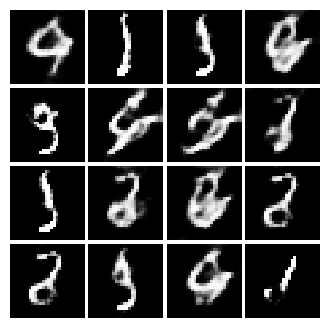

Epoch: 1, Iter: 900, D: 0.4913, G:2.61


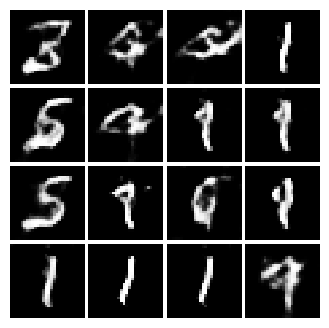

Epoch: 1, Iter: 920, D: 0.7831, G:2.567


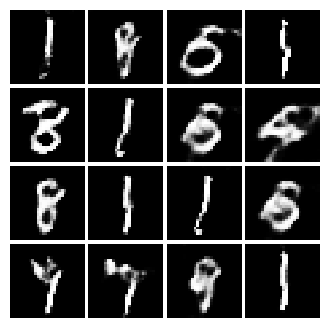

Epoch: 2, Iter: 940, D: 0.7339, G:2.335


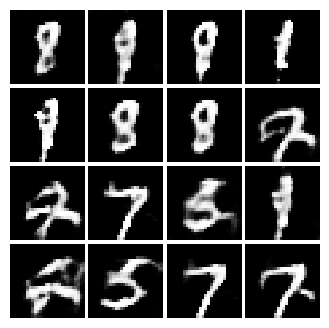

Epoch: 2, Iter: 960, D: 0.5759, G:1.784


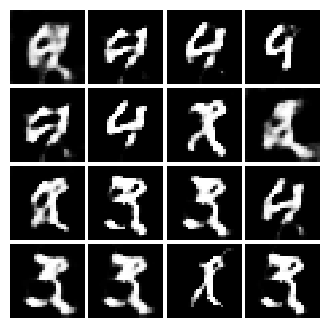

Epoch: 2, Iter: 980, D: 1.509, G:0.7814


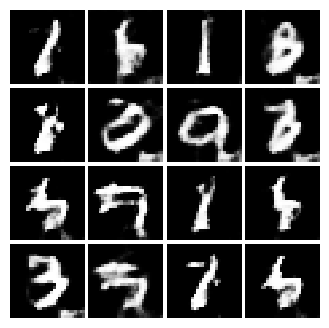

Epoch: 2, Iter: 1000, D: 0.6226, G:2.906


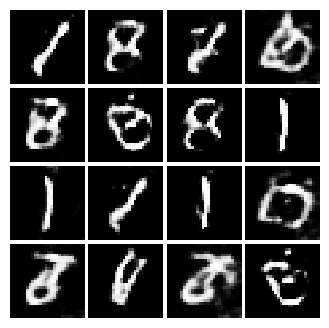

Epoch: 2, Iter: 1020, D: 0.4893, G:2.184


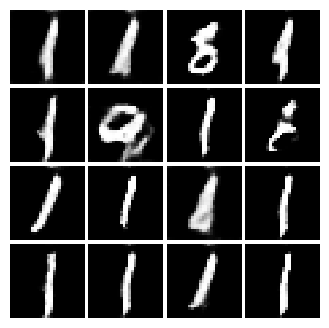

Epoch: 2, Iter: 1040, D: 0.5409, G:2.008


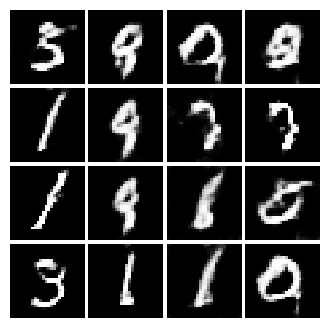

Epoch: 2, Iter: 1060, D: 0.5611, G:3.134


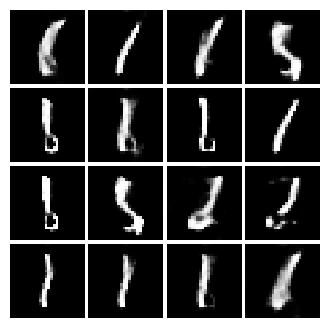

Epoch: 2, Iter: 1080, D: 0.6292, G:1.8


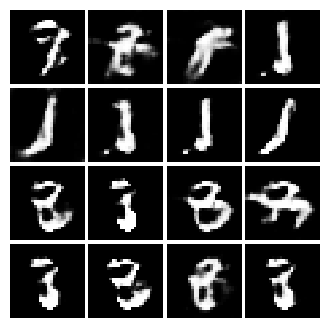

Epoch: 2, Iter: 1100, D: 0.709, G:2.623


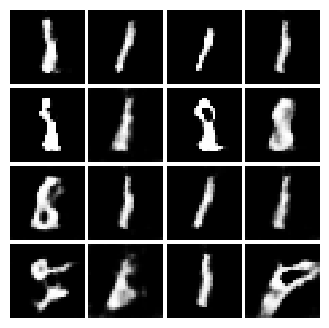

Epoch: 2, Iter: 1120, D: 0.6241, G:2.04


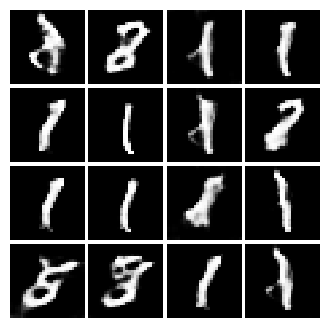

Epoch: 2, Iter: 1140, D: 0.5593, G:1.889


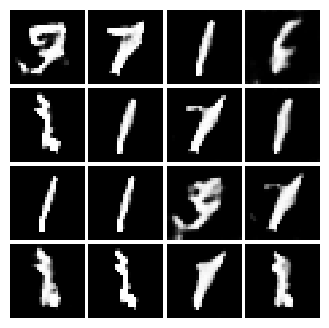

Epoch: 2, Iter: 1160, D: 0.4312, G:2.696


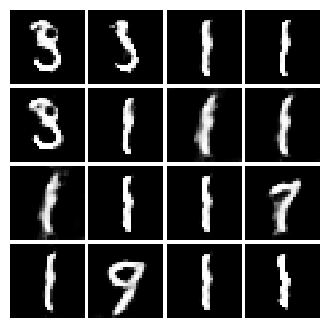

Epoch: 2, Iter: 1180, D: 0.5834, G:2.671


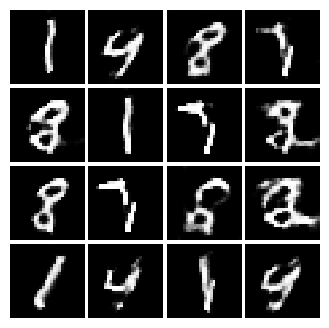

Epoch: 2, Iter: 1200, D: 0.4603, G:2.098


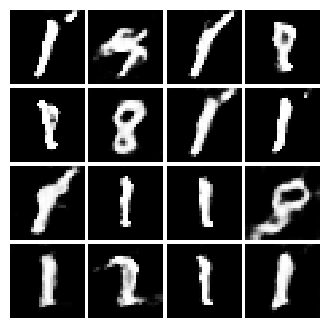

Epoch: 2, Iter: 1220, D: 0.5718, G:2.091


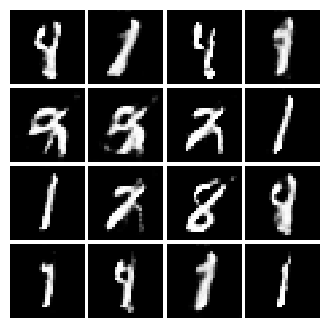

Epoch: 2, Iter: 1240, D: 0.4128, G:2.86


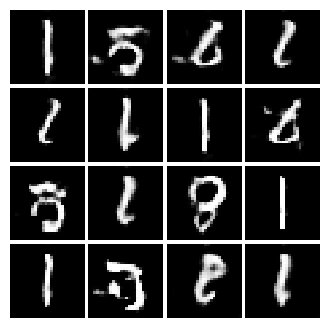

Epoch: 2, Iter: 1260, D: 0.5013, G:1.864


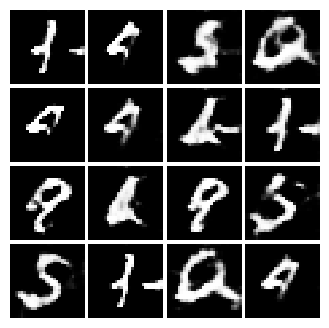

Epoch: 2, Iter: 1280, D: 1.025, G:5.127


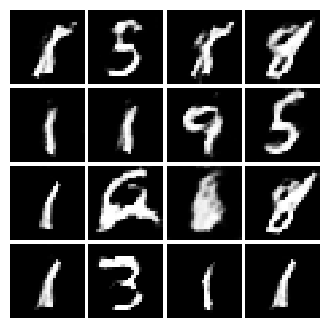

Epoch: 2, Iter: 1300, D: 0.5705, G:3.337


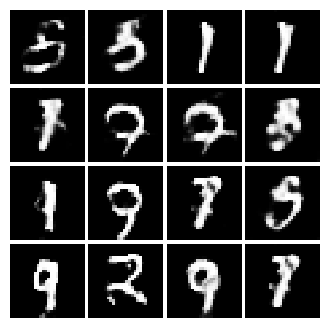

Epoch: 2, Iter: 1320, D: 0.5247, G:2.082


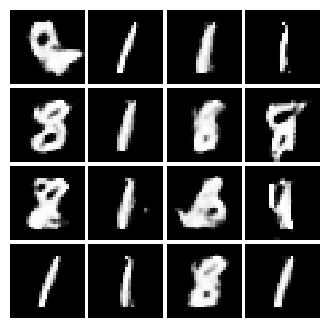

Epoch: 2, Iter: 1340, D: 0.6131, G:2.007


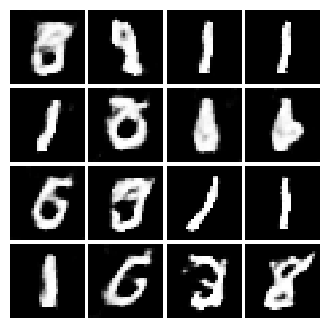

Epoch: 2, Iter: 1360, D: 0.6156, G:3.069


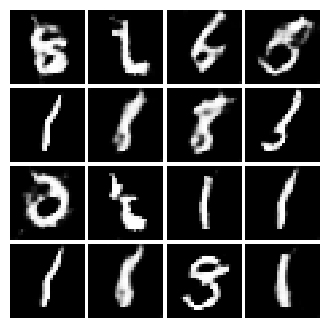

Epoch: 2, Iter: 1380, D: 0.7655, G:2.373


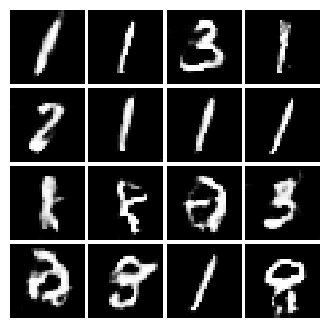

Epoch: 2, Iter: 1400, D: 0.7519, G:1.375


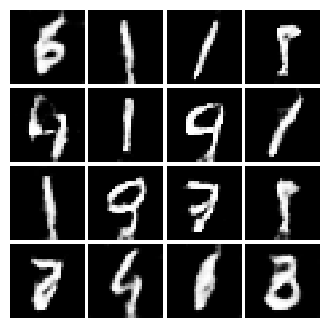

Epoch: 3, Iter: 1420, D: 0.6146, G:1.73


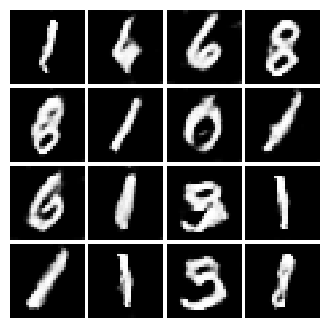

Epoch: 3, Iter: 1440, D: 0.5898, G:2.7


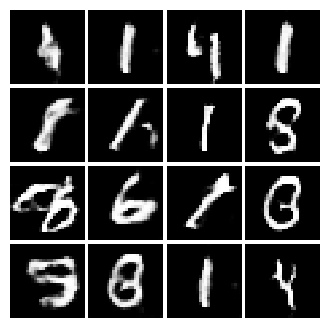

Epoch: 3, Iter: 1460, D: 0.7275, G:1.593


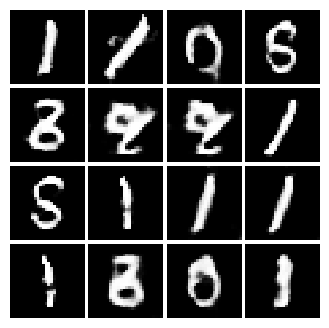

Epoch: 3, Iter: 1480, D: 0.5979, G:2.756


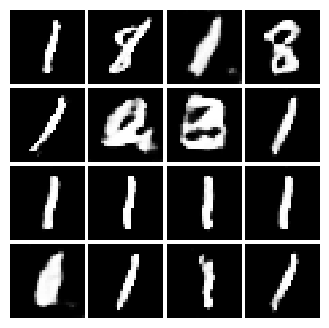

Epoch: 3, Iter: 1500, D: 0.6886, G:1.485


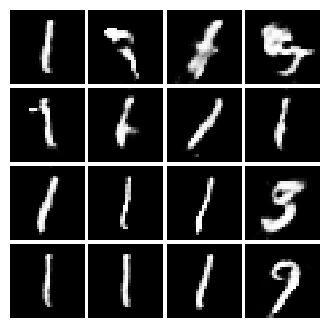

Epoch: 3, Iter: 1520, D: 0.6016, G:1.852


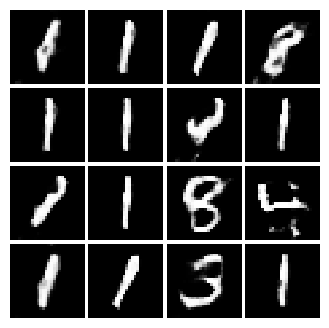

Epoch: 3, Iter: 1540, D: 0.6235, G:1.818


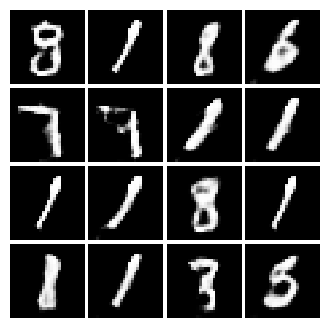

Epoch: 3, Iter: 1560, D: 0.8904, G:1.396


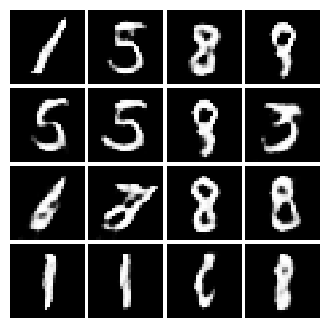

Epoch: 3, Iter: 1580, D: 0.8503, G:1.656


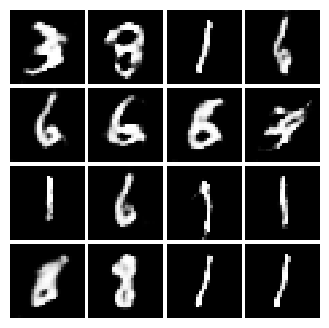

Epoch: 3, Iter: 1600, D: 0.9272, G:1.619


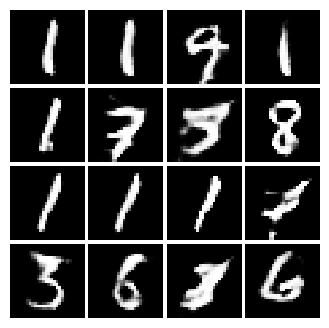

Epoch: 3, Iter: 1620, D: 0.463, G:2.151


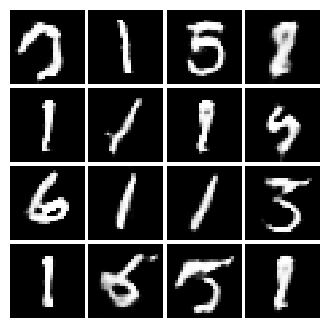

Epoch: 3, Iter: 1640, D: 0.4841, G:2.082


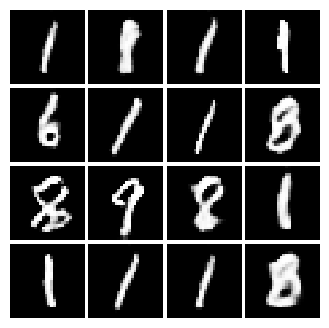

Epoch: 3, Iter: 1660, D: 0.5456, G:1.842


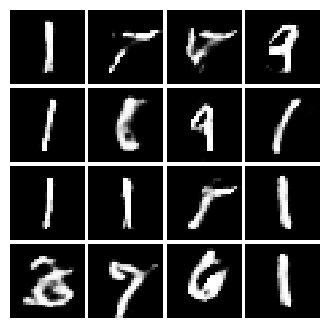

Epoch: 3, Iter: 1680, D: 0.5664, G:2.16


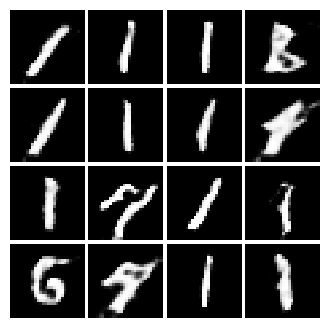

Epoch: 3, Iter: 1700, D: 0.7259, G:1.746


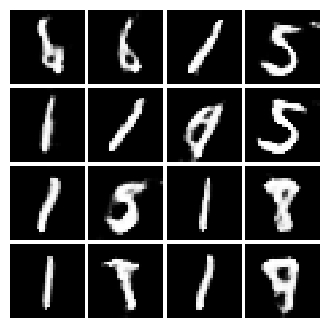

Epoch: 3, Iter: 1720, D: 0.6375, G:2.055


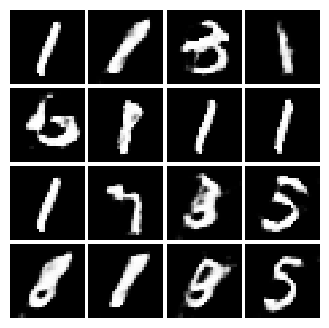

Epoch: 3, Iter: 1740, D: 0.6855, G:2.169


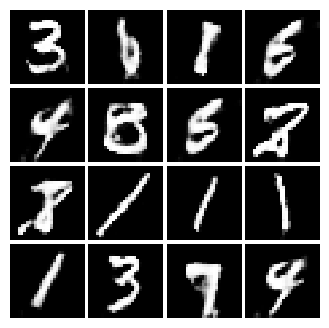

Epoch: 3, Iter: 1760, D: 0.4779, G:2.349


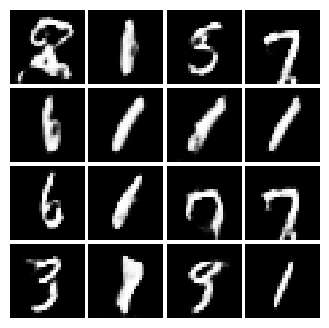

Epoch: 3, Iter: 1780, D: 0.6965, G:2.339


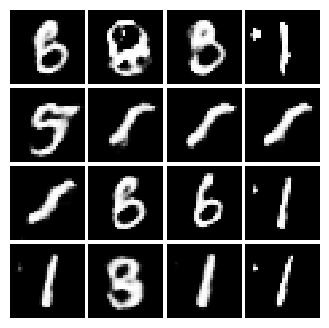

Epoch: 3, Iter: 1800, D: 0.7294, G:1.371


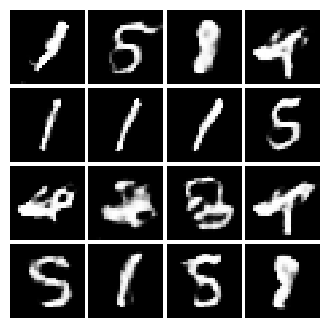

Epoch: 3, Iter: 1820, D: 0.788, G:1.652


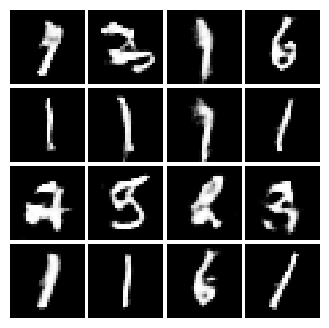

Epoch: 3, Iter: 1840, D: 0.7583, G:2.497


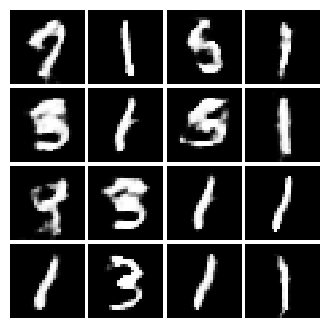

Epoch: 3, Iter: 1860, D: 0.632, G:1.941


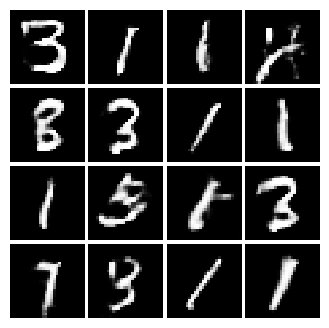

Epoch: 4, Iter: 1880, D: 0.5409, G:1.812


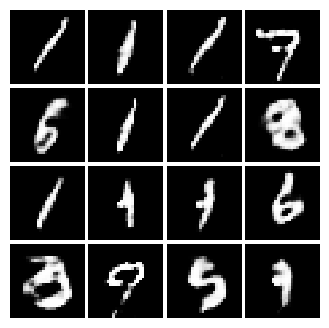

Epoch: 4, Iter: 1900, D: 0.5472, G:2.38


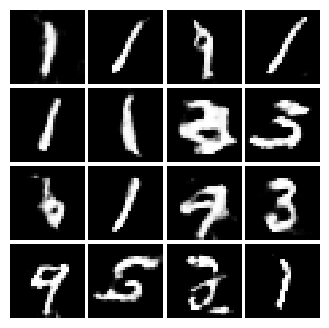

Epoch: 4, Iter: 1920, D: 0.6447, G:2.038


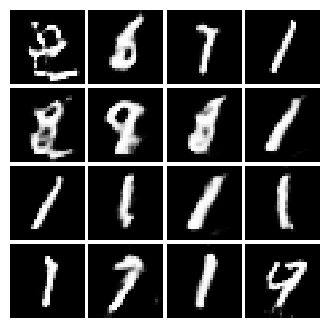

Epoch: 4, Iter: 1940, D: 0.5887, G:2.373


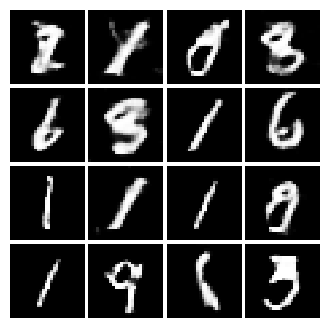

Epoch: 4, Iter: 1960, D: 0.6267, G:1.883


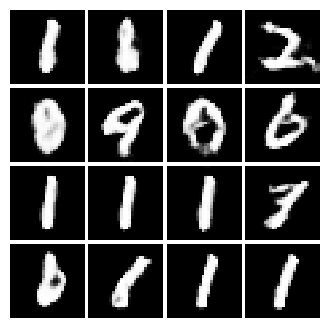

Epoch: 4, Iter: 1980, D: 0.6148, G:2.006


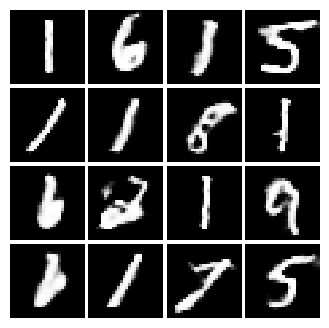

Epoch: 4, Iter: 2000, D: 0.8886, G:1.91


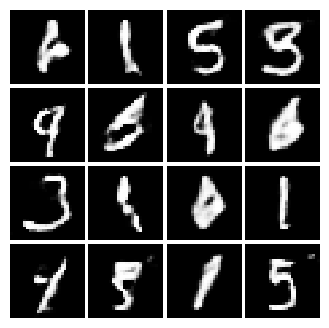

Epoch: 4, Iter: 2020, D: 0.6485, G:1.841


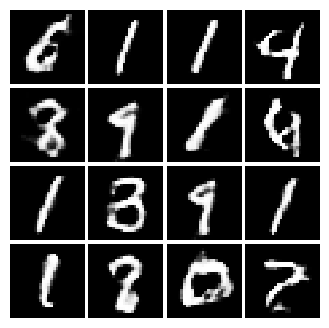

Epoch: 4, Iter: 2040, D: 0.5717, G:1.763


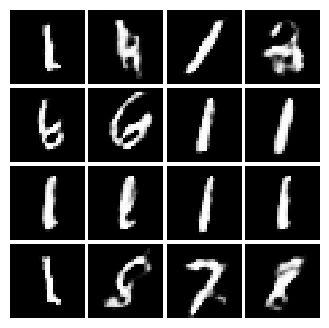

Epoch: 4, Iter: 2060, D: 0.5794, G:2.305


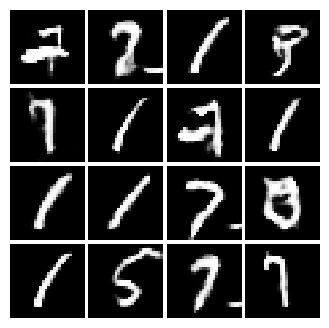

Epoch: 4, Iter: 2080, D: 1.117, G:3.453


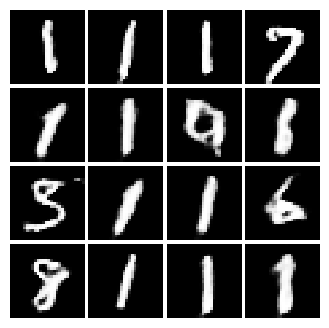

Epoch: 4, Iter: 2100, D: 0.5388, G:1.775


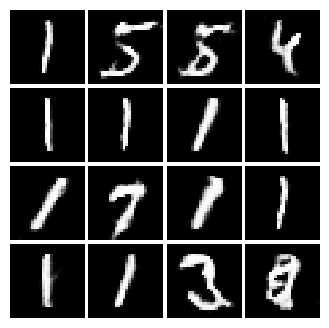

Epoch: 4, Iter: 2120, D: 0.6785, G:2.079


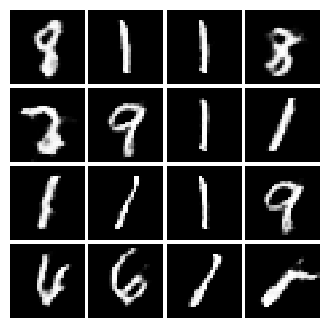

Epoch: 4, Iter: 2140, D: 0.7983, G:1.912


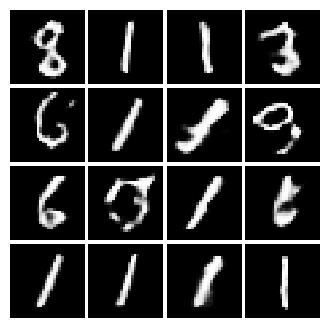

Epoch: 4, Iter: 2160, D: 0.9146, G:1.677


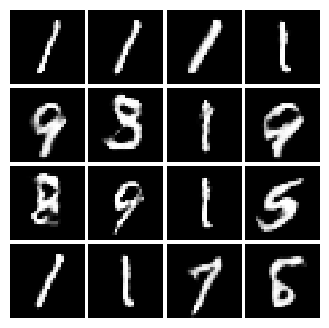

Epoch: 4, Iter: 2180, D: 0.6103, G:1.726


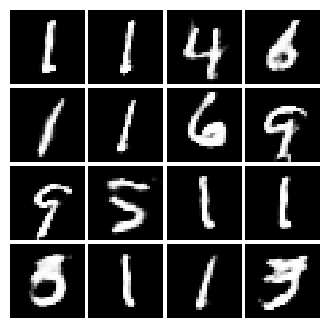

Epoch: 4, Iter: 2200, D: 0.7342, G:1.848


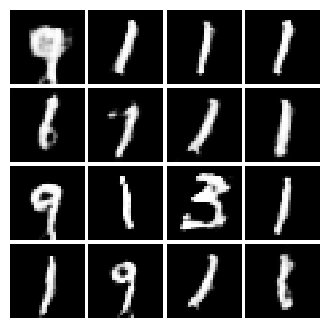

Epoch: 4, Iter: 2220, D: 0.693, G:1.846


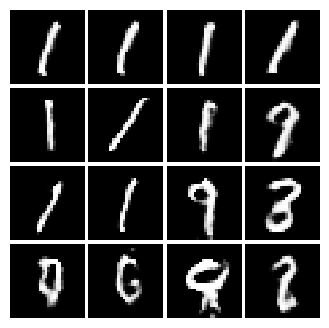

Epoch: 4, Iter: 2240, D: 0.5947, G:1.903


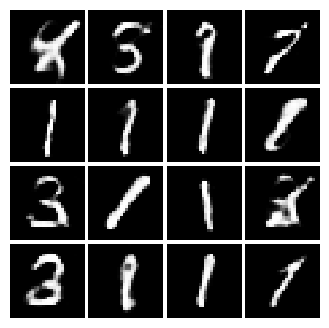

Epoch: 4, Iter: 2260, D: 0.5765, G:1.809


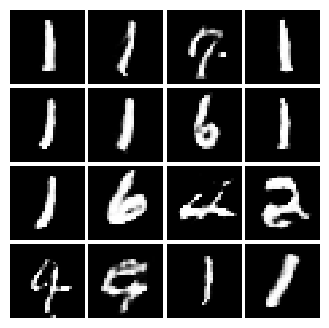

Epoch: 4, Iter: 2280, D: 0.5872, G:1.919


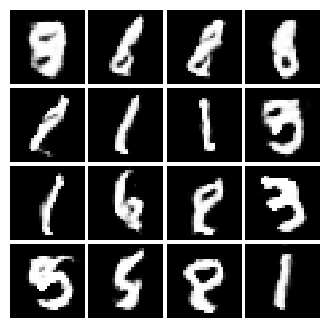

Epoch: 4, Iter: 2300, D: 0.6407, G:2.096


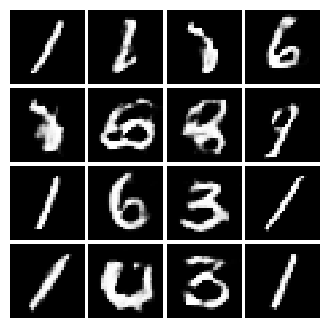

Epoch: 4, Iter: 2320, D: 0.6245, G:2.498


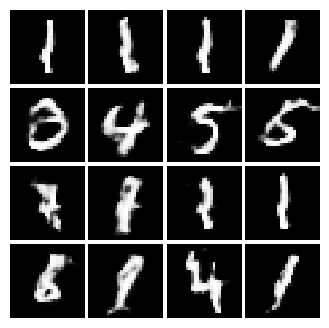

Epoch: 4, Iter: 2340, D: 0.6181, G:2.508


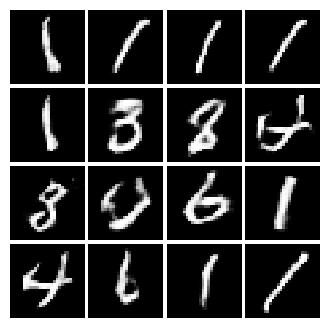

Final images


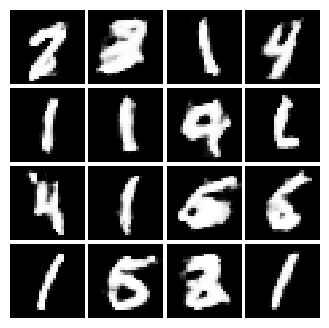

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)